In [ ]:
# Update keras to version 3
!pip install keras keras-tuner --upgrade  --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 9.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 3.3.3 which is incompatible.


In [ ]:
import pandas as pd
import numpy as np
import keras_tuner
import tensorflow
import keras
from keras import Sequential, datasets, initializers, regularizers
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras.optimizers import Adam, SGD, AdamW
from keras.layers import (
    Flatten, BatchNormalization, Conv2D, Dense, Dropout, GlobalAveragePooling2D,
    Input, MaxPooling2D, GlobalMaxPooling2D, AveragePooling2D, Conv2DTranspose, ReLU
)
from keras.models import Model, Sequential
from keras.utils import load_img, img_to_array, to_categorical


from keras_tuner.engine.hyperparameters import HyperParameters
from matplotlib import pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, top_k_accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report

from sklearn.metrics import matthews_corrcoef, precision_recall_curve, auc, fbeta_score

In [ ]:
from keras.applications.xception import Xception, preprocess_input

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data loading and preprocessing


## Original data

In [ ]:
#X_train = np.load('/content/drive/My Drive/DL_FinalProject/data/X_train.npy')
#y_train = np.load('/content/drive/My Drive/DL_FinalProject/data/y_train.npy')
X_valid = np.load('/content/drive/My Drive/DL_FinalProject/data/X_valid.npy')
y_valid = np.load('/content/drive/My Drive/DL_FinalProject/data/y_valid.npy')
X_test = np.load('/content/drive/My Drive/DL_FinalProject/data/X_test.npy')
y_test = np.load('/content/drive/My Drive/DL_FinalProject/data/y_test.npy')

In [ ]:
#print(X_train.shape, y_train.shape)
print(X_valid.shape, y_valid.shape)

(1120, 75, 100, 3) (1120, 7)


Instead of loading the entire dataset into memory, ImageDataGenerator efficiently loads and processes the data on-the-fly. This is especially advantageous for very large datasets that do not fit into memory. Later during fitting we specify the loading.

In [ ]:
#train_datagen = ImageDataGenerator()
#train_datagen.fit(X_train)

val_datagen = ImageDataGenerator()
val_datagen.fit(X_valid)

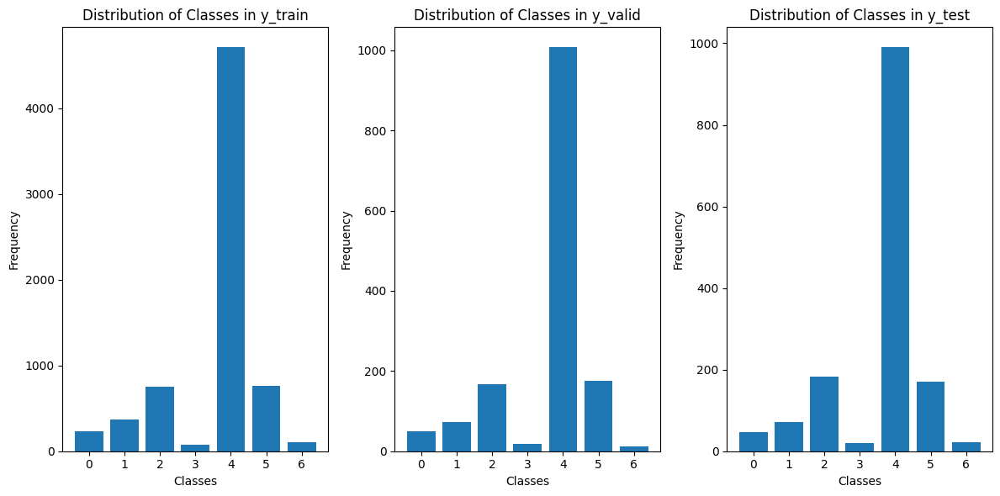

In [ ]:
# Calculate class frequencies for y_train and y_valid
train_support = np.array([np.sum(y_train == label) for label in np.unique(y_train)])
valid_support = np.array([np.sum(y_valid == label) for label in np.unique(y_valid)])
test_support = np.array([np.sum(y_test == label) for label in np.unique(y_test)])

# Get unique class labels
unique_labels_train = np.arange(len(train_support))
unique_labels_valid = np.arange(len(valid_support))
unique_labels_test = np.arange(len(test_support))
# Plotting
plt.figure(figsize=(12, 6))

# Plotting for y_train
plt.subplot(1, 3, 1)
plt.bar(unique_labels_train, train_support)
plt.xticks(unique_labels_train)
plt.xlabel('Classes')
plt.ylabel('Frequency')
plt.title('Distribution of Classes in y_train')

# Plotting for y_valid
plt.subplot(1, 3, 2)
plt.bar(unique_labels_valid, valid_support)
plt.xticks(unique_labels_valid)
plt.xlabel('Classes')
plt.ylabel('Frequency')
plt.title('Distribution of Classes in y_valid')

# Plotting for y_test
plt.subplot(1, 3, 3)
plt.bar(unique_labels_test, test_support)
plt.xticks(unique_labels_test)
plt.xlabel('Classes')
plt.ylabel('Frequency')
plt.title('Distribution of Classes in y_test')

plt.tight_layout()
plt.show()

## Balanced data

In [ ]:
X_balanced_train = np.load('/content/drive/My Drive/DL_FinalProject/data/X_balanced_1000_train.npy')
y_balanced_train = np.load('/content/drive/My Drive/DL_FinalProject/data/y_balanced_1000_train.npy')

In [ ]:
train_datagen_b = ImageDataGenerator()
train_datagen_b.fit(X_balanced_train)

In [ ]:
X_balanced_4000_train = np.load('/content/drive/My Drive/DL_FinalProject/data/X_balanced_4000_train.npy')
y_balanced_4000_train = np.load('/content/drive/My Drive/DL_FinalProject/data/y_balanced_4000_train.npy')

In [ ]:
train_datagen_4000 = ImageDataGenerator()
train_datagen_4000.fit(X_balanced_4000_train)

In [ ]:
X_balanced_6000_train = np.load('/content/drive/My Drive/DL_FinalProject/data/X_balanced_6000_train.npy')
y_balanced_6000_train = np.load('/content/drive/My Drive/DL_FinalProject/data/y_balanced_6000_train.npy')

In [ ]:
train_datagen_6000 = ImageDataGenerator()
train_datagen_6000.fit(X_balanced_6000_train)

# Helper functions

In [ ]:
import matplotlib.pyplot as plt

def plot_metrics(history):
    metrics = ['loss', 'prc', 'precision', 'recall']
    num_metrics = len(metrics)

    fig, axs = plt.subplots(2, 2, figsize=(10, 8))

    for n, metric in enumerate(metrics):
        name = metric.replace("_"," ").capitalize()
        ax = axs[n // 2, n % 2]
        ax.plot(history.epoch, history.history[metric], label='Train')
        ax.plot(history.epoch, history.history['val_'+metric], linestyle="--", label='Val')
        ax.set_xlabel('Epoch')
        ax.set_ylabel(name)

        if metric == 'loss':
            max_val = max(max(history.history[metric]), max(history.history['val_'+metric]))
            ax.set_ylim([0, max_val * 1.1])
        else:
            ax.set_ylim([0, 1.0])

        ax.legend()

        # Print the values of the metric next to the plot
        train_value = round(history.history[metric][-1], 3)
        val_value = round(history.history['val_'+metric][-1], 3)
        ax.text(0.5, 0.5, f"Train: {train_value}\nVal: {val_value}", transform=ax.transAxes, fontsize=10,
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

    plt.tight_layout()
    plt.show()

In [ ]:
def calculate_and_print_scores(y_true, y_pred):
    mcc = matthews_corrcoef(y_true, y_pred)
    print("Matthews Correlation Coefficient (MCC): {:.4f}".format(mcc))

    fbeta_macro = fbeta_score(y_true, y_pred, average='macro', beta=2.0)
    print("F-beta Score (macro averaging): {:.4f}".format(fbeta_macro))

    fbeta_weighted = fbeta_score(y_true, y_pred, average='weighted', beta=2.0)
    print("F-beta Score (weighted averaging): {:.4f}".format(fbeta_weighted))

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.Accuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

# Pretrained model preds baseline
resized only for baseline model

## Original data

In [ ]:
#X_train_xcept = preprocess_input(X_train)
#X_valid_xcept = preprocess_input(X_valid)
#X_test_xcept = preprocess_input(X_test)

In [ ]:
#y_train_xcept = y_train.argmax(axis=1)
#y_valid_xcept = y_valid.argmax(axis=1)
#y_test_xcept = y_test.argmax(axis=1)

In [ ]:
from tensorflow.image import resize

X_train_resized = resize(X_train, [299, 299])
X_valid_resized = resize(X_valid, [299, 299])
#X_test_resized = resize(X_test, [299, 299])

X_train_xcept = X_train_resized / 255.0
X_valid_xcept  = X_valid_resized / 255.0
#X_test_xcept  = X_test_resized / 255.0

print("Resized and normalized training data shape:", X_train_resized.shape)
print("Resized and normalized validation data shape:", X_valid_resized.shape)
#print("Resized and normalized test data shape:", X_test_resized.shape)

ResourceExhaustedError: {{function_node __wrapped__ResizeBilinear_device_/job:localhost/replica:0/task:0/device:GPU:0}} OOM when allocating tensor with shape[5229,299,299,3] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:ResizeBilinear] name: 

In [ ]:
xception_baseline = Xception(include_top=True,
                            weights="imagenet",
                            input_tensor=None,
                            input_shape=None,
                            pooling=None,
                            classes=1000,
                            classifier_activation="softmax")

91884032/91884032 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [ ]:
xception_baseline_train = xception_baseline.predict(X_train_xcept, batch_size=128)

55/55 ━━━━━━━━━━━━━━━━━━━━ 56s 548ms/step


In [ ]:
xception_baseline_valid = xception_baseline.predict(X_valid_xcept, batch_size=128)

12/12 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step


In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}
display_labels = [class_names[i] for i in range(len(class_names))]

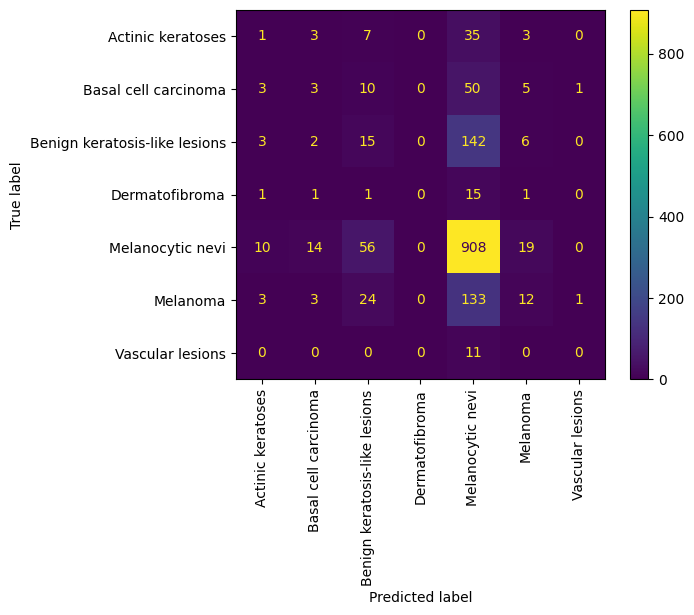

In [ ]:
y_pred_xcept = KNeighborsClassifier(metric="cosine").fit(xception_baseline_train, y_train_xcept).predict(xception_baseline_valid)
ConfusionMatrixDisplay.from_predictions(y_valid_xcept, y_pred_xcept,
                                        display_labels=display_labels,
                                        xticks_rotation="vertical")

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_valid_xcept, y_pred_xcept, target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.05      0.02      0.03        49
         Basal cell carcinoma       0.12      0.04      0.06        72
Benign keratosis-like lesions       0.13      0.09      0.11       168
               Dermatofibroma       0.00      0.00      0.00        19
             Melanocytic nevi       0.70      0.90      0.79      1007
                     Melanoma       0.26      0.07      0.11       176
             Vascular lesions       0.00      0.00      0.00        11

                     accuracy                           0.63      1502
                    macro avg       0.18      0.16      0.16      1502
                 weighted avg       0.52      0.63      0.56      1502



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Adding layers on top and finetuning (freeze layers)

## Original data


### no weights

In [ ]:
xception_baseline_7cl = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_baseline_7cl.layers:
    layer.trainable = False

In [ ]:
x = xception_baseline_7cl.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(7, activation='softmax')(x)

In [ ]:
comb_model = Model(inputs=xception_baseline_7cl.input, outputs=predictions)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
comb_model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=metrics)
comb_model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)

In [ ]:
batch_size = 128
epochs = 50
history = comb_model.fit(train_datagen.flow(X_train, y_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


40/40 ━━━━━━━━━━━━━━━━━━━━ 35s 498ms/step - cat_accuracy: 0.6168 - fbeta_score: 0.1430 - loss: 1.4014 - prc: 0.5824 - precision: 0.7217 - recall: 0.3052 - val_cat_accuracy: 0.7188 - val_fbeta_score: 0.1817 - val_loss: 1.0427 - val_prc: 0.7429 - val_precision: 0.8603 - val_recall: 0.4570
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - cat_accuracy: 0.7422 - fbeta_score: 0.2420 - loss: 1.0219 - prc: 0.7906 - precision: 0.9403 - recall: 0.4922 - val_cat_accuracy: 0.7266 - val_fbeta_score: 0.1611 - val_loss: 1.0428 - val_prc: 0.7606 - val_precision: 0.8986 - val_recall: 0.4844
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - cat_accuracy: 0.7285 - fbeta_score: 0.1867 - loss: 1.0218 - prc: 0.7552 - precision: 0.8266 - recall: 0.5049 - val_cat_accuracy: 0.7148 - val_fbeta_score: 0.2006 - val_loss: 1.0429 - val_prc: 0.7358 - val_precision: 0.8365 - val_recall: 0.5195
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - cat_accuracy: 0.7812 - fbeta_score: 0.1333 - loss: 0.8620 - prc: 0.8114 - precision: 0.8718 - recall: 0.5312 - val_cat_accuracy: 0.7266 - val_fbeta_score: 0.1662 - val_loss: 0.9988 - val_prc: 0.7640 - val_precision: 0.8589 - val_recall: 0.5469
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - cat_accuracy: 0.7548 - fbeta_score: 0.2378 - loss: 0.8531 - prc: 0.8089 - precision: 0.8558 - recall: 0.5776 - val_cat_accuracy: 0.7422 - val_fbeta_score: 0.1575 - val_loss: 0.8076 - val_prc: 0.8277 - val_precision: 0.8791 - val_recall: 0.6250
Epoch 8/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - cat_accuracy: 0.7266 - fbeta_score: 0.2564 - loss: 0.9100 - prc: 0.78

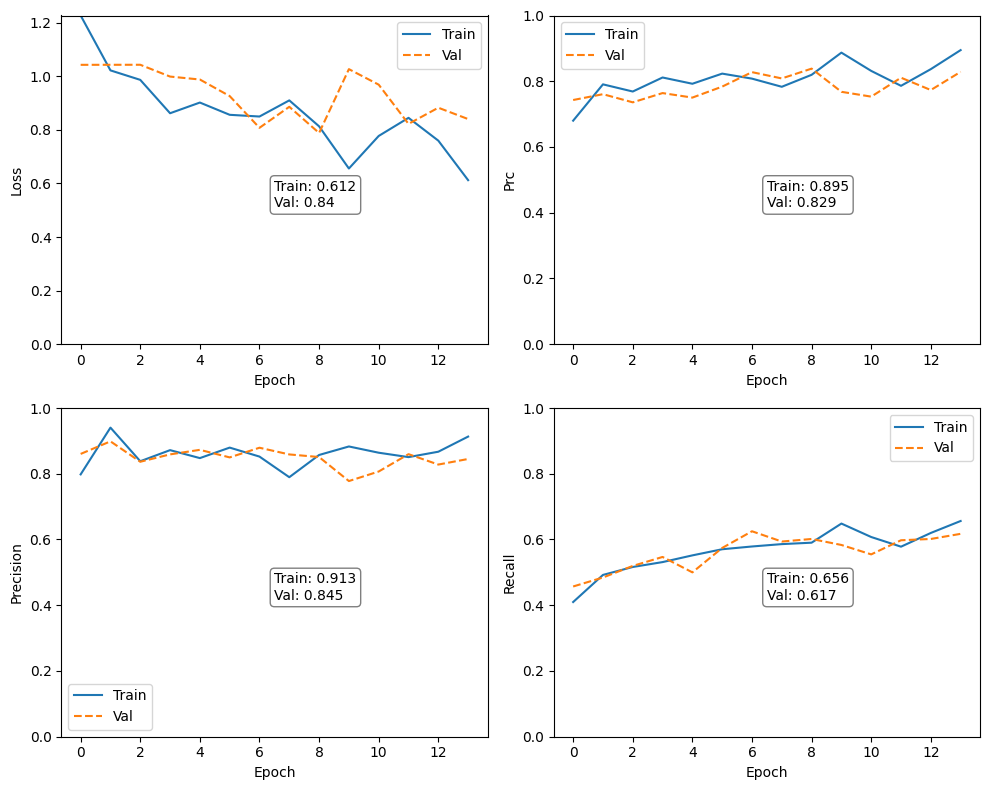

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = comb_model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step


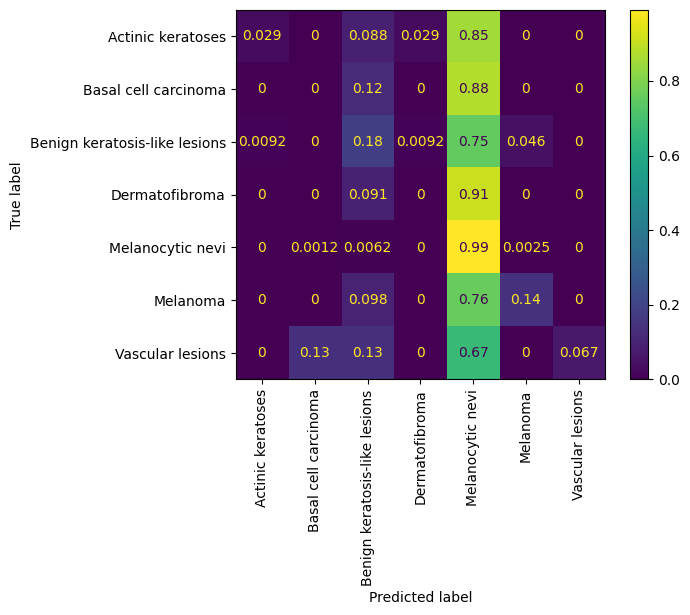

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.50      0.03      0.06        34
         Basal cell carcinoma       0.00      0.00      0.00        49
Benign keratosis-like lesions       0.43      0.18      0.26       109
               Dermatofibroma       0.00      0.00      0.00        11
             Melanocytic nevi       0.77      0.99      0.86       810
                     Melanoma       0.65      0.14      0.23        92
             Vascular lesions       1.00      0.07      0.12        15

                     accuracy                           0.75      1120
                    macro avg       0.48      0.20      0.22      1120
                 weighted avg       0.68      0.75      0.67      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.2761
F-beta Score (macro averaging): 0.2041
F-beta Score (weighted averaging): 0.7128


In [ ]:
model_train_preds = comb_model.predict(X_train, batch_size = 128)

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step


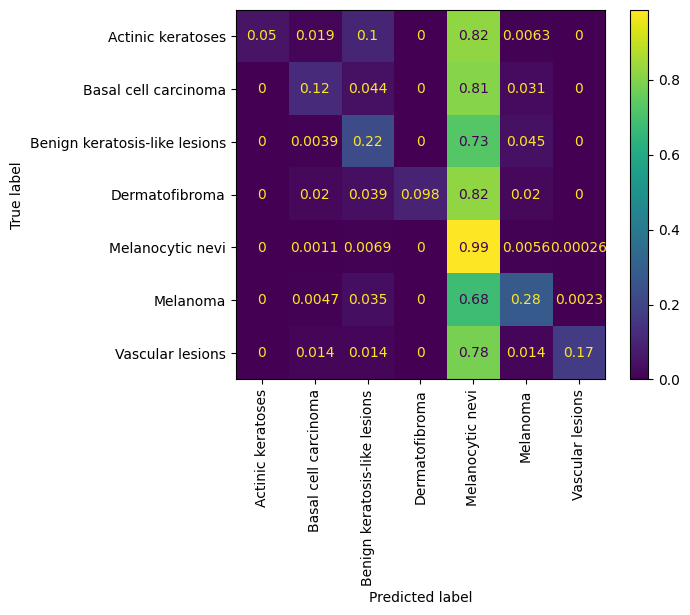

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       1.00      0.05      0.10       159
         Basal cell carcinoma       0.68      0.12      0.20       229
Benign keratosis-like lesions       0.62      0.22      0.33       509
               Dermatofibroma       1.00      0.10      0.18        51
             Melanocytic nevi       0.78      0.99      0.87      3782
                     Melanoma       0.69      0.28      0.40       430
             Vascular lesions       0.86      0.17      0.29        69

                     accuracy                           0.77      5229
                    macro avg       0.80      0.28      0.34      5229
                 weighted avg       0.76      0.77      0.71      5229



In [ ]:
calculate_and_print_scores(y_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.3658
F-beta Score (macro averaging): 0.2913
F-beta Score (weighted averaging): 0.7398


### no weights - tryout 2

In [ ]:
xception_baseline_7cl = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_baseline_7cl.layers:
    layer.trainable = False

In [ ]:
x = xception_baseline_7cl.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(7, activation='softmax')(x)

In [ ]:
comb_model = Model(inputs=xception_baseline_7cl.input, outputs=predictions)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
comb_model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=metrics)
comb_model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)

In [ ]:
batch_size = 128
epochs = 50
history = comb_model.fit(train_datagen.flow(X_train, y_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


40/40 ━━━━━━━━━━━━━━━━━━━━ 19s 247ms/step - cat_accuracy: 0.6582 - fbeta_score: 0.1484 - loss: 1.3000 - prc: 0.6465 - precision: 0.7705 - recall: 0.4219 - val_cat_accuracy: 0.7148 - val_fbeta_score: 0.1645 - val_loss: 0.8858 - val_prc: 0.8144 - val_precision: 0.9189 - val_recall: 0.5312
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - cat_accuracy: 0.5859 - fbeta_score: 0.1370 - loss: 1.1250 - prc: 0.6798 - precision: 0.8116 - recall: 0.4375 - val_cat_accuracy: 0.6953 - val_fbeta_score: 0.1581 - val_loss: 0.9411 - val_prc: 0.7659 - val_precision: 0.8625 - val_recall: 0.5391
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - cat_accuracy: 0.7377 - fbeta_score: 0.1777 - loss: 0.8942 - prc: 0.7935 - precision: 0.8517 - recall: 0.5820 - val_cat_accuracy: 0.7578 - val_fbeta_score: 0.1703 - val_loss: 0.7311 - val_prc: 0.8364 - val_precision: 0.8564 - val_recall: 0.6758
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - cat_accuracy: 0.7031 - fbeta_score: 0.1320 - loss: 0.8098 - prc: 0.8172 - precision: 0.8077 - recall: 0.6562 - val_cat_accuracy: 0.7578 - val_fbeta_score: 0.1808 - val_loss: 0.7684 - val_prc: 0.8292 - val_precision: 0.8557 - val_recall: 0.6719
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - cat_accuracy: 0.7416 - fbeta_score: 0.1926 - loss: 0.8273 - prc: 0.8098 - precision: 0.8574 - recall: 0.6223 - val_cat_accuracy: 0.6771 - val_fbeta_score: 0.1588 - val_loss: 0.9218 - val_prc: 0.7722 - val_precision: 0.8333 - val_recall: 0.6250
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - cat_accuracy: 0.6875 - fbeta_score: 0.2321 - loss: 0.9141 - prc: 0.78

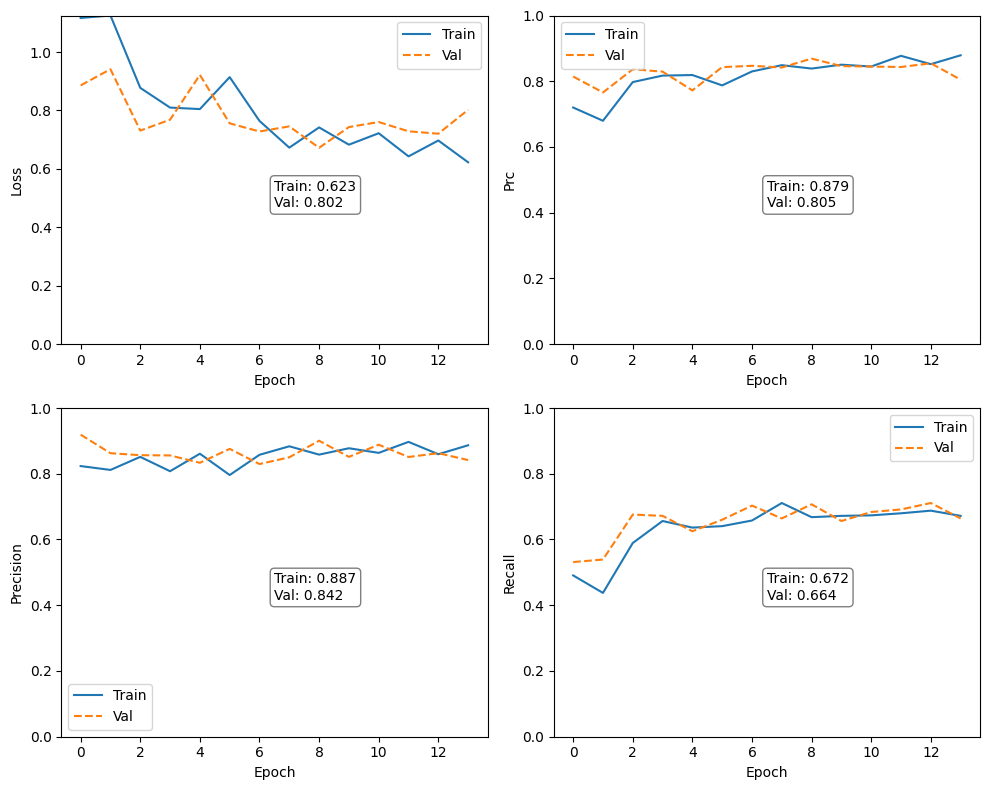

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = comb_model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 369ms/step


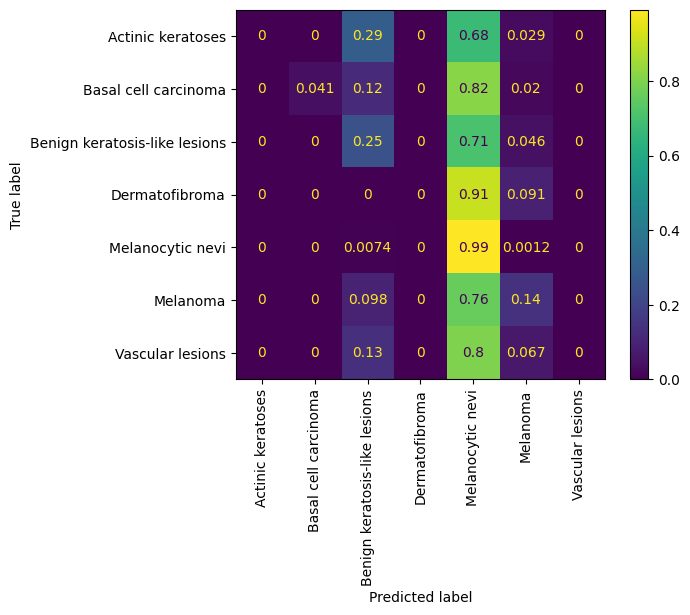

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.00      0.00      0.00        34
         Basal cell carcinoma       1.00      0.04      0.08        49
Benign keratosis-like lesions       0.45      0.25      0.32       109
               Dermatofibroma       0.00      0.00      0.00        11
             Melanocytic nevi       0.78      0.99      0.87       810
                     Melanoma       0.57      0.14      0.23        92
             Vascular lesions       0.00      0.00      0.00        15

                     accuracy                           0.75      1120
                    macro avg       0.40      0.20      0.21      1120
                 weighted avg       0.70      0.75      0.68      1120



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.3097
F-beta Score (macro averaging): 0.2040
F-beta Score (weighted averaging): 0.7216


In [ ]:
model_train_preds = comb_model.predict(X_train, batch_size = 128)

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step


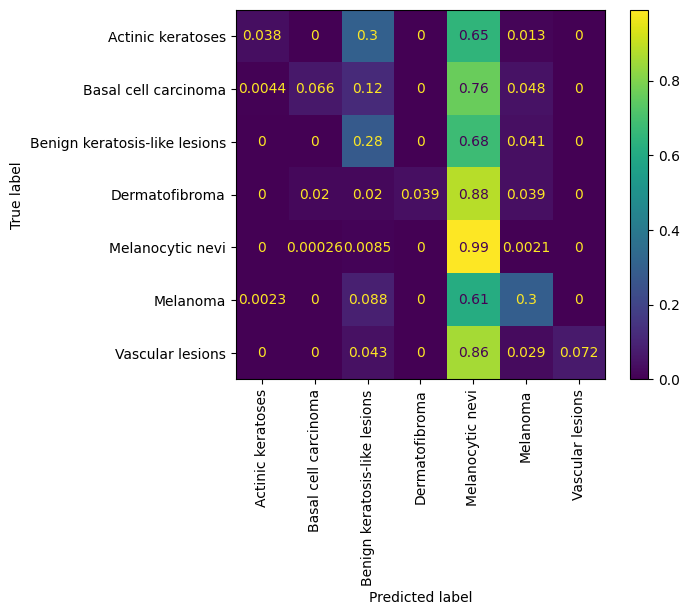

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       1.00      0.05      0.10       159
         Basal cell carcinoma       0.68      0.12      0.20       229
Benign keratosis-like lesions       0.62      0.22      0.33       509
               Dermatofibroma       1.00      0.10      0.18        51
             Melanocytic nevi       0.78      0.99      0.87      3782
                     Melanoma       0.69      0.28      0.40       430
             Vascular lesions       0.86      0.17      0.29        69

                     accuracy                           0.77      5229
                    macro avg       0.80      0.28      0.34      5229
                 weighted avg       0.76      0.77      0.71      5229



In [ ]:
calculate_and_print_scores(y_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.3658
F-beta Score (macro averaging): 0.2913
F-beta Score (weighted averaging): 0.7398


### with weights

In [ ]:
xception_baseline_7cl = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_baseline_7cl.layers:
    layer.trainable = False

In [ ]:
x = xception_baseline_7cl.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(7, activation='softmax')(x)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight

num_classes = y_train.shape[1]
class_weights = compute_class_weight('balanced', classes=np.unique(np.argmax(y_train, axis=1)), y=np.argmax(y_train, axis=1))
class_weight_dict = {i : class_weights[i] for i in range(num_classes)}

In [ ]:
comb_model_w = Model(inputs=xception_baseline_7cl.input, outputs=predictions)

In [ ]:
comb_model_w.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=metrics)
#comb_model_w.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = comb_model_w.fit(train_datagen.flow(X_train, y_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              class_weight=class_weight_dict,
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


40/40 ━━━━━━━━━━━━━━━━━━━━ 15s 187ms/step - cat_accuracy: 0.3894 - fbeta_score: 0.1629 - loss: 1.9444 - prc: 0.3504 - precision: 0.6238 - recall: 0.0618 - val_cat_accuracy: 0.4961 - val_fbeta_score: 0.2223 - val_loss: 1.5309 - val_prc: 0.5129 - val_precision: 0.8684 - val_recall: 0.1289 - learning_rate: 0.0010
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - cat_accuracy: 0.4219 - fbeta_score: 0.2178 - loss: 1.8990 - prc: 0.4429 - precision: 0.7857 - recall: 0.0859 - val_cat_accuracy: 0.5117 - val_fbeta_score: 0.2150 - val_loss: 1.5456 - val_prc: 0.5010 - val_precision: 0.8478 - val_recall: 0.1523 - learning_rate: 0.0010
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - cat_accuracy: 0.5157 - fbeta_score: 0.3073 - loss: 1.6626 - prc: 0.4937 - precision: 0.7738 - recall: 0.1308 - val_cat_accuracy: 0.5312 - val_fbeta_score: 0.2636 - val_loss: 1.3737 - val_prc: 0.5890 - val_precision: 0.8594 - val_recall: 0.2148 - learning_rate: 0.0010
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - cat_accuracy: 0.4922 - fbeta_score: 0.3488 - loss: 1.5564 - prc: 0.5673 - precision: 0.7500 - recall: 0.2109 - val_cat_accuracy: 0.4844 - val_fbeta_score: 0.2274 - val_loss: 1.4444 - val_prc: 0.5267 - val_precision: 0.7966 - val_recall: 0.1836 - learning_rate: 0.0010
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - cat_accuracy: 0.5148 - fbeta_score: 0.3335 - loss: 1.5117 - prc: 0.5370 - precision: 0.8001 - recall: 0.1940 - val_cat_accuracy: 0.5521 - val_fbeta_score: 0.4009 - val_loss: 1.3668 - val_prc: 0.5940 - val_precision: 0.8519 - val_recall: 0.2396 - learning_rate: 0.0010
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

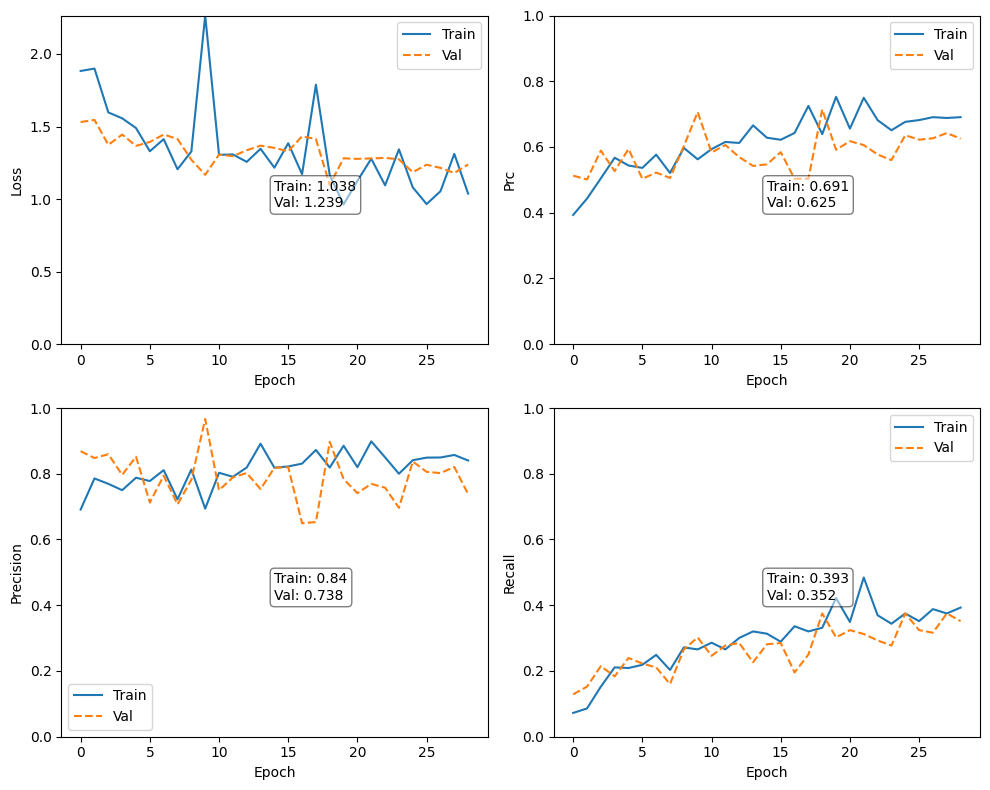

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = comb_model_w.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 340ms/step


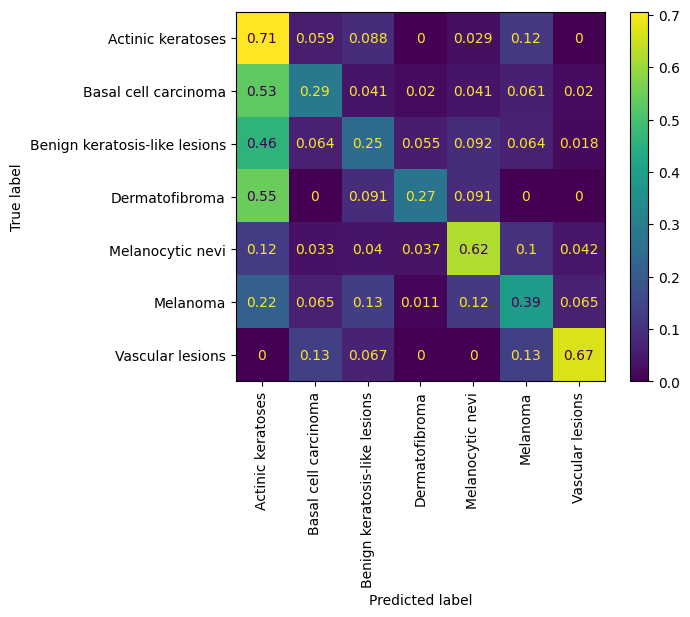

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.11      0.71      0.18        34
         Basal cell carcinoma       0.24      0.29      0.26        49
Benign keratosis-like lesions       0.35      0.25      0.29       109
               Dermatofibroma       0.07      0.27      0.12        11
             Melanocytic nevi       0.95      0.62      0.75       810
                     Melanoma       0.27      0.39      0.32        92
             Vascular lesions       0.19      0.67      0.29        15

                     accuracy                           0.55      1120
                    macro avg       0.31      0.46      0.32      1120
                 weighted avg       0.76      0.55      0.62      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.3230
F-beta Score (macro averaging): 0.3593
F-beta Score (weighted averaging): 0.5683


In [ ]:
model_train_preds = comb_model_w.predict(X_train, batch_size = 128)

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step


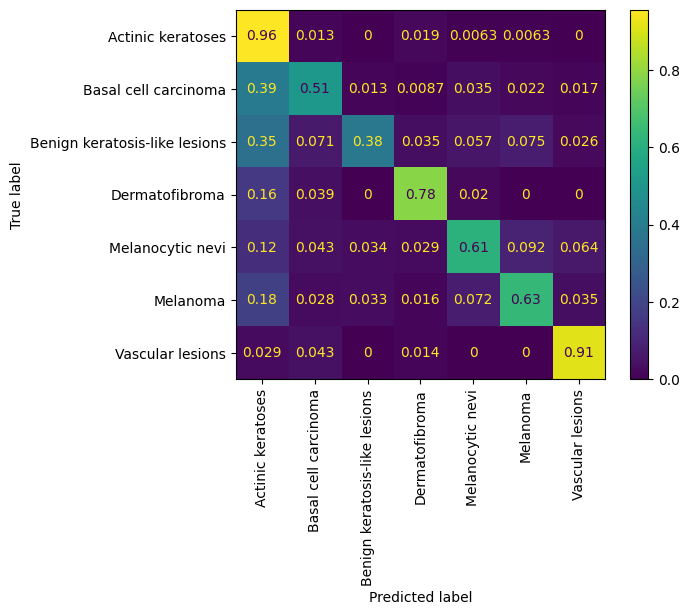

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.15      0.96      0.27       159
         Basal cell carcinoma       0.35      0.51      0.41       229
Benign keratosis-like lesions       0.58      0.38      0.46       509
               Dermatofibroma       0.22      0.78      0.34        51
             Melanocytic nevi       0.97      0.61      0.75      3782
                     Melanoma       0.41      0.63      0.50       430
             Vascular lesions       0.19      0.91      0.31        69

                     accuracy                           0.60      5229
                    macro avg       0.41      0.68      0.43      5229
                 weighted avg       0.82      0.60      0.66      5229



In [ ]:
calculate_and_print_scores(y_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.4286
F-beta Score (macro averaging): 0.5161
F-beta Score (weighted averaging): 0.6120


## Balanced data

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = GlobalMaxPooling2D()(last_output)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(32, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, x)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step - cat_accuracy: 0.2122 - fbeta_score: 0.2084 - loss: 1.9659 - prc: 0.2045 - precision: 0.3376 - recall: 0.0236 - val_cat_accuracy: 0.6641 - val_fbeta_score: 0.2448 - val_loss: 1.2689 - val_prc: 0.7175 - val_precision: 0.9841 - val_recall: 0.2422 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 395us/step - cat_accuracy: 0.4141 - fbeta_score: 0.4110 - loss: 1.6395 - prc: 0.4185 - precision: 0.7143 - recall: 0.1172 - val_cat_accuracy: 0.5742 - val_fbeta_score: 0.2109 - val_loss: 1.3947 - val_prc: 0.6275 - val_precision: 0.9250 - val_recall: 0.1445 - learning_rate: 1.0000e-04
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.3858 - fbeta_score: 0.3813 - loss: 1.6095 - prc: 0.3999 - precision: 0.6749 - recall: 0.1177 - val_cat_accuracy: 0.6328 - val_fbeta_score: 0.3479 - val_loss: 1.2184 - val_prc: 0.7008 - val_precision: 0.9296 - val_recall: 0.2578 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - cat_accuracy: 0.3516 - fbeta_score: 0.3429 - loss: 1.5787 - prc: 0.4089 - precision: 0.6667 - recall: 0.1250 - val_cat_accuracy: 0.6797 - val_fbeta_score: 0.2766 - val_loss: 1.1437 - val_prc: 0.7349 - val_precision: 0.9368 - val_recall: 0.3477 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.4382 - fbeta_score: 0.4348 - loss: 1.4856 - prc: 0.4704 - precision: 0.7100 - recall: 0.1732 - val_cat_accuracy: 0.5938 - val_fbeta_score: 0.3122 - val_loss: 1.1876 - val_prc: 0.6913 - val_precision: 0.9429 - val_recall: 0.3438 - learning_rate: 1.0000e-04
Epoch 6/50
328/328 ━━━━━━━━

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 373ms/step


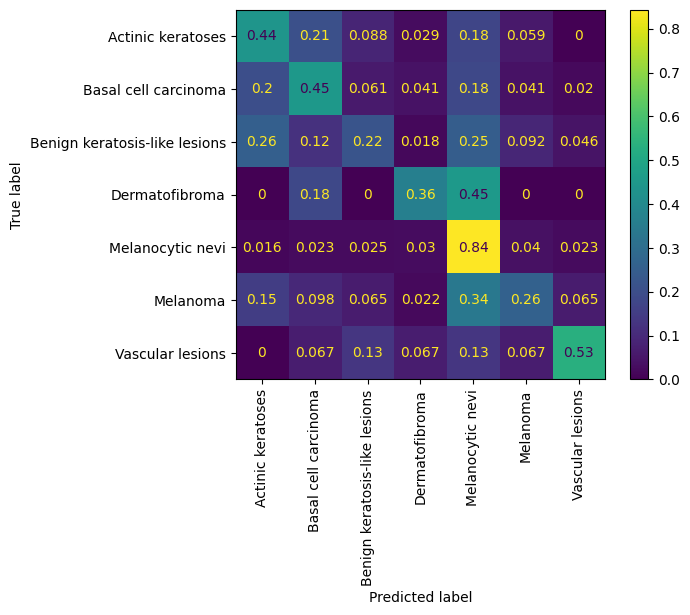

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.19      0.44      0.26        34
         Basal cell carcinoma       0.30      0.45      0.36        49
Benign keratosis-like lesions       0.41      0.22      0.29       109
               Dermatofibroma       0.11      0.36      0.17        11
             Melanocytic nevi       0.90      0.84      0.87       810
                     Melanoma       0.34      0.26      0.29        92
             Vascular lesions       0.21      0.53      0.30        15

                     accuracy                           0.70      1120
                    macro avg       0.35      0.44      0.36      1120
                 weighted avg       0.74      0.70      0.71      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.3856
F-beta Score (macro averaging): 0.3971
F-beta Score (weighted averaging): 0.6994


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step


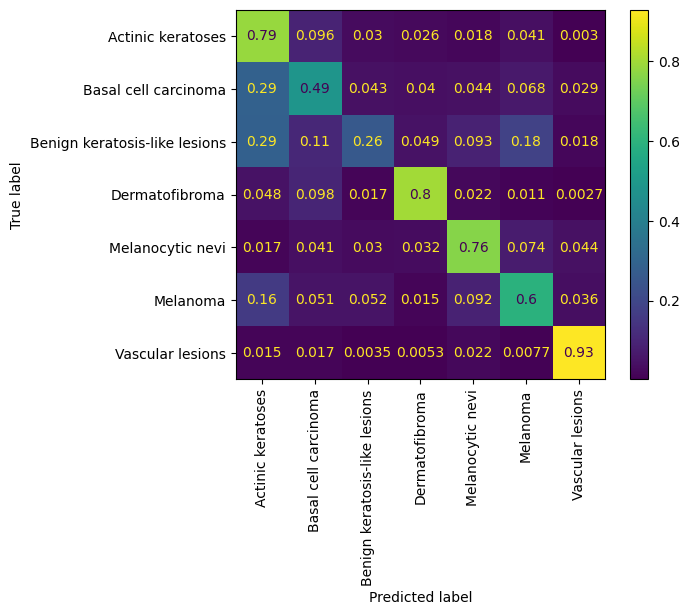

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.49      0.79      0.60      6000
         Basal cell carcinoma       0.54      0.49      0.51      6000
Benign keratosis-like lesions       0.60      0.26      0.36      6000
               Dermatofibroma       0.83      0.80      0.81      6000
             Melanocytic nevi       0.72      0.76      0.74      6000
                     Melanoma       0.61      0.60      0.60      6000
             Vascular lesions       0.88      0.93      0.90      6000

                     accuracy                           0.66     42000
                    macro avg       0.67      0.66      0.65     42000
                 weighted avg       0.67      0.66      0.65     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.6090
F-beta Score (macro averaging): 0.6530
F-beta Score (weighted averaging): 0.6530


# Adding layers on top and finetuning (warm start)

## Original data

### no weights

In [ ]:
xception_baseline_7cl_1 = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_baseline_7cl_1.layers:
    layer.trainable = True

In [ ]:
x = xception_baseline_7cl_1.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(7, activation='softmax')(x)

In [ ]:
comb_model_1 = Model(inputs=xception_baseline_7cl_1.input, outputs=predictions)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.Accuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
comb_model_1.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=metrics)
#comb_model_1.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)

In [ ]:
batch_size = 128
epochs = 50
history = comb_model_1.fit(train_datagen.flow(X_train, y_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


40/40 ━━━━━━━━━━━━━━━━━━━━ 83s 846ms/step - accuracy: 3.7431e-05 - fbeta_score: 0.2562 - loss: 0.9465 - prc: 0.7625 - precision: 0.8770 - recall: 0.5250 - val_accuracy: 0.0580 - val_fbeta_score: 0.1899 - val_loss: 3.5235 - val_prc: 0.6593 - val_precision: 0.7383 - val_recall: 0.7383
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0000e+00 - fbeta_score: 0.4503 - loss: 0.4860 - prc: 0.9195 - precision: 0.8785 - recall: 0.7344 - val_accuracy: 0.0686 - val_fbeta_score: 0.2751 - val_loss: 4.7089 - val_prc: 0.5921 - val_precision: 0.7148 - val_recall: 0.7148
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - accuracy: 0.0000e+00 - fbeta_score: 0.6058 - loss: 0.3982 - prc: 0.9405 - precision: 0.8970 - recall: 0.8168 - val_accuracy: 0.0469 - val_fbeta_score: 0.2139 - val_loss: 2.5342 - val_prc: 0.6734 - val_precision: 0.7188 - val_recall: 0.7188
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0011 - fbeta_score: 0.7255 - loss: 0.3096 - prc: 0.9673 - precision: 0.9244 - recall: 0.8594 - val_accuracy: 0.0363 - val_fbeta_score: 0.2727 - val_loss: 2.4035 - val_prc: 0.6834 - val_precision: 0.7500 - val_recall: 0.7500
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - accuracy: 6.6977e-06 - fbeta_score: 0.8145 - loss: 0.2456 - prc: 0.9738 - precision: 0.9338 - recall: 0.8992 - val_accuracy: 0.0000e+00 - val_fbeta_score: 0.4290 - val_loss: 1.3564 - val_prc: 0.8133 - val_precision: 0.7895 - val_recall: 0.7812


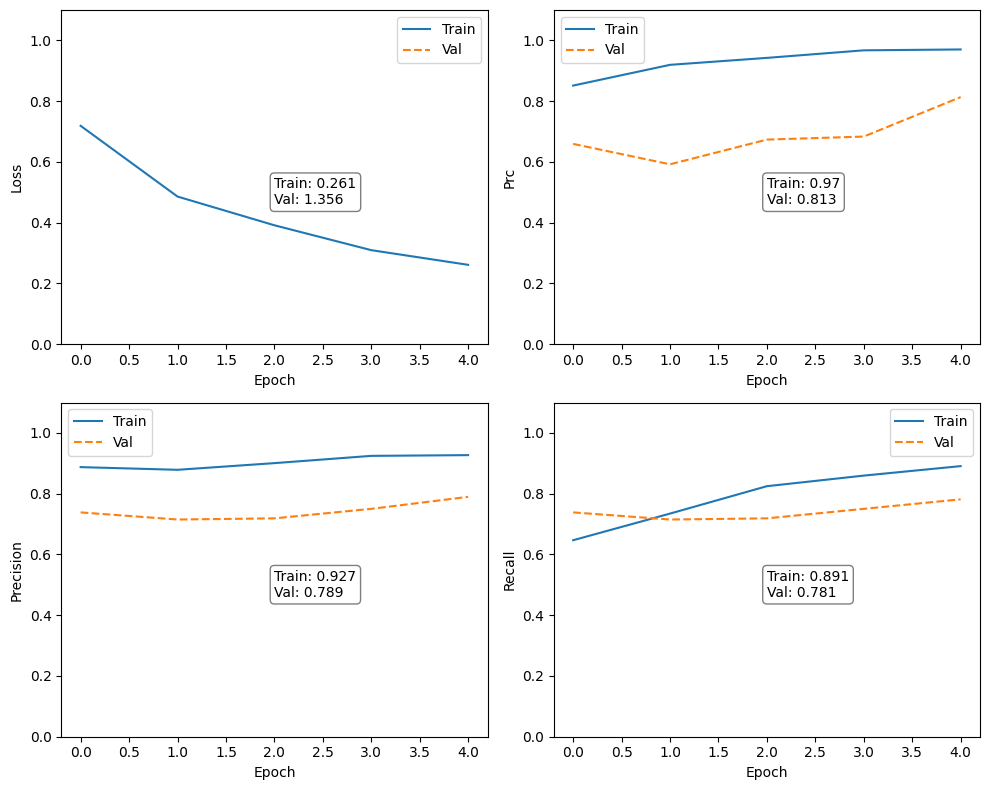

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = comb_model_1.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 337ms/step


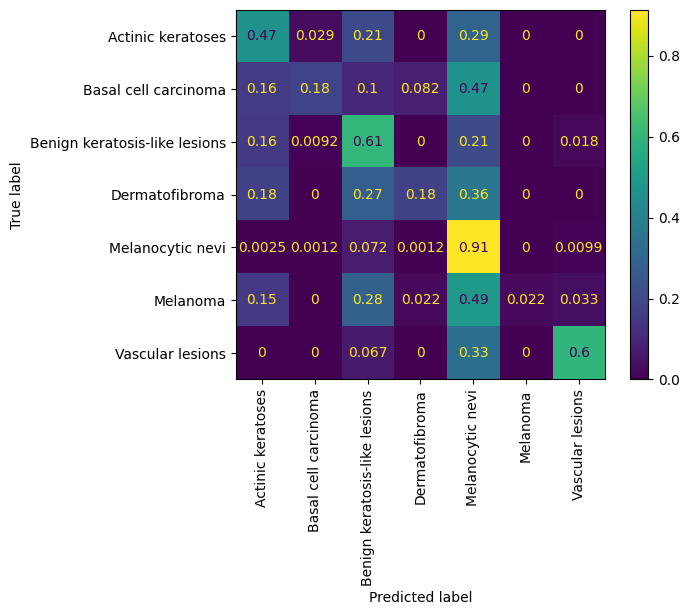

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.27      0.47      0.34        34
         Basal cell carcinoma       0.75      0.18      0.30        49
Benign keratosis-like lesions       0.40      0.61      0.48       109
               Dermatofibroma       0.22      0.18      0.20        11
             Melanocytic nevi       0.87      0.91      0.89       810
                     Melanoma       1.00      0.02      0.04        92
             Vascular lesions       0.41      0.60      0.49        15

                     accuracy                           0.75      1120
                    macro avg       0.56      0.43      0.39      1120
                 weighted avg       0.80      0.75      0.73      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.4395
F-beta Score (macro averaging): 0.4063
F-beta Score (weighted averaging): 0.7409


In [ ]:
model_train_preds = comb_model_1.predict(X_train, batch_size = 128)

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step


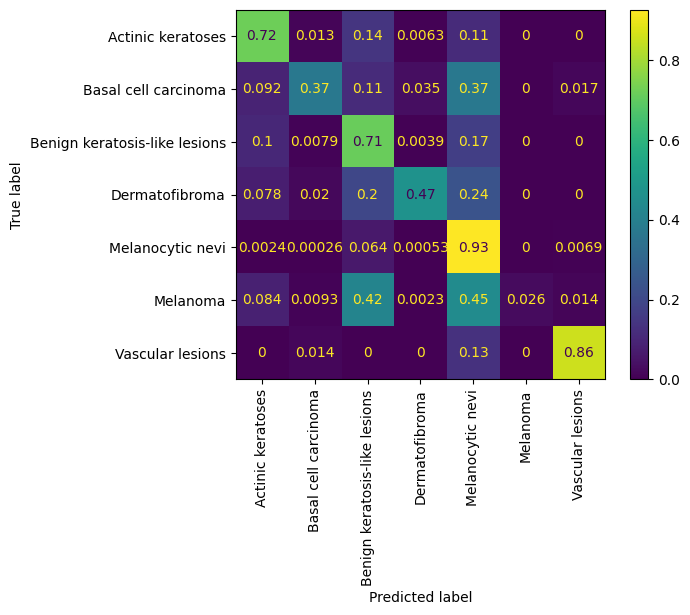

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.48      0.72      0.58       159
         Basal cell carcinoma       0.87      0.37      0.52       229
Benign keratosis-like lesions       0.43      0.71      0.54       509
               Dermatofibroma       0.63      0.47      0.54        51
             Melanocytic nevi       0.90      0.93      0.91      3782
                     Melanoma       1.00      0.03      0.05       430
             Vascular lesions       0.62      0.86      0.72        69

                     accuracy                           0.80      5229
                    macro avg       0.70      0.58      0.55      5229
                 weighted avg       0.84      0.80      0.77      5229



In [ ]:
calculate_and_print_scores(y_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.5445
F-beta Score (macro averaging): 0.5643
F-beta Score (weighted averaging): 0.7830


### with weights

In [ ]:
from sklearn.utils.class_weight import compute_class_weight

num_classes = y_train.shape[1]
class_weights = compute_class_weight('balanced', classes=np.unique(np.argmax(y_train, axis=1)), y=np.argmax(y_train, axis=1))
class_weight_dict = {i : class_weights[i] for i in range(num_classes)}

In [ ]:
xception_baseline_7cl_1 = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_baseline_7cl_1.layers:
    layer.trainable = True

In [ ]:
x = xception_baseline_7cl_1.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(7, activation='softmax')(x)

In [ ]:
comb_model_1 = Model(inputs=xception_baseline_7cl_1.input, outputs=predictions)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.Accuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
comb_model_1.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=metrics)
#comb_model_1.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = comb_model_1.fit(train_datagen.flow(X_train, y_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              class_weight=class_weight_dict,
                              callbacks=[early_stopping_monitor, reduce_lr])

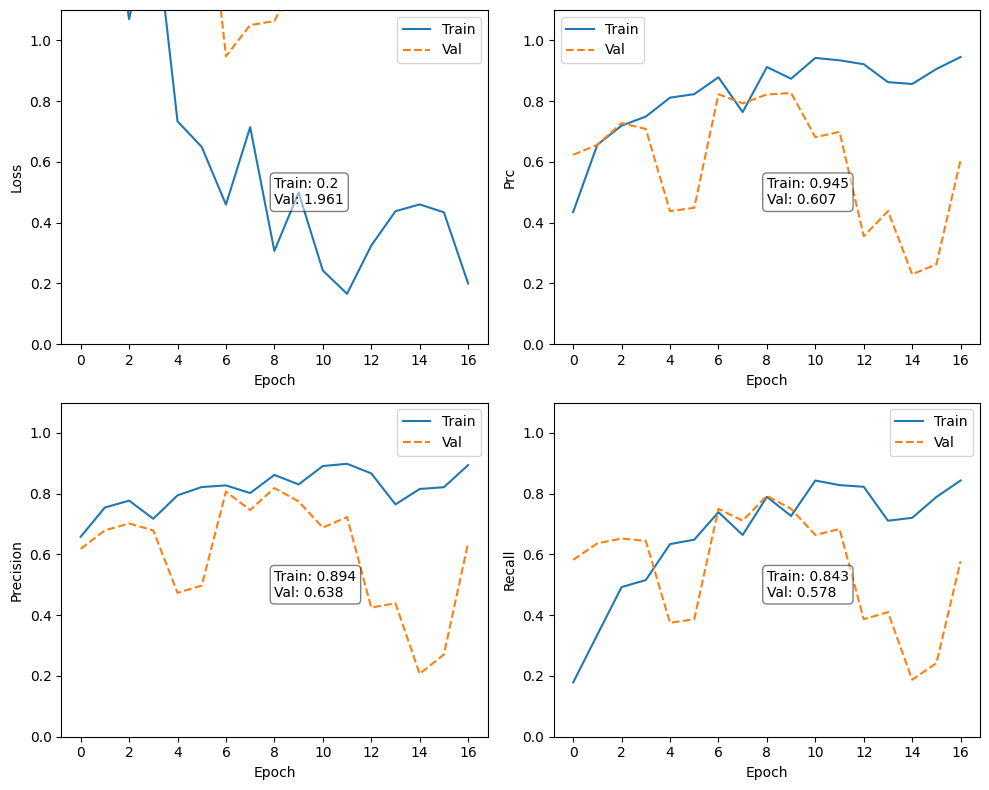

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = comb_model_1.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 336ms/step


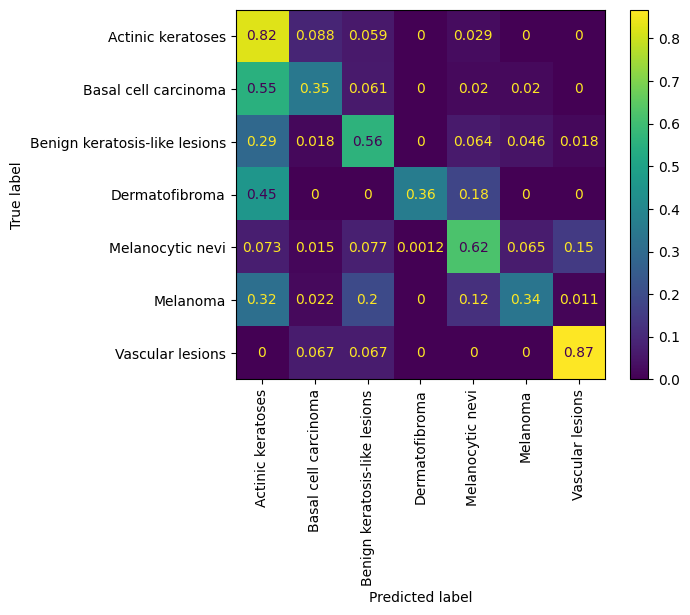

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.16      0.82      0.26        34
         Basal cell carcinoma       0.46      0.35      0.40        49
Benign keratosis-like lesions       0.41      0.56      0.48       109
               Dermatofibroma       0.80      0.36      0.50        11
             Melanocytic nevi       0.96      0.62      0.75       810
                     Melanoma       0.34      0.34      0.34        92
             Vascular lesions       0.10      0.87      0.17        15

                     accuracy                           0.59      1120
                    macro avg       0.46      0.56      0.41      1120
                 weighted avg       0.80      0.59      0.65      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.3850
F-beta Score (macro averaging): 0.4396
F-beta Score (weighted averaging): 0.5997


In [ ]:
model_train_preds = comb_model_1.predict(X_train, batch_size = 128)

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step


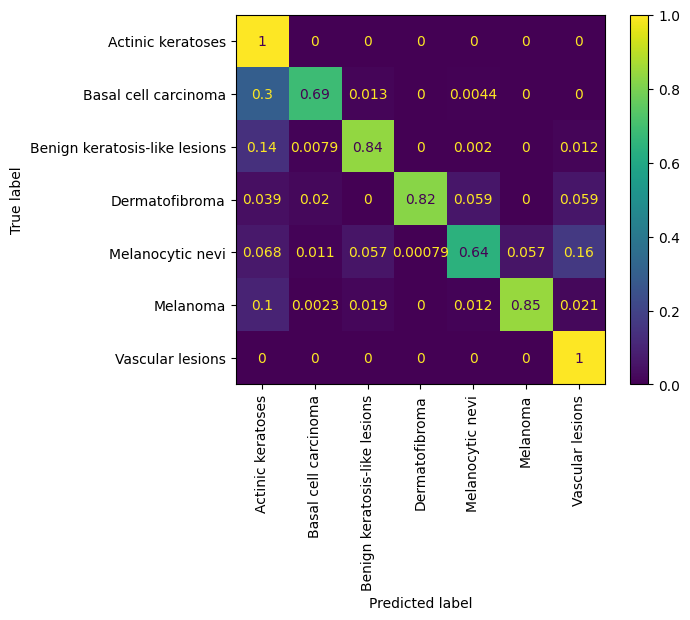

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

### with weights -tryout2

In [ ]:
from sklearn.utils.class_weight import compute_class_weight

num_classes = y_train.shape[1]
class_weights = compute_class_weight('balanced', classes=np.unique(np.argmax(y_train, axis=1)), y=np.argmax(y_train, axis=1))
class_weight_dict = {i : class_weights[i] for i in range(num_classes)}

In [ ]:
xception_baseline_7cl_1 = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_baseline_7cl_1.layers:
    layer.trainable = True

In [ ]:
x = xception_baseline_7cl_1.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(7, activation='softmax')(x)

In [ ]:
comb_model_1 = Model(inputs=xception_baseline_7cl_1.input, outputs=predictions)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.Accuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
comb_model_1.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=metrics)
#comb_model_1.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = comb_model_1.fit(train_datagen.flow(X_train, y_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              class_weight=class_weight_dict,
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


40/40 ━━━━━━━━━━━━━━━━━━━━ 69s 674ms/step - accuracy: 0.0000e+00 - fbeta_score: 0.1502 - loss: 1.8518 - prc: 0.3201 - precision: 0.7542 - recall: 0.0546 - val_accuracy: 0.0017 - val_fbeta_score: 0.1313 - val_loss: 4.6653 - val_prc: 0.5673 - val_precision: 0.6953 - val_recall: 0.6953 - learning_rate: 0.0010
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0000e+00 - fbeta_score: 0.3205 - loss: 1.5144 - prc: 0.7260 - precision: 0.9655 - recall: 0.4375 - val_accuracy: 0.0128 - val_fbeta_score: 0.1301 - val_loss: 5.0325 - val_prc: 0.5403 - val_precision: 0.6719 - val_recall: 0.6719 - learning_rate: 0.0010
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - accuracy: 5.0469e-05 - fbeta_score: 0.3240 - loss: 1.6085 - prc: 0.6261 - precision: 0.8842 - recall: 0.3609 - val_accuracy: 0.4905 - val_fbeta_score: 0.1940 - val_loss: 35.7494 - val_prc: 0.6281 - val_precision: 0.7383 - val_recall: 0.7383 - learning_rate: 0.0010
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0000e+00 - fbeta_score: 0.3808 - loss: 1.1292 - prc: 0.7108 - precision: 0.9219 - recall: 0.4609 - val_accuracy: 0.4782 - val_fbeta_score: 0.1980 - val_loss: 26.2598 - val_prc: 0.6027 - val_precision: 0.7266 - val_recall: 0.7266 - learning_rate: 0.0010
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - accuracy: 2.1982e-05 - fbeta_score: 0.5055 - loss: 1.0620 - prc: 0.7317 - precision: 0.8036 - recall: 0.5002 - val_accuracy: 0.0610 - val_fbeta_score: 0.1368 - val_loss: 5.1233 - val_prc: 0.6508 - val_precision: 0.5895 - val_recall: 0.5833 - learning_rate: 0.0010
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accur

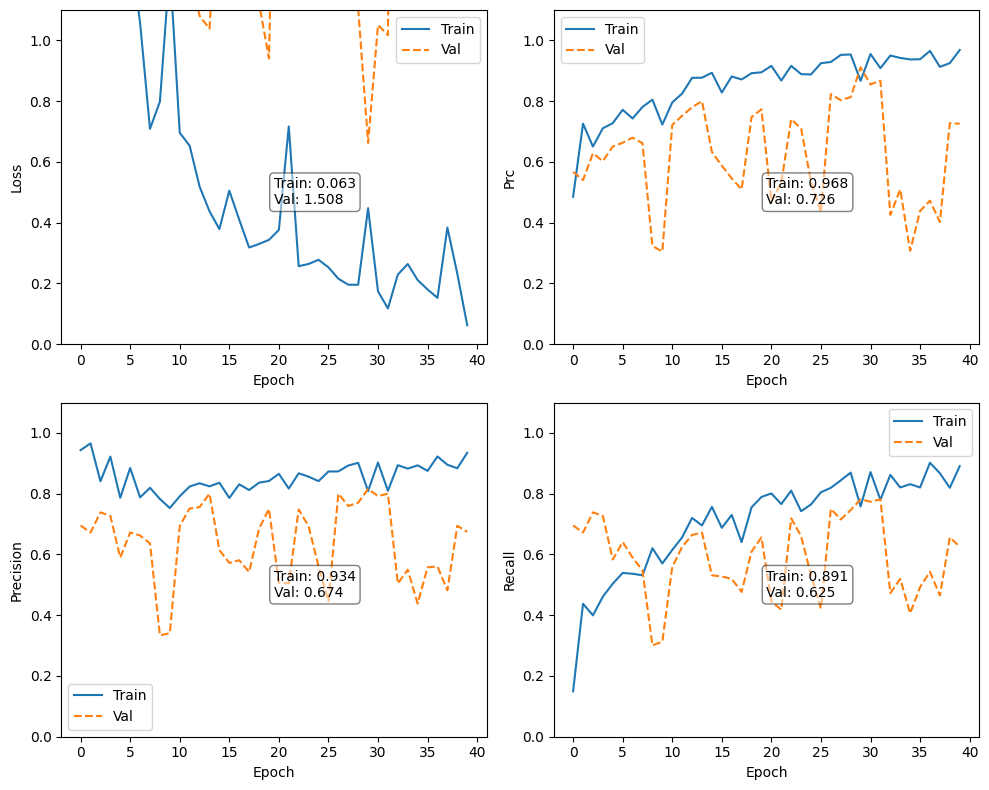

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = comb_model_1.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 333ms/step


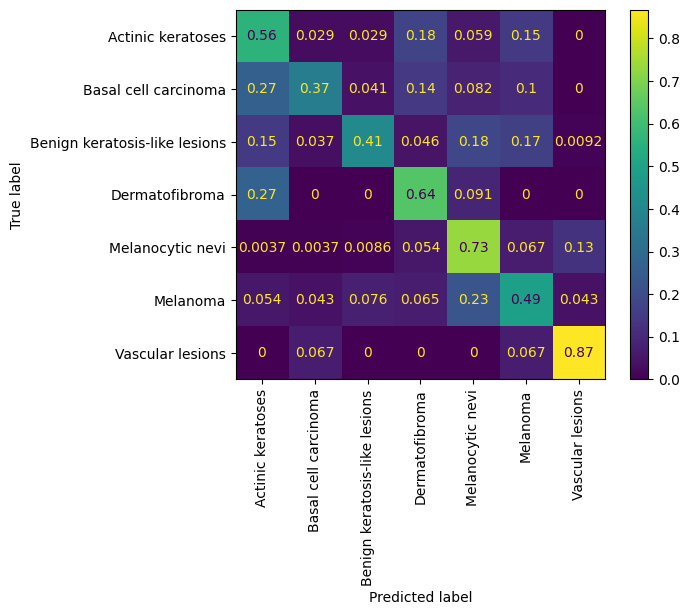

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.32      0.56      0.41        34
         Basal cell carcinoma       0.58      0.37      0.45        49
Benign keratosis-like lesions       0.73      0.41      0.53       109
               Dermatofibroma       0.09      0.64      0.16        11
             Melanocytic nevi       0.93      0.73      0.82       810
                     Melanoma       0.35      0.49      0.41        92
             Vascular lesions       0.11      0.87      0.19        15

                     accuracy                           0.66      1120
                    macro avg       0.44      0.58      0.42      1120
                 weighted avg       0.81      0.66      0.71      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.4224
F-beta Score (macro averaging): 0.4581
F-beta Score (weighted averaging): 0.6751


In [ ]:
model_train_preds = comb_model_1.predict(X_train, batch_size = 128)

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step


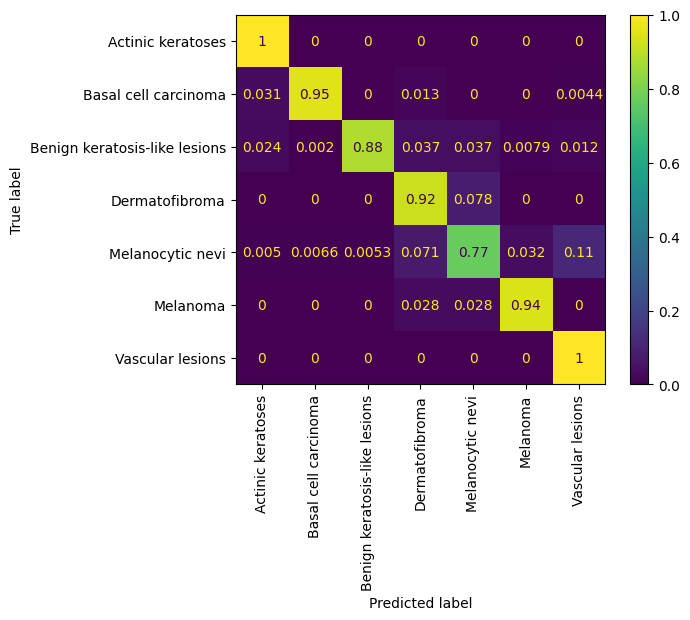

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

### Using metadata

#### as X: with weight and metadata - failed

In [ ]:
meta_data_train = np.load('/content/drive/MyDrive/DL_FinalProject/data/meta_data_train.npy')
meta_data_valid = np.load('/content/drive/MyDrive/DL_FinalProject/data/meta_data_valid.npy')
#meta_data_test = np.load('/content/drive/MyDrive/DL_FinalProject/data/meta_data_test.npy')

In [ ]:
from sklearn.utils.class_weight import compute_class_weight

num_classes = y_train.shape[1]
class_weights = compute_class_weight('balanced', classes=np.unique(np.argmax(y_train, axis=1)), y=np.argmax(y_train, axis=1))
class_weight_dict = {i : class_weights[i] for i in range(num_classes)}

In [ ]:
xception_baseline_7cl_1 = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

for layer in xception_baseline_7cl_1.layers:
    layer.trainable = True

In [ ]:
from keras.layers import Input, Concatenate

image_input = Input(shape=(75, 100, 3))
metadata_input = Input(shape=(19,))

In [ ]:
x = xception_baseline_7cl_1.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)

#combined = Concatenate()([x, metadata_input])
combined = Concatenate(axis=1)([x, metadata_input])
predictions = Dense(7, activation='softmax')(combined)

comb_model_1 = Model(inputs=[xception_baseline_7cl_1.input, metadata_input],
                     outputs=predictions)

In [ ]:
comb_model_1.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=metrics)
#comb_model_1.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
history = comb_model_1.fit([X_train, meta_data_train], y_train,
                            epochs = 50,
                            validation_data = ([X_valid, meta_data_valid], y_valid),
                            verbose = 1,
                            class_weight=class_weight_dict,
                            callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 4.7988e-05 - fbeta_score: 0.2237 - loss: 5.3757 - prc: 0.4956 - precision: 0.6202 - recall: 0.5234

ValueError: Input 1 of layer "functional_29" is incompatible with the layer: expected shape=(None, 19), found shape=(32, 18)

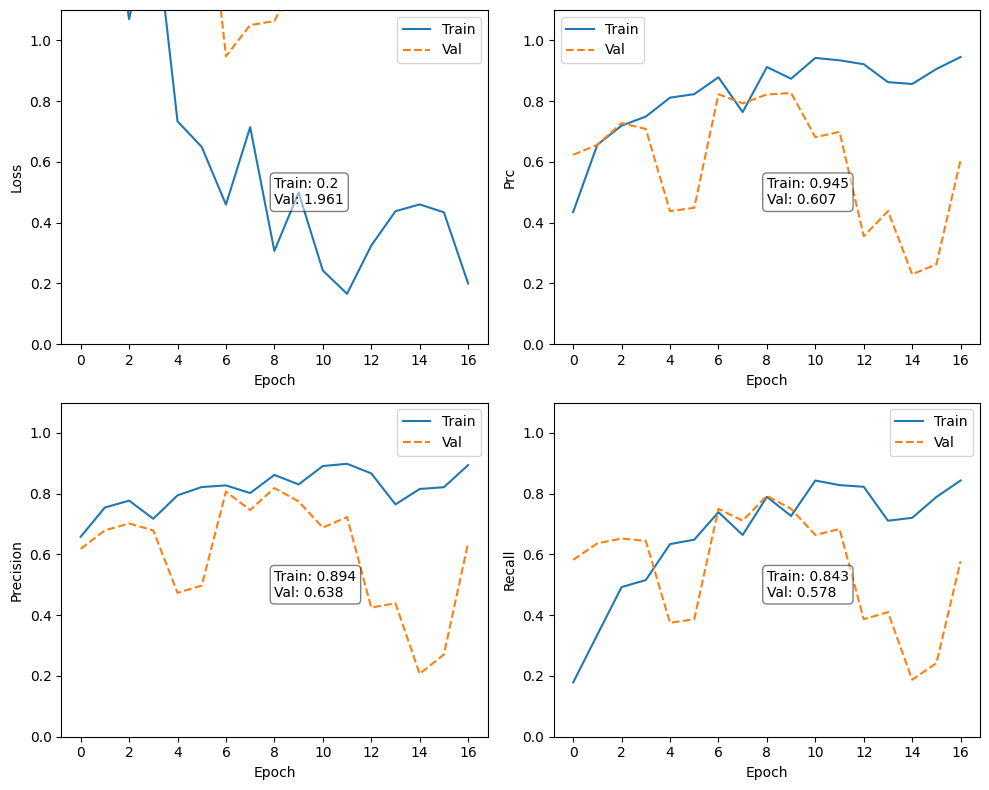

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = comb_model_1.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 336ms/step


In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

In [ ]:
model_train_preds = comb_model_1.predict(X_train, batch_size = 128)

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

#### as Y (trying to predict age) - warm start

In [ ]:
y_train_age = np.load('/content/drive/My Drive/DL_FinalProject/data/y_train_age.npy')
y_valid_age = np.load('/content/drive/My Drive/DL_FinalProject/data/y_valid_age.npy')

In [ ]:
y_train_age.shape

(5229, 3)

In [ ]:
y_train_age_am = np.argmax(y_train_age, axis=1)
y_valid_age_am = np.argmax(y_valid_age, axis=1)
y_train_age_am.shape

(5229,)

In [ ]:
y_train_age_am

array([1, 0, 0, ..., 2, 2, 0])

In [ ]:
xception_baseline = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

for layer in xception_baseline.layers:
    layer.trainable = True

In [ ]:
x = xception_baseline.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.3)(x)

output_y = Dense(7, activation='softmax', name='output_y')(x)
output_age = Dense(3, activation='softmax', name='output_age')(x)

model = Model(inputs=xception_baseline.input,
              outputs=[output_y, output_age])

the code below works only with accuracy..

In [ ]:
model.compile(optimizer='adam',
              loss={'output_y': 'categorical_crossentropy', 'output_age': 'sparse_categorical_crossentropy'},
              metrics={'output_y': 'accuracy', 'output_age': 'accuracy'})

In [ ]:
X_train.shape, X_valid.shape

((5229, 75, 100, 3), (1120, 75, 100, 3))

In [ ]:
y_train.shape, y_train_age.shape

((5229, 7), (5229, 3))

In [ ]:
y_valid.shape, y_valid_age.shape

((1120, 7), (1120, 3))

In [ ]:
history = model.fit(X_train, {'output_y': y_train,'output_age': y_train_age_am},
                    epochs=10,
                    validation_data=(X_valid, {'output_y': y_valid,
                                               'output_age': y_valid_age_am}),
                    verbose=1)

Epoch 1/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 74s 180ms/step - loss: 1.8871 - output_age_accuracy: 0.5594 - output_y_accuracy: 0.7256 - val_loss: 1.9552 - val_output_age_accuracy: 0.4437 - val_output_y_accuracy: 0.7500
Epoch 2/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 1.5122 - output_age_accuracy: 0.5909 - output_y_accuracy: 0.7854 - val_loss: 1.5178 - val_output_age_accuracy: 0.6125 - val_output_y_accuracy: 0.7830
Epoch 3/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 1.3349 - output_age_accuracy: 0.6344 - output_y_accuracy: 0.8302 - val_loss: 1.9792 - val_output_age_accuracy: 0.5670 - val_output_y_accuracy: 0.7179
Epoch 4/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 1.2762 - output_age_accuracy: 0.6303 - output_y_accuracy: 0.8545 - val_loss: 1.6372 - val_output_age_accuracy: 0.5786 - val_output_y_accuracy: 0.7920
Epoch 5/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/step - loss: 1.1214 - output_age_accuracy: 0.6564 - output_y_accuracy: 0.8757 - val_loss: 1.6809 - val_out

In [ ]:
def plot_metrics_with_age(history):
    metrics = ['output_y_accuracy', 'output_age_accuracy', 'loss']
    titles = ['Output Y Accuracy', 'Output Age Accuracy', 'Loss']
    num_metrics = len(metrics)

    # Create subplots
    fig, axs = plt.subplots((num_metrics + 1) // 2, 2, figsize=(12, 8))
    axs = axs.flatten()
    for n, metric in enumerate(metrics):
        ax = axs[n]
        ax.plot(history.epoch, history.history[metric], label='Train')
        val_metric = f'val_{metric}'
        if val_metric in history.history:
            ax.plot(history.epoch, history.history[val_metric], linestyle="--", label='Val')
        ax.set_xlabel('Epoch')
        ax.set_ylabel(titles[n])
        ax.set_ylim([0, 1 if 'accuracy' in metric else None])
        ax.legend()

        train_value = round(history.history[metric][-1], 3)
        val_value = round(history.history[val_metric][-1], 3) if val_metric in history.history else 'N/A'
        ax.text(0.5, 0.1, f"Train: {train_value}\nVal: {val_value}", transform=ax.transAxes, fontsize=10,
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

    plt.tight_layout()
    plt.show()

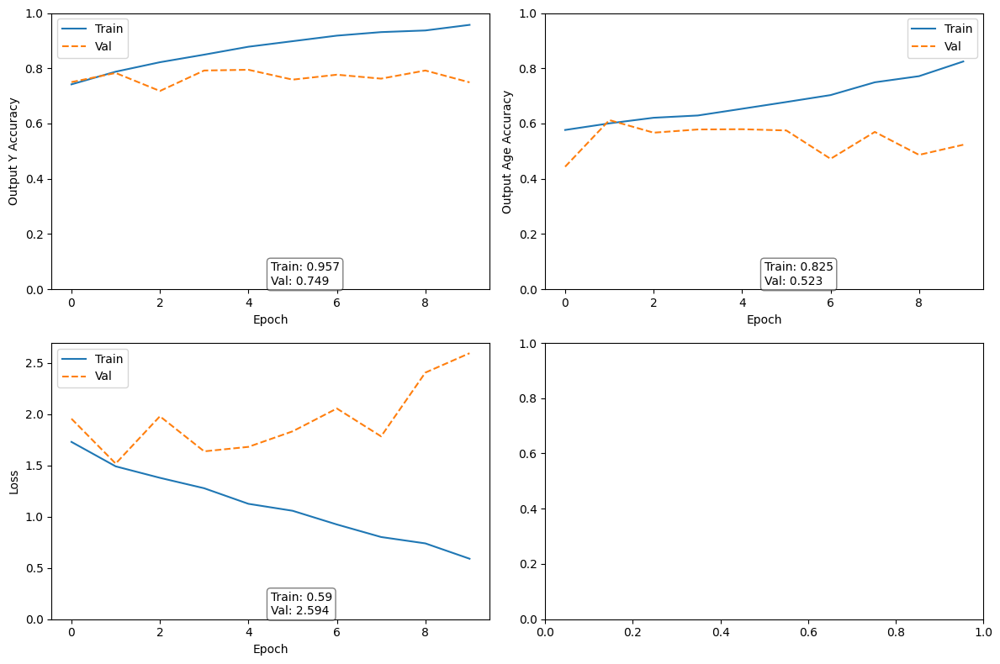

In [ ]:
plot_metrics_with_age(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step


In [ ]:
predictions_y = np.argmax(model_valid_preds[0], axis=1)
predictions_age = np.argmax(model_valid_preds[1], axis=1)

In [ ]:
true_labels_y = np.argmax(y_valid, axis=1)
true_labels_age = y_valid_age_am

<Figure size 1000x500 with 0 Axes>

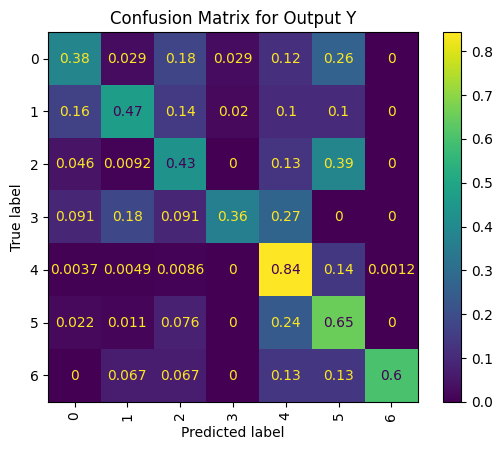

<Figure size 1000x500 with 0 Axes>

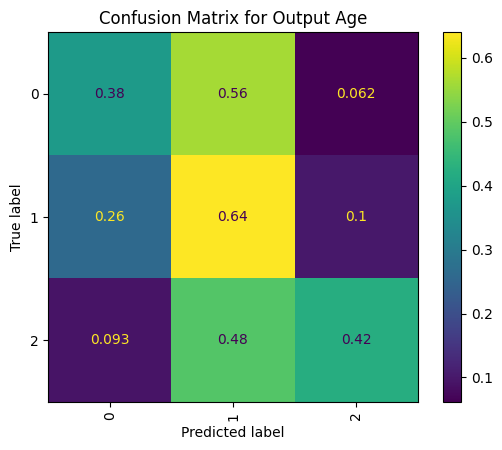

In [ ]:
# Plot for output_y
plt.figure(figsize=(10, 5))
ConfusionMatrixDisplay.from_predictions(true_labels_y, predictions_y,
                                        xticks_rotation='vertical',
                                        normalize='true')
plt.title('Confusion Matrix for Output Y')
plt.show()

# Plot for output_age
plt.figure(figsize=(10, 5))
ConfusionMatrixDisplay.from_predictions(true_labels_age, predictions_age,
                                        xticks_rotation='vertical',
                                        normalize='true')
plt.title('Confusion Matrix for Output Age')
plt.show()


In [ ]:
print(classification_report(true_labels_y, predictions_y,
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.41      0.38      0.39        34
         Basal cell carcinoma       0.70      0.47      0.56        49
Benign keratosis-like lesions       0.62      0.43      0.51       109
               Dermatofibroma       0.67      0.36      0.47        11
             Melanocytic nevi       0.93      0.84      0.89       810
                     Melanoma       0.26      0.65      0.37        92
             Vascular lesions       0.90      0.60      0.72        15

                     accuracy                           0.75      1120
                    macro avg       0.64      0.53      0.56      1120
                 weighted avg       0.82      0.75      0.77      1120



In [ ]:
calculate_and_print_scores(true_labels_y, predictions_y,)

Matthews Correlation Coefficient (MCC): 0.5109
F-beta Score (macro averaging): 0.5360
F-beta Score (weighted averaging): 0.7538


#### as Y (trying to predict age) - freeze

In [ ]:
y_train_age = np.load('/content/drive/My Drive/DL_FinalProject/data/y_train_age.npy')
y_valid_age = np.load('/content/drive/My Drive/DL_FinalProject/data/y_valid_age.npy')

In [ ]:
y_train_age.shape

(5229, 3)

In [ ]:
y_train_age_am = np.argmax(y_train_age, axis=1)
y_valid_age_am = np.argmax(y_valid_age, axis=1)
y_train_age_am.shape

(5229,)

In [ ]:
y_train_age_am

array([1, 0, 0, ..., 2, 2, 0])

In [ ]:
xception_baseline = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

for layer in xception_baseline.layers:
    layer.trainable = False

In [ ]:
x = xception_baseline.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.3)(x)

output_y = Dense(7, activation='softmax', name='output_y')(x)
output_age = Dense(3, activation='softmax', name='output_age')(x)

model = Model(inputs=xception_baseline.input,
              outputs=[output_y, output_age])

the code below works only with accuracy..

In [ ]:
model.compile(optimizer='adam',
              loss={'output_y': 'categorical_crossentropy', 'output_age': 'sparse_categorical_crossentropy'},
              metrics={'output_y': 'accuracy', 'output_age': 'accuracy'})

In [ ]:
X_train.shape, X_valid.shape

((5229, 75, 100, 3), (1120, 75, 100, 3))

In [ ]:
y_train.shape, y_train_age.shape

((5229, 7), (5229, 3))

In [ ]:
y_valid.shape, y_valid_age.shape

((1120, 7), (1120, 3))

In [ ]:
history = model.fit(X_train, {'output_y': y_train,'output_age': y_train_age_am},
                    epochs=50,
                    validation_data=(X_valid, {'output_y': y_valid,
                                               'output_age': y_valid_age_am}),
                    verbose=1)

Epoch 1/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - loss: 2.1654 - output_age_accuracy: 0.4831 - output_y_accuracy: 0.7223 - val_loss: 1.7672 - val_output_age_accuracy: 0.5705 - val_output_y_accuracy: 0.7402
Epoch 2/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.7376 - output_age_accuracy: 0.5558 - output_y_accuracy: 0.7346 - val_loss: 1.7191 - val_output_age_accuracy: 0.5670 - val_output_y_accuracy: 0.7473
Epoch 3/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.6816 - output_age_accuracy: 0.5799 - output_y_accuracy: 0.7412 - val_loss: 1.7038 - val_output_age_accuracy: 0.5821 - val_output_y_accuracy: 0.7536
Epoch 4/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1.5626 - output_age_accuracy: 0.6144 - output_y_accuracy: 0.7656 - val_loss: 1.7100 - val_output_age_accuracy: 0.5732 - val_output_y_accuracy: 0.7518
Epoch 5/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 1.5382 - output_age_accuracy: 0.6231 - output_y_accuracy: 0.7582 - val_loss: 1.6853 - val_outp

In [ ]:
def plot_metrics_with_age(history):
    metrics = ['output_y_accuracy', 'output_age_accuracy', 'loss']
    titles = ['Output Y Accuracy', 'Output Age Accuracy', 'Loss']
    num_metrics = len(metrics)

    # Create subplots
    fig, axs = plt.subplots((num_metrics + 1) // 2, 2, figsize=(12, 8))
    axs = axs.flatten()
    for n, metric in enumerate(metrics):
        ax = axs[n]
        ax.plot(history.epoch, history.history[metric], label='Train')
        val_metric = f'val_{metric}'
        if val_metric in history.history:
            ax.plot(history.epoch, history.history[val_metric], linestyle="--", label='Val')
        ax.set_xlabel('Epoch')
        ax.set_ylabel(titles[n])
        ax.set_ylim([0, 1 if 'accuracy' in metric else None])
        ax.legend()

        train_value = round(history.history[metric][-1], 3)
        val_value = round(history.history[val_metric][-1], 3) if val_metric in history.history else 'N/A'
        ax.text(0.5, 0.1, f"Train: {train_value}\nVal: {val_value}", transform=ax.transAxes, fontsize=10,
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

    plt.tight_layout()
    plt.show()

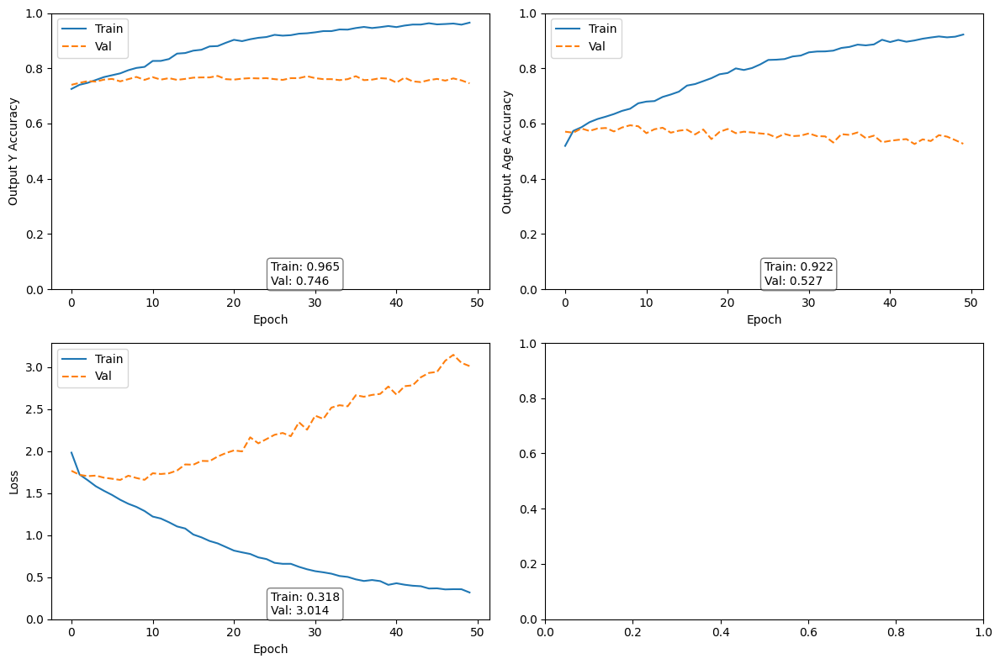

In [ ]:
plot_metrics_with_age(history)

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 355ms/step


In [ ]:
predictions_y = np.argmax(model_valid_preds[0], axis=1)
predictions_age = np.argmax(model_valid_preds[1], axis=1)

In [ ]:
true_labels_y = np.argmax(y_valid, axis=1)
true_labels_age = y_valid_age_am

<Figure size 1000x500 with 0 Axes>

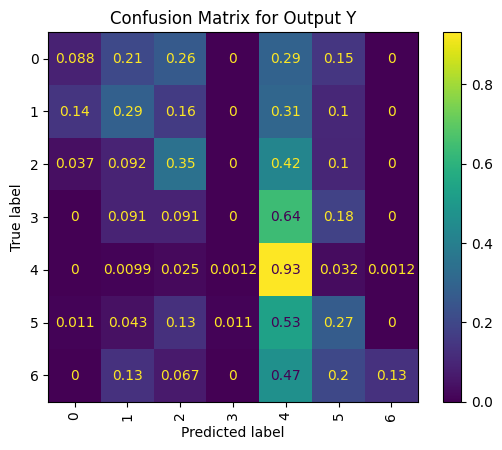

<Figure size 1000x500 with 0 Axes>

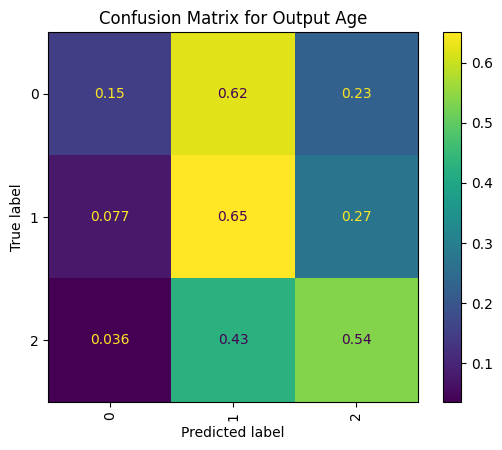

In [ ]:
# Plot for output_y
plt.figure(figsize=(10, 5))
ConfusionMatrixDisplay.from_predictions(true_labels_y, predictions_y,
                                        xticks_rotation='vertical',
                                        normalize='true')
plt.title('Confusion Matrix for Output Y')
plt.show()

# Plot for output_age
plt.figure(figsize=(10, 5))
ConfusionMatrixDisplay.from_predictions(true_labels_age, predictions_age,
                                        xticks_rotation='vertical',
                                        normalize='true')
plt.title('Confusion Matrix for Output Age')
plt.show()


In [ ]:
print(classification_report(true_labels_y, predictions_y,
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.20      0.09      0.12        34
         Basal cell carcinoma       0.30      0.29      0.29        49
Benign keratosis-like lesions       0.43      0.35      0.38       109
               Dermatofibroma       0.00      0.00      0.00        11
             Melanocytic nevi       0.85      0.93      0.89       810
                     Melanoma       0.32      0.27      0.30        92
             Vascular lesions       0.67      0.13      0.22        15

                     accuracy                           0.75      1120
                    macro avg       0.40      0.29      0.32      1120
                 weighted avg       0.71      0.75      0.72      1120



In [ ]:
calculate_and_print_scores(true_labels_y, predictions_y,)

Matthews Correlation Coefficient (MCC): 0.3886
F-beta Score (macro averaging): 0.3005
F-beta Score (weighted averaging): 0.7366


# Warm started tryouts with balaced data

## Paper experiment

https://iopscience.iop.org/article/10.1088/1742-6596/2128/1/012013

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = GlobalMaxPooling2D()(last_output)

In [ ]:
layer_sizes = [512, 128, 52, 16]
for size in layer_sizes:
    x = Dense(size)(x)
    x = Dropout(0.2)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                    epochs = epochs,
                    validation_data = val_datagen.flow(X_valid, y_valid),
                    verbose = 1,
                    steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                    validation_steps=(X_valid.shape[0] // batch_size),
                    callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 119s 208ms/step - cat_accuracy: 0.3736 - fbeta_score: 0.3568 - loss: 1.6516 - prc: 0.4153 - precision: 0.7309 - recall: 0.1466 - val_cat_accuracy: 0.7422 - val_fbeta_score: 0.5219 - val_loss: 0.9051 - val_prc: 0.8267 - val_precision: 0.9510 - val_recall: 0.5312 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 451us/step - cat_accuracy: 0.7031 - fbeta_score: 0.6854 - loss: 0.9874 - prc: 0.7912 - precision: 0.9322 - recall: 0.4297 - val_cat_accuracy: 0.7539 - val_fbeta_score: 0.4716 - val_loss: 0.8755 - val_prc: 0.8355 - val_precision: 0.9236 - val_recall: 0.5195 - learning_rate: 1.0000e-04
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - cat_accuracy: 0.7635 - fbeta_score: 0.7614 - loss: 0.8859 - prc: 0.8437 - precision: 0.9490 - recall: 0.4506 - val_cat_accuracy: 0.8477 - val_fbeta_score: 0.5684 - val_loss: 0.6140 - val_prc: 0.9166 - val_precision: 0.9343 - val_recall: 0.7227 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - cat_accuracy: 0.8125 - fbeta_score: 0.8156 - loss: 0.7445 - prc: 0.8715 - precision: 0.9268 - recall: 0.5938 - val_cat_accuracy: 0.8047 - val_fbeta_score: 0.4604 - val_loss: 0.6827 - val_prc: 0.8764 - val_precision: 0.9005 - val_recall: 0.7422 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - cat_accuracy: 0.9075 - fbeta_score: 0.9070 - loss: 0.5597 - prc: 0.9538 - precision: 0.9703 - recall: 0.7026 - val_cat_accuracy: 0.7604 - val_fbeta_score: 0.4498 - val_loss: 0.7740 - val_prc: 0.8183 - val_precision: 0.8171 - val_recall: 0.6979 - learning_rate: 1.0000e-04
Epoch 6/50
328/328 ━━━━━━

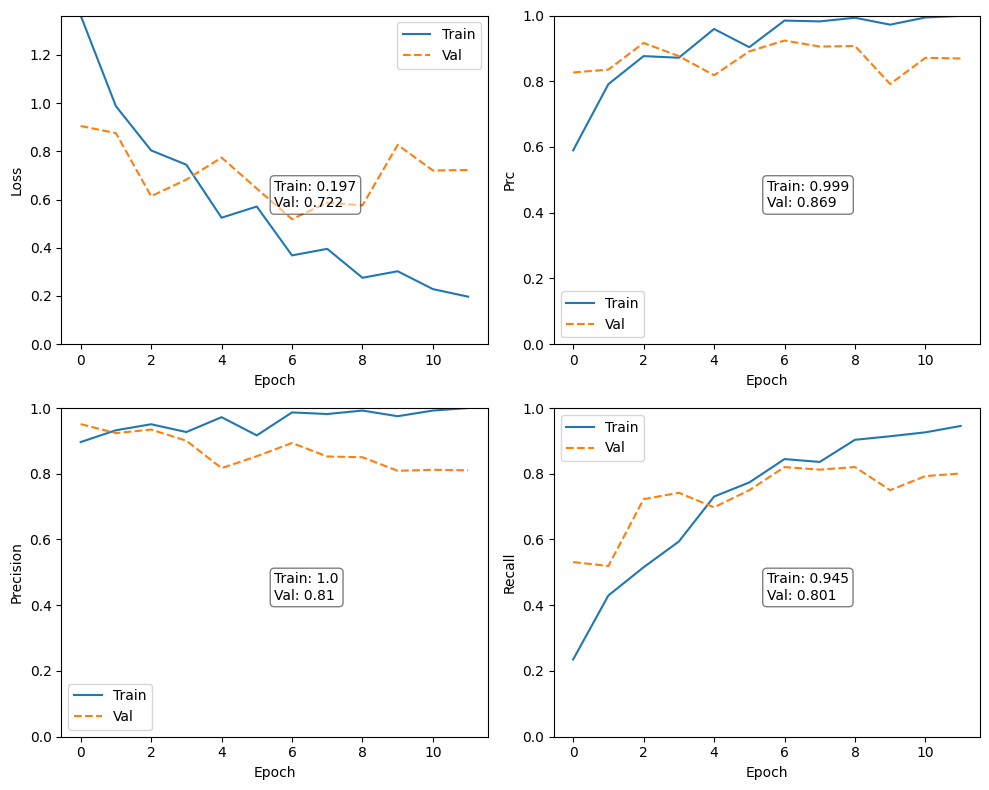

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 505ms/step


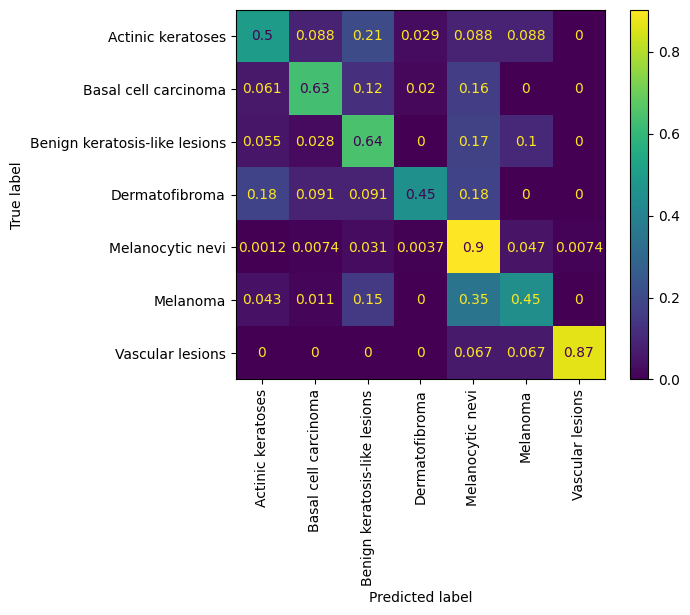

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.52      0.50      0.51        34
         Basal cell carcinoma       0.69      0.63      0.66        49
Benign keratosis-like lesions       0.57      0.64      0.60       109
               Dermatofibroma       0.50      0.45      0.48        11
             Melanocytic nevi       0.92      0.90      0.91       810
                     Melanoma       0.44      0.45      0.44        92
             Vascular lesions       0.68      0.87      0.76        15

                     accuracy                           0.81      1120
                    macro avg       0.62      0.63      0.62      1120
                 weighted avg       0.82      0.81      0.81      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.5936
F-beta Score (macro averaging): 0.6296
F-beta Score (weighted averaging): 0.8113


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


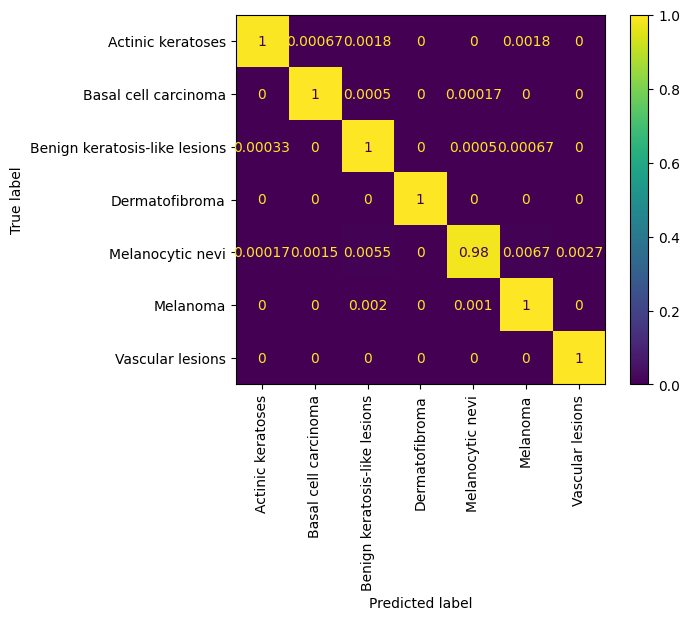

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       1.00      1.00      1.00      6000
         Basal cell carcinoma       1.00      1.00      1.00      6000
Benign keratosis-like lesions       0.99      1.00      0.99      6000
               Dermatofibroma       1.00      1.00      1.00      6000
             Melanocytic nevi       1.00      0.98      0.99      6000
                     Melanoma       0.99      1.00      0.99      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           1.00     42000
                    macro avg       1.00      1.00      1.00     42000
                 weighted avg       1.00      1.00      1.00     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9957
F-beta Score (macro averaging): 0.9963
F-beta Score (weighted averaging): 0.9963


## Tryout_1

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    print(layer.name)
    layer.trainable = False

#print(len(xception_model.layers))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)


<Activation name=block14_sepconv2_act, built=True>


In [ ]:
last_output = last_layer.output

# Print the shape of the output tensor
print('Last layer output shape:', last_output.shape)

Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = GlobalMaxPooling2D()(last_output)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.Accuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, x)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)

In [ ]:
batch_size = 64
epochs = 30
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor])

Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


656/656 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - accuracy: 0.0000e+00 - fbeta_score: 0.4111 - loss: 1.6026 - prc: 0.4125 - precision: 0.5923 - recall: 0.1649 - val_accuracy: 0.0000e+00 - val_fbeta_score: 0.4100 - val_loss: 1.0767 - val_prc: 0.7179 - val_precision: 0.8713 - val_recall: 0.4357
Epoch 2/30
656/656 ━━━━━━━━━━━━━━━━━━━━ 0s 314us/step - accuracy: 0.0000e+00 - fbeta_score: 0.5508 - loss: 1.2483 - prc: 0.6140 - precision: 0.7037 - recall: 0.2969 - val_accuracy: 0.0000e+00 - val_fbeta_score: 0.3557 - val_loss: 1.0667 - val_prc: 0.7211 - val_precision: 0.8556 - val_recall: 0.4467
Epoch 3/30


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


656/656 ━━━━━━━━━━━━━━━━━━━━ 11s 17ms/step - accuracy: 0.0000e+00 - fbeta_score: 0.5813 - loss: 1.1498 - prc: 0.6473 - precision: 0.7737 - recall: 0.3606 - val_accuracy: 0.0000e+00 - val_fbeta_score: 0.3650 - val_loss: 1.0386 - val_prc: 0.7290 - val_precision: 0.8750 - val_recall: 0.4375
Epoch 4/30
656/656 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - accuracy: 0.0000e+00 - fbeta_score: 0.5855 - loss: 1.0098 - prc: 0.7450 - precision: 0.8529 - recall: 0.4531 - val_accuracy: 0.0000e+00 - val_fbeta_score: 0.4340 - val_loss: 0.9560 - val_prc: 0.7632 - val_precision: 0.8859 - val_recall: 0.4853
Epoch 5/30
656/656 ━━━━━━━━━━━━━━━━━━━━ 11s 17ms/step - accuracy: 0.0000e+00 - fbeta_score: 0.6291 - loss: 1.0201 - prc: 0.7116 - precision: 0.8096 - recall: 0.4308 - val_accuracy: 0.0000e+00 - val_fbeta_score: 0.3853 - val_loss: 0.9192 - val_prc: 0.7760 - val_precision: 0.8537 - val_recall: 0.5147
Epoch 6/30
656/656 ━━━━━━━━━━━━━━━━━━━━ 0s 90us/step - accuracy: 0.0000e+00 - fbeta_score: 0.7414 - loss: 0.684

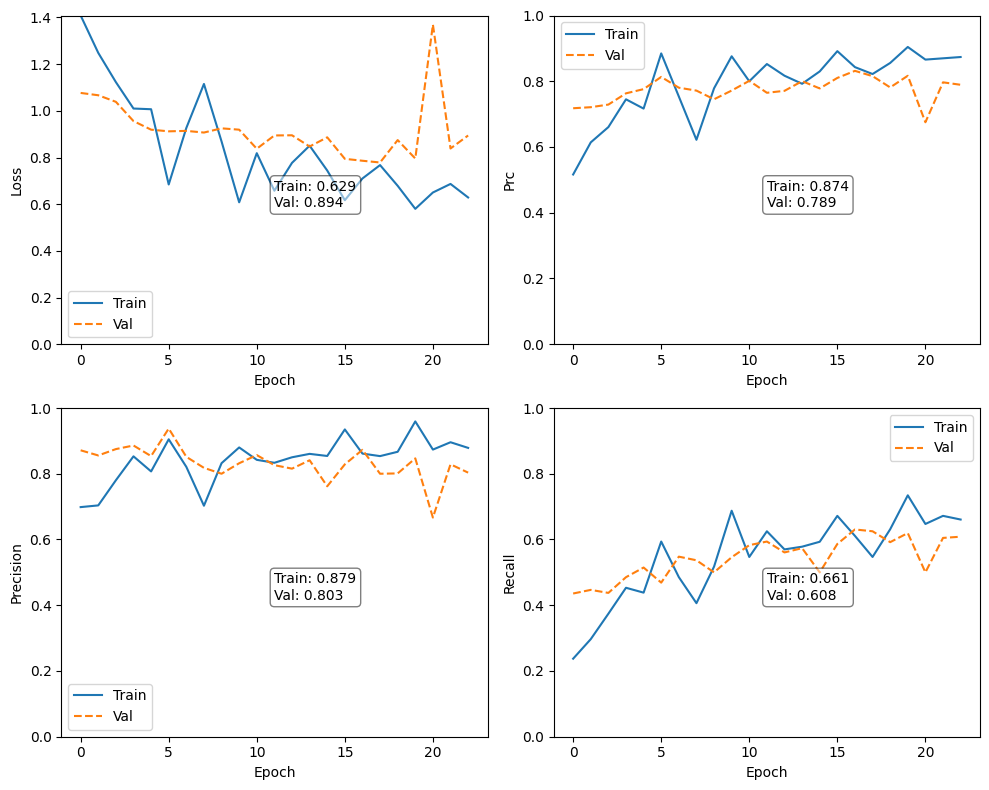

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 381ms/step


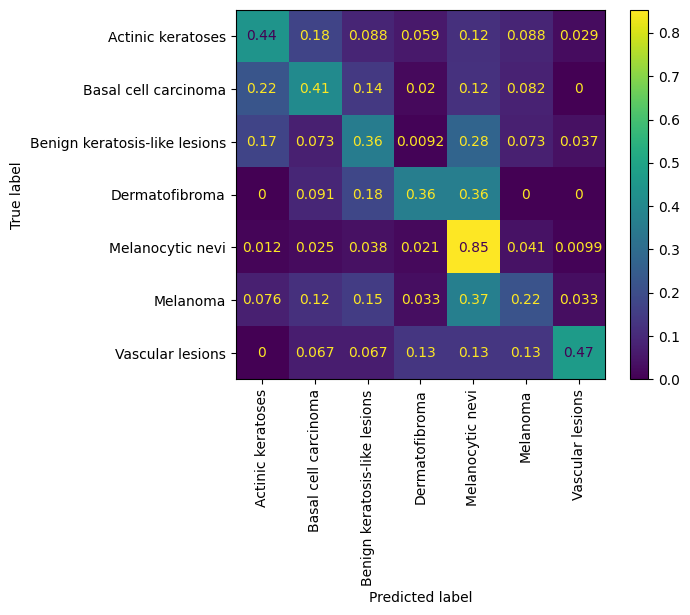

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.24      0.44      0.31        34
         Basal cell carcinoma       0.30      0.41      0.34        49
Benign keratosis-like lesions       0.40      0.36      0.38       109
               Dermatofibroma       0.13      0.36      0.20        11
             Melanocytic nevi       0.90      0.85      0.87       810
                     Melanoma       0.29      0.22      0.25        92
             Vascular lesions       0.30      0.47      0.37        15

                     accuracy                           0.71      1120
                    macro avg       0.37      0.44      0.39      1120
                 weighted avg       0.74      0.71      0.72      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.4037
F-beta Score (macro averaging): 0.4152
F-beta Score (weighted averaging): 0.7138


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


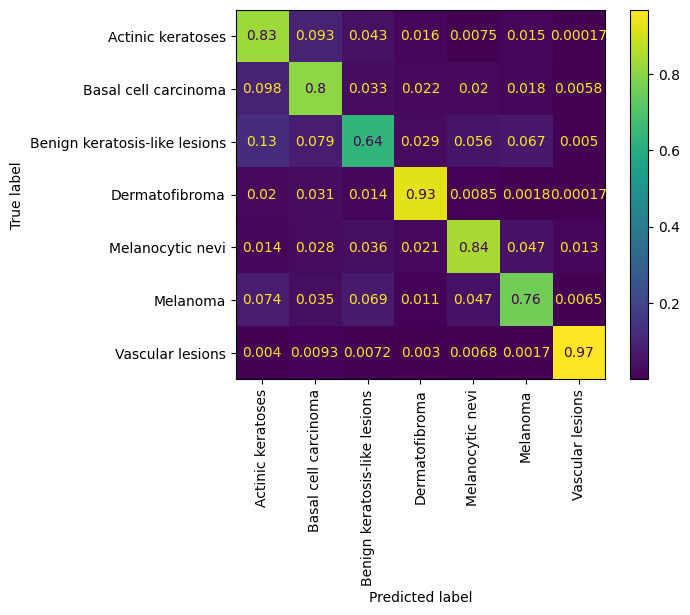

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.71      0.83      0.76      6000
         Basal cell carcinoma       0.74      0.80      0.77      6000
Benign keratosis-like lesions       0.76      0.64      0.69      6000
               Dermatofibroma       0.90      0.93      0.91      6000
             Melanocytic nevi       0.85      0.84      0.85      6000
                     Melanoma       0.83      0.76      0.79      6000
             Vascular lesions       0.97      0.97      0.97      6000

                     accuracy                           0.82     42000
                    macro avg       0.82      0.82      0.82     42000
                 weighted avg       0.82      0.82      0.82     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.7938
F-beta Score (macro averaging): 0.8220
F-beta Score (weighted averaging): 0.8220


## Tryout_2

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = GlobalMaxPooling2D()(last_output)

In [ ]:
layer_sizes = [512, 128, 52, 16]
for size in layer_sizes:
    x = Dense(size)(x)
    x = Dropout(0.3)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 123s 213ms/step - cat_accuracy: 0.2430 - fbeta_score: 0.2261 - loss: 1.8809 - prc: 0.2473 - precision: 0.5110 - recall: 0.0376 - val_cat_accuracy: 0.7734 - val_fbeta_score: 0.4498 - val_loss: 1.3744 - val_prc: 0.8029 - val_precision: 1.0000 - val_recall: 0.0039
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 453us/step - cat_accuracy: 0.4375 - fbeta_score: 0.4440 - loss: 1.4477 - prc: 0.4924 - precision: 0.7600 - recall: 0.1484 - val_cat_accuracy: 0.7852 - val_fbeta_score: 0.4689 - val_loss: 1.3441 - val_prc: 0.8147 - val_precision: 1.0000 - val_recall: 0.0078
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - cat_accuracy: 0.6200 - fbeta_score: 0.6181 - loss: 1.2328 - prc: 0.6948 - precision: 0.9544 - recall: 0.2253 - val_cat_accuracy: 0.8281 - val_fbeta_score: 0.5591 - val_loss: 0.8700 - val_prc: 0.9066 - val_precision: 0.9636 - val_recall: 0.6211
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - cat_accuracy: 0.7656 - fbeta_score: 0.7498 - loss: 1.0128 - prc: 0.8298 - precision: 0.9388 - recall: 0.3594 - val_cat_accuracy: 0.7930 - val_fbeta_score: 0.5838 - val_loss: 0.9214 - val_prc: 0.8780 - val_precision: 0.9329 - val_recall: 0.5977
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - cat_accuracy: 0.7901 - fbeta_score: 0.7867 - loss: 0.9295 - prc: 0.8604 - precision: 0.9715 - recall: 0.4032 - val_cat_accuracy: 0.8333 - val_fbeta_score: 0.4931 - val_loss: 0.7360 - val_prc: 0.8766 - val_precision: 0.9000 - val_recall: 0.7500
Epoch 6/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 461us/step - cat_accuracy: 0.8672 - fbeta_score: 0.8807 - loss: 0.

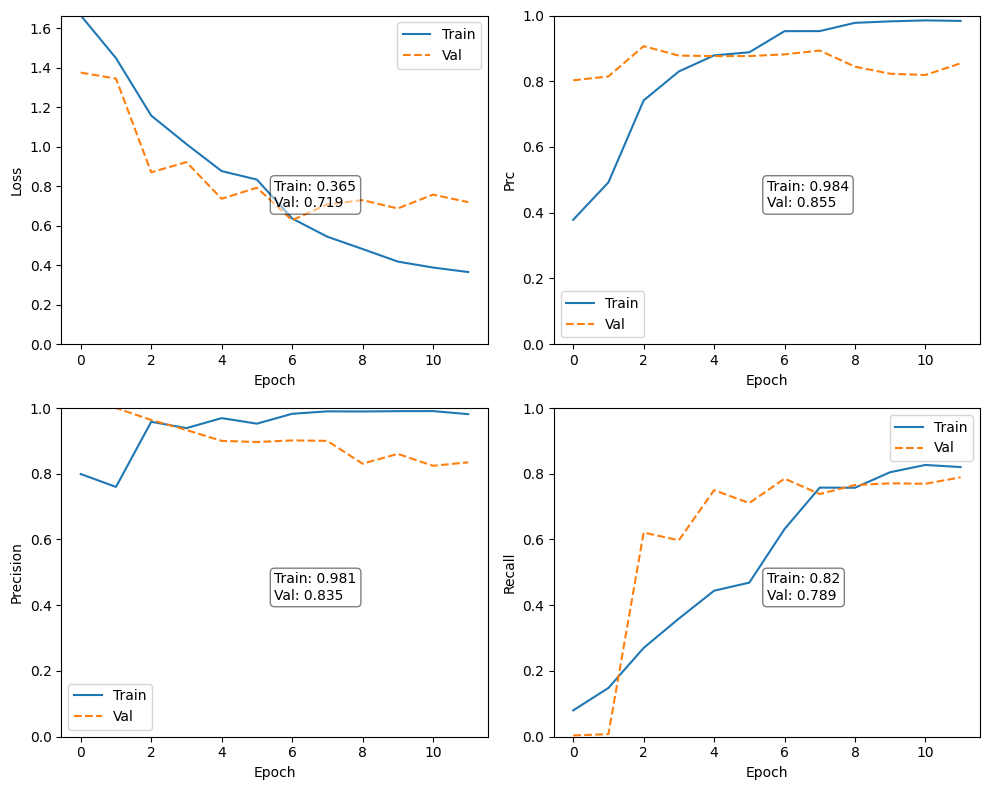

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 406ms/step


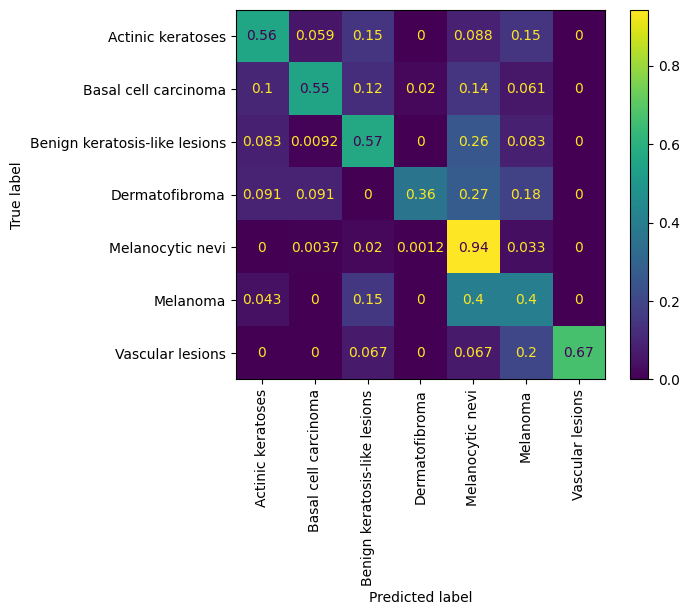

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.50      0.56      0.53        34
         Basal cell carcinoma       0.79      0.55      0.65        49
Benign keratosis-like lesions       0.60      0.57      0.58       109
               Dermatofibroma       0.67      0.36      0.47        11
             Melanocytic nevi       0.91      0.94      0.92       810
                     Melanoma       0.43      0.40      0.42        92
             Vascular lesions       1.00      0.67      0.80        15

                     accuracy                           0.82      1120
                    macro avg       0.70      0.58      0.62      1120
                 weighted avg       0.82      0.82      0.82      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.5981
F-beta Score (macro averaging): 0.5948
F-beta Score (weighted averaging): 0.8210


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


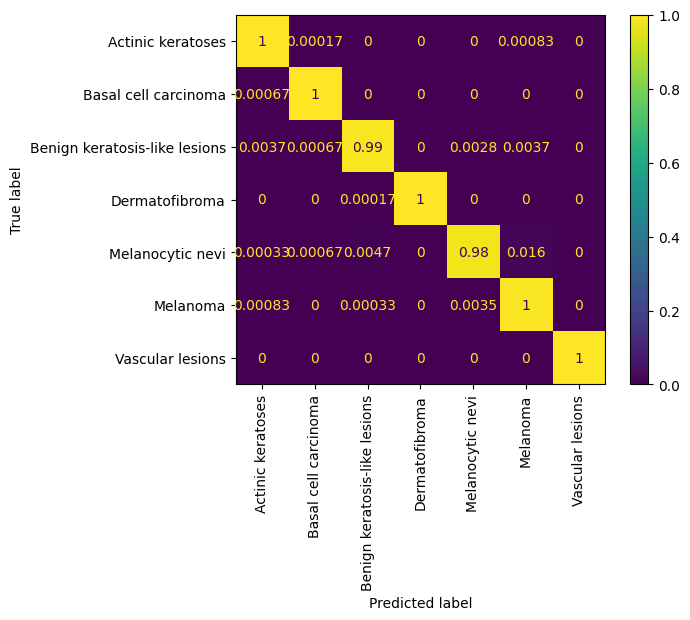

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.99      1.00      1.00      6000
         Basal cell carcinoma       1.00      1.00      1.00      6000
Benign keratosis-like lesions       0.99      0.99      0.99      6000
               Dermatofibroma       1.00      1.00      1.00      6000
             Melanocytic nevi       0.99      0.98      0.99      6000
                     Melanoma       0.98      1.00      0.99      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           0.99     42000
                    macro avg       0.99      0.99      0.99     42000
                 weighted avg       0.99      0.99      0.99     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9935
F-beta Score (macro averaging): 0.9944
F-beta Score (weighted averaging): 0.9944



## Tryout_3

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = GlobalAveragePooling2D()(last_output)

In [ ]:
layer_sizes = [512, 64, 32]
for size in layer_sizes:
    x = Dense(size)(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 117s 204ms/step - cat_accuracy: 0.3988 - fbeta_score: 0.3884 - loss: 1.6345 - prc: 0.4231 - precision: 0.6835 - recall: 0.1476 - val_cat_accuracy: 0.8164 - val_fbeta_score: 0.4991 - val_loss: 0.7834 - val_prc: 0.9044 - val_precision: 0.9699 - val_recall: 0.6289
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 460us/step - cat_accuracy: 0.7656 - fbeta_score: 0.7615 - loss: 0.8518 - prc: 0.8593 - precision: 0.9189 - recall: 0.5312 - val_cat_accuracy: 0.8008 - val_fbeta_score: 0.5823 - val_loss: 0.7651 - val_prc: 0.8960 - val_precision: 0.9521 - val_recall: 0.6211
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - cat_accuracy: 0.8443 - fbeta_score: 0.8440 - loss: 0.6802 - prc: 0.9091 - precision: 0.9494 - recall: 0.6414 - val_cat_accuracy: 0.7812 - val_fbeta_score: 0.4232 - val_loss: 0.7364 - val_prc: 0.8296 - val_precision: 0.8553 - val_recall: 0.7617
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - cat_accuracy: 0.9453 - fbeta_score: 0.9422 - loss: 0.4005 - prc: 0.9739 - precision: 0.9643 - recall: 0.8438 - val_cat_accuracy: 0.8203 - val_fbeta_score: 0.5621 - val_loss: 0.6030 - val_prc: 0.8740 - val_precision: 0.8734 - val_recall: 0.7812
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - cat_accuracy: 0.9625 - fbeta_score: 0.9626 - loss: 0.3276 - prc: 0.9863 - precision: 0.9837 - recall: 0.8778 - val_cat_accuracy: 0.8646 - val_fbeta_score: 0.5144 - val_loss: 0.4763 - val_prc: 0.9127 - val_precision: 0.8889 - val_recall: 0.8333
Epoch 6/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 458us/step - cat_accuracy: 0.9766 - fbeta_score: 0.9754 - loss: 0.

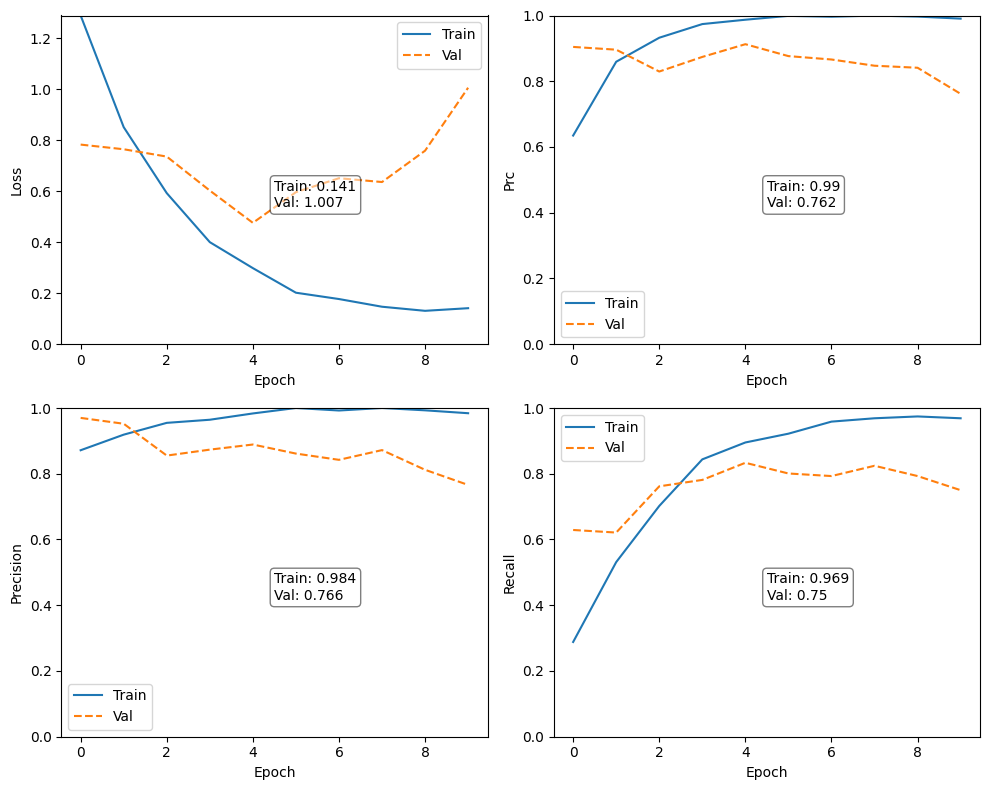

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 390ms/step


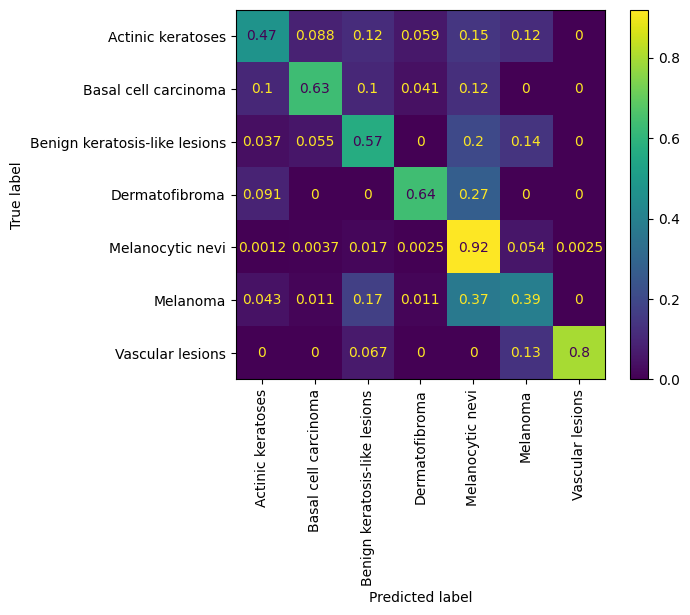

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.52      0.47      0.49        34
         Basal cell carcinoma       0.70      0.63      0.67        49
Benign keratosis-like lesions       0.61      0.57      0.59       109
               Dermatofibroma       0.50      0.64      0.56        11
             Melanocytic nevi       0.91      0.92      0.92       810
                     Melanoma       0.36      0.39      0.37        92
             Vascular lesions       0.86      0.80      0.83        15

                     accuracy                           0.81      1120
                    macro avg       0.64      0.63      0.63      1120
                 weighted avg       0.81      0.81      0.81      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.5843
F-beta Score (macro averaging): 0.6310
F-beta Score (weighted averaging): 0.8108


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


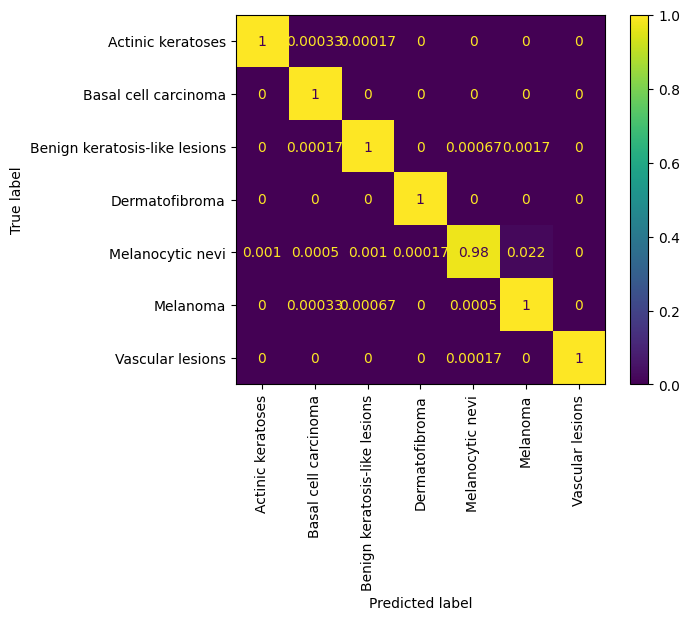

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       1.00      1.00      1.00      6000
         Basal cell carcinoma       1.00      1.00      1.00      6000
Benign keratosis-like lesions       1.00      1.00      1.00      6000
               Dermatofibroma       1.00      1.00      1.00      6000
             Melanocytic nevi       1.00      0.98      0.99      6000
                     Melanoma       0.98      1.00      0.99      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           1.00     42000
                    macro avg       1.00      1.00      1.00     42000
                 weighted avg       1.00      1.00      1.00     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9952
F-beta Score (macro averaging): 0.9958
F-beta Score (weighted averaging): 0.9958



## Tryout_4

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = Dropout(0.25)(last_output)
x = GlobalAveragePooling2D()(x)

In [ ]:
layer_sizes = [512, 128]
for size in layer_sizes:
    x = Dense(size)(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 115s 199ms/step - cat_accuracy: 0.5245 - fbeta_score: 0.5218 - loss: 1.2833 - prc: 0.5868 - precision: 0.7028 - recall: 0.3477 - val_cat_accuracy: 0.8320 - val_fbeta_score: 0.6308 - val_loss: 0.5209 - val_prc: 0.9062 - val_precision: 0.8565 - val_recall: 0.7930 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - cat_accuracy: 0.8984 - fbeta_score: 0.8881 - loss: 0.3337 - prc: 0.9540 - precision: 0.9256 - recall: 0.8750 - val_cat_accuracy: 0.8438 - val_fbeta_score: 0.6427 - val_loss: 0.5344 - val_prc: 0.9093 - val_precision: 0.8690 - val_recall: 0.7773 - learning_rate: 1.0000e-04
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - cat_accuracy: 0.9249 - fbeta_score: 0.9249 - loss: 0.2491 - prc: 0.9773 - precision: 0.9479 - recall: 0.8989 - val_cat_accuracy: 0.8086 - val_fbeta_score: 0.5443 - val_loss: 0.6860 - val_prc: 0.8733 - val_precision: 0.8160 - val_recall: 0.7969 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - cat_accuracy: 0.9375 - fbeta_score: 0.9329 - loss: 0.1651 - prc: 0.9837 - precision: 0.9524 - recall: 0.9375 - val_cat_accuracy: 0.8516 - val_fbeta_score: 0.6440 - val_loss: 0.5374 - val_prc: 0.9103 - val_precision: 0.8595 - val_recall: 0.8125 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - cat_accuracy: 0.9829 - fbeta_score: 0.9827 - loss: 0.0766 - prc: 0.9978 - precision: 0.9877 - recall: 0.9778 - val_cat_accuracy: 0.8125 - val_fbeta_score: 0.7222 - val_loss: 0.6758 - val_prc: 0.8596 - val_precision: 0.8152 - val_recall: 0.7812 - learning_rate: 1.0000e-04
Epoch 6/50
328/328 ━━━━━━

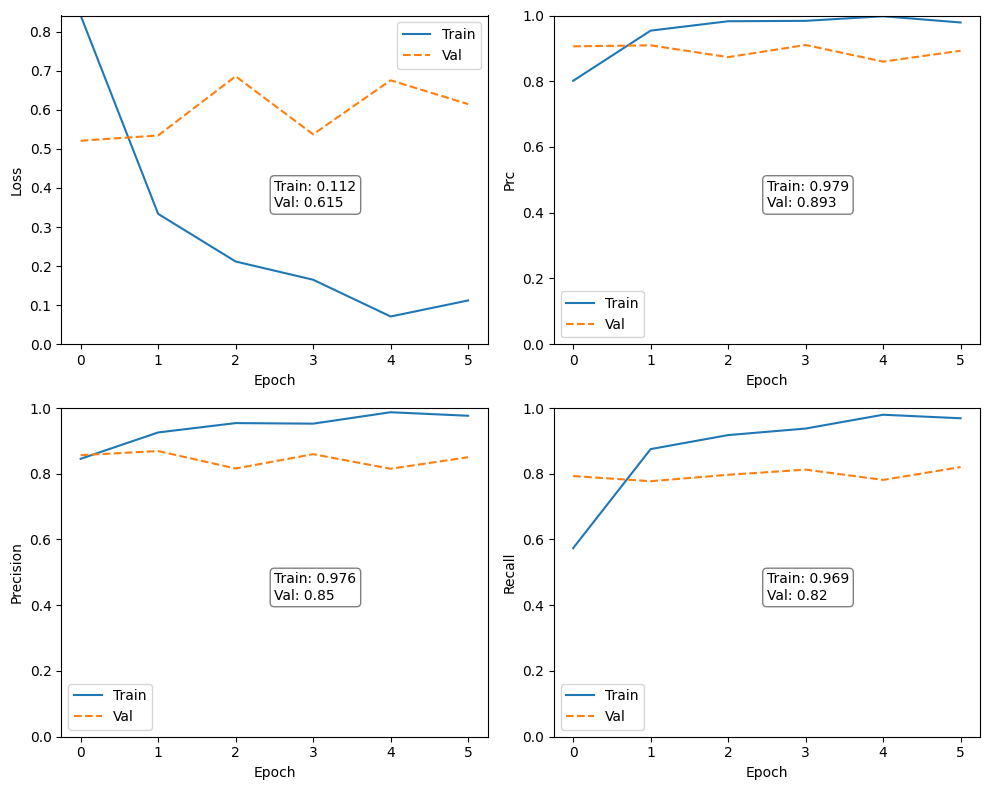

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 384ms/step


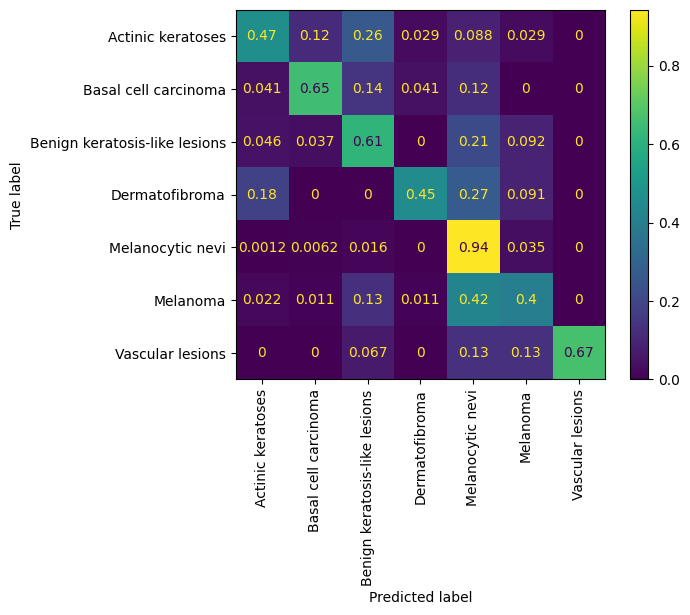

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.57      0.47      0.52        34
         Basal cell carcinoma       0.70      0.65      0.67        49
Benign keratosis-like lesions       0.61      0.61      0.61       109
               Dermatofibroma       0.56      0.45      0.50        11
             Melanocytic nevi       0.91      0.94      0.93       810
                     Melanoma       0.47      0.40      0.43        92
             Vascular lesions       1.00      0.67      0.80        15

                     accuracy                           0.83      1120
                    macro avg       0.69      0.60      0.64      1120
                 weighted avg       0.82      0.83      0.83      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.6157
F-beta Score (macro averaging): 0.6141
F-beta Score (weighted averaging): 0.8282


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step


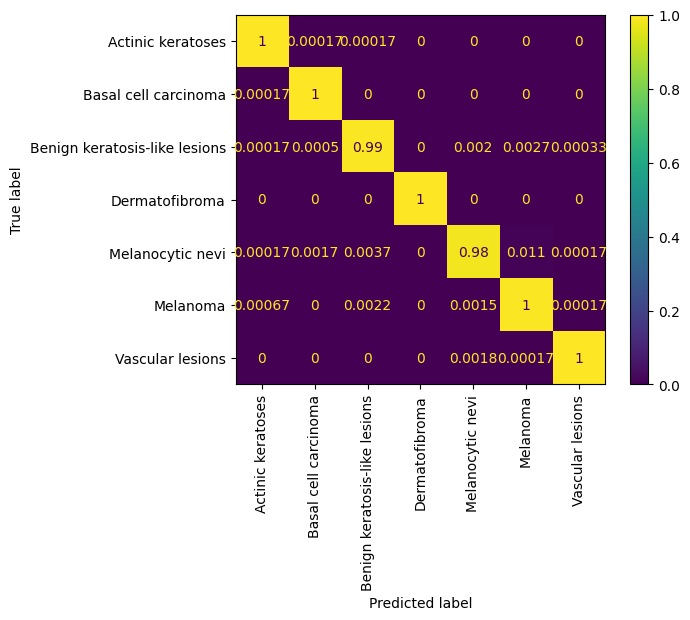

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       1.00      1.00      1.00      6000
         Basal cell carcinoma       1.00      1.00      1.00      6000
Benign keratosis-like lesions       0.99      0.99      0.99      6000
               Dermatofibroma       1.00      1.00      1.00      6000
             Melanocytic nevi       0.99      0.98      0.99      6000
                     Melanoma       0.99      1.00      0.99      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           1.00     42000
                    macro avg       1.00      1.00      1.00     42000
                 weighted avg       1.00      1.00      1.00     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9951
F-beta Score (macro averaging): 0.9958
F-beta Score (weighted averaging): 0.9958



## Tryout_5

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = Dropout(0.5)(last_output)
x = GlobalAveragePooling2D()(x)

In [ ]:
layer_sizes = [512, 64]
for size in layer_sizes:
    x = Dense(size)(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 112s 196ms/step - cat_accuracy: 0.4829 - fbeta_score: 0.4823 - loss: 1.3933 - prc: 0.5390 - precision: 0.7150 - recall: 0.2749 - val_cat_accuracy: 0.8086 - val_fbeta_score: 0.5807 - val_loss: 0.5291 - val_prc: 0.9123 - val_precision: 0.8705 - val_recall: 0.7617 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 430us/step - cat_accuracy: 0.8984 - fbeta_score: 0.9049 - loss: 0.3718 - prc: 0.9575 - precision: 0.9474 - recall: 0.8438 - val_cat_accuracy: 0.8047 - val_fbeta_score: 0.4481 - val_loss: 0.5525 - val_prc: 0.9058 - val_precision: 0.8634 - val_recall: 0.7656 - learning_rate: 1.0000e-04
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - cat_accuracy: 0.9175 - fbeta_score: 0.9170 - loss: 0.3078 - prc: 0.9717 - precision: 0.9491 - recall: 0.8715 - val_cat_accuracy: 0.7930 - val_fbeta_score: 0.4961 - val_loss: 0.6699 - val_prc: 0.8677 - val_precision: 0.8421 - val_recall: 0.7500 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - cat_accuracy: 0.9844 - fbeta_score: 0.9835 - loss: 0.1329 - prc: 0.9975 - precision: 0.9919 - recall: 0.9609 - val_cat_accuracy: 0.8203 - val_fbeta_score: 0.4988 - val_loss: 0.5848 - val_prc: 0.8858 - val_precision: 0.8681 - val_recall: 0.7969 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - cat_accuracy: 0.9831 - fbeta_score: 0.9831 - loss: 0.1025 - prc: 0.9979 - precision: 0.9885 - recall: 0.9743 - val_cat_accuracy: 0.8125 - val_fbeta_score: 0.5068 - val_loss: 0.6058 - val_prc: 0.8931 - val_precision: 0.8261 - val_recall: 0.7917 - learning_rate: 1.0000e-04
Epoch 6/50
328/328 ━━━━━━

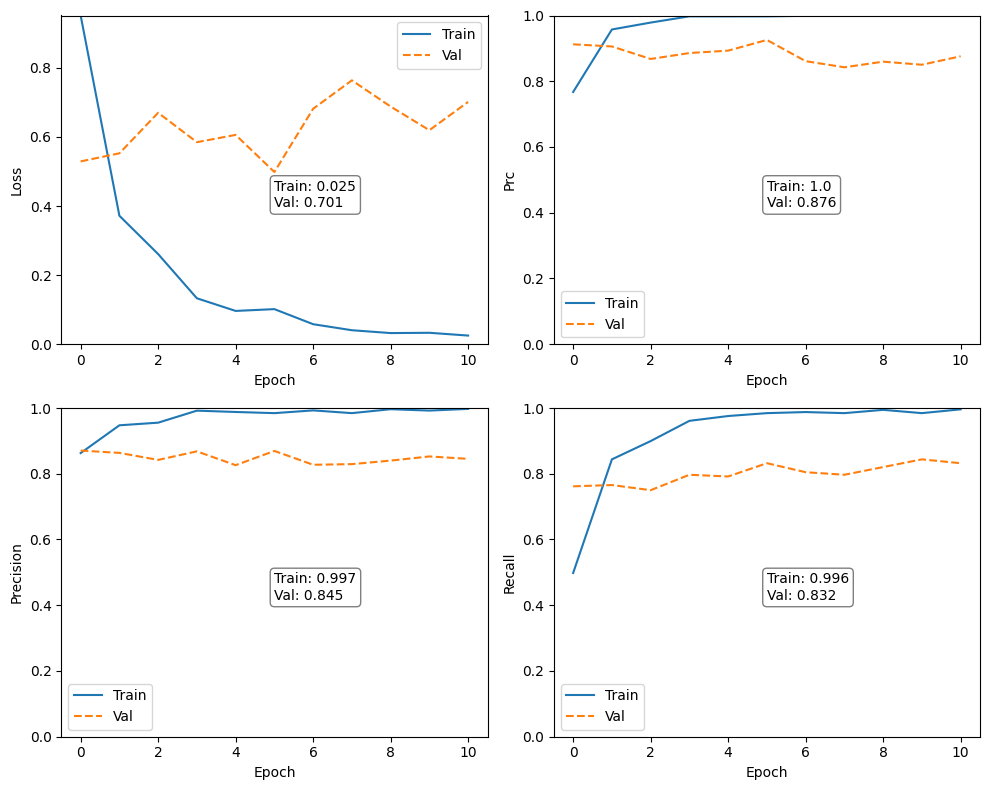

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 385ms/step


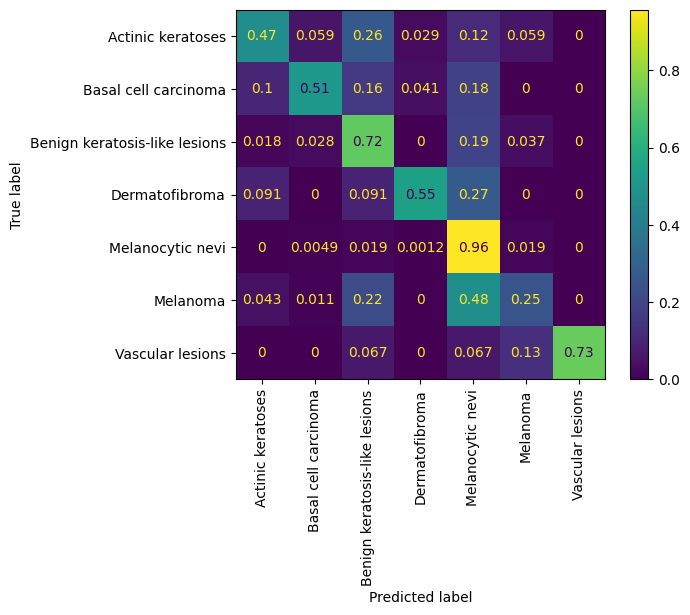

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.57      0.47      0.52        34
         Basal cell carcinoma       0.71      0.51      0.60        49
Benign keratosis-like lesions       0.59      0.72      0.65       109
               Dermatofibroma       0.60      0.55      0.57        11
             Melanocytic nevi       0.90      0.96      0.93       810
                     Melanoma       0.50      0.25      0.33        92
             Vascular lesions       1.00      0.73      0.85        15

                     accuracy                           0.83      1120
                    macro avg       0.70      0.60      0.63      1120
                 weighted avg       0.82      0.83      0.82      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.6198
F-beta Score (macro averaging): 0.6110
F-beta Score (weighted averaging): 0.8287


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


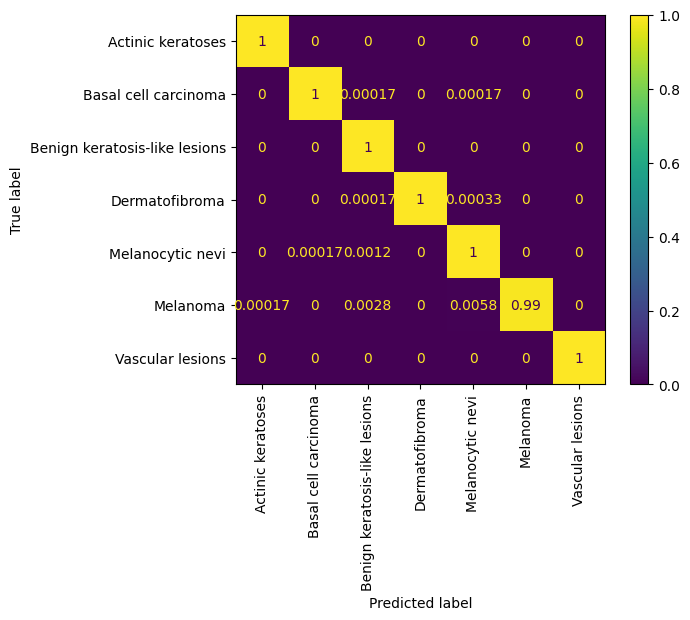

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       1.00      1.00      1.00      6000
         Basal cell carcinoma       1.00      1.00      1.00      6000
Benign keratosis-like lesions       1.00      1.00      1.00      6000
               Dermatofibroma       1.00      1.00      1.00      6000
             Melanocytic nevi       0.99      1.00      1.00      6000
                     Melanoma       1.00      0.99      1.00      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           1.00     42000
                    macro avg       1.00      1.00      1.00     42000
                 weighted avg       1.00      1.00      1.00     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9982
F-beta Score (macro averaging): 0.9984
F-beta Score (weighted averaging): 0.9984



## Tryout_6

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = Dropout(0.7)(last_output)
x = GlobalAveragePooling2D()(x)

In [ ]:
layer_sizes = [256, 64]
for size in layer_sizes:
    x = Dense(size)(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 111s 196ms/step - cat_accuracy: 0.4461 - fbeta_score: 0.4414 - loss: 1.5057 - prc: 0.4788 - precision: 0.6659 - recall: 0.2151 - val_cat_accuracy: 0.7891 - val_fbeta_score: 0.5575 - val_loss: 0.6934 - val_prc: 0.8560 - val_precision: 0.8905 - val_recall: 0.7305 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 441us/step - cat_accuracy: 0.8594 - fbeta_score: 0.8573 - loss: 0.4993 - prc: 0.9138 - precision: 0.8899 - recall: 0.7578 - val_cat_accuracy: 0.8203 - val_fbeta_score: 0.6002 - val_loss: 0.6535 - val_prc: 0.8858 - val_precision: 0.9000 - val_recall: 0.7383 - learning_rate: 1.0000e-04
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - cat_accuracy: 0.8959 - fbeta_score: 0.8952 - loss: 0.3820 - prc: 0.9582 - precision: 0.9404 - recall: 0.8395 - val_cat_accuracy: 0.8633 - val_fbeta_score: 0.6388 - val_loss: 0.4959 - val_prc: 0.9079 - val_precision: 0.8838 - val_recall: 0.8320 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - cat_accuracy: 0.9141 - fbeta_score: 0.9175 - loss: 0.2745 - prc: 0.9727 - precision: 0.9590 - recall: 0.9141 - val_cat_accuracy: 0.8438 - val_fbeta_score: 0.6122 - val_loss: 0.4882 - val_prc: 0.9040 - val_precision: 0.8875 - val_recall: 0.8320 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - cat_accuracy: 0.9778 - fbeta_score: 0.9778 - loss: 0.1305 - prc: 0.9960 - precision: 0.9853 - recall: 0.9681 - val_cat_accuracy: 0.7500 - val_fbeta_score: 0.4026 - val_loss: 0.8204 - val_prc: 0.7857 - val_precision: 0.7753 - val_recall: 0.7188 - learning_rate: 1.0000e-04
Epoch 6/50
328/328 ━━━━━━

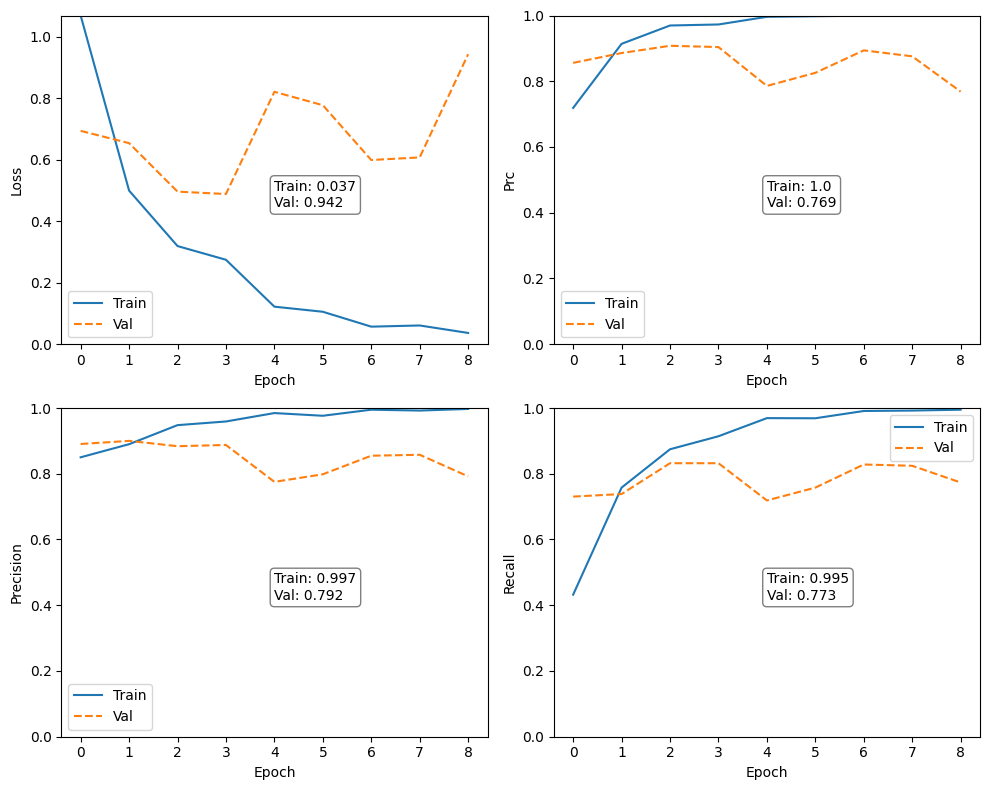

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 386ms/step


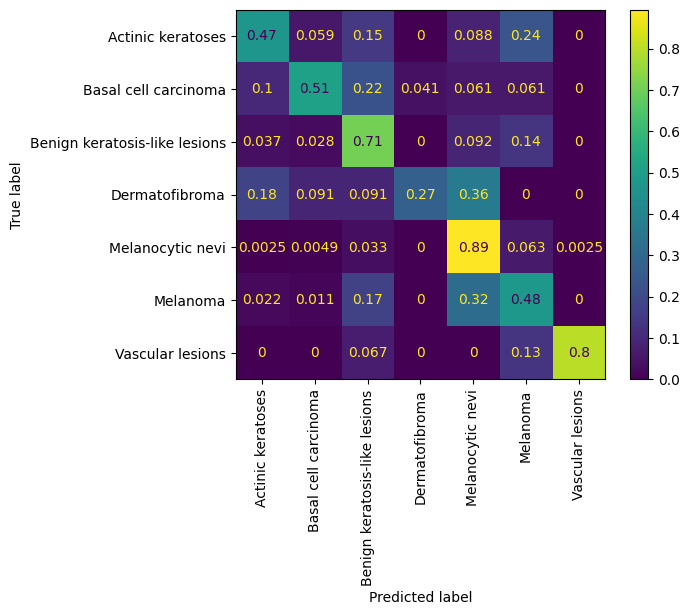

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.52      0.47      0.49        34
         Basal cell carcinoma       0.69      0.51      0.59        49
Benign keratosis-like lesions       0.56      0.71      0.62       109
               Dermatofibroma       0.60      0.27      0.37        11
             Melanocytic nevi       0.94      0.89      0.91       810
                     Melanoma       0.36      0.48      0.41        92
             Vascular lesions       0.86      0.80      0.83        15

                     accuracy                           0.80      1120
                    macro avg       0.65      0.59      0.60      1120
                 weighted avg       0.82      0.80      0.81      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.5925
F-beta Score (macro averaging): 0.5937
F-beta Score (weighted averaging): 0.8065


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


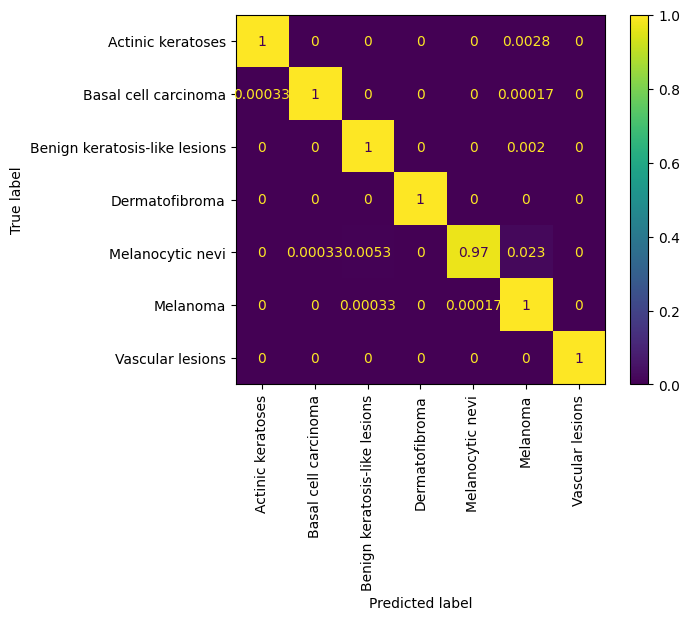

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       1.00      1.00      1.00      6000
         Basal cell carcinoma       1.00      1.00      1.00      6000
Benign keratosis-like lesions       0.99      1.00      1.00      6000
               Dermatofibroma       1.00      1.00      1.00      6000
             Melanocytic nevi       1.00      0.97      0.99      6000
                     Melanoma       0.97      1.00      0.99      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           1.00     42000
                    macro avg       1.00      1.00      1.00     42000
                 weighted avg       1.00      1.00      1.00     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9943
F-beta Score (macro averaging): 0.9951
F-beta Score (weighted averaging): 0.9951



## Tryout_7

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = Dropout(0.5)(last_output)
x = GlobalMaxPooling2D()(x)

In [ ]:
layer_sizes = [256, 64, 128]
for size in layer_sizes:
    x = Dense(size)(x)
    x = Dropout(0.4)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                    epochs = epochs,
                    validation_data = val_datagen.flow(X_valid, y_valid),
                    verbose = 1,
                    steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                    validation_steps=(X_valid.shape[0] // batch_size),
                    callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 134s 226ms/step - cat_accuracy: 0.1636 - fbeta_score: 0.1613 - loss: 2.1386 - prc: 0.1593 - precision: 0.2055 - recall: 0.0206 - val_cat_accuracy: 0.0234 - val_fbeta_score: 0.0209 - val_loss: 1.8074 - val_prc: 0.2237 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 454us/step - cat_accuracy: 0.2578 - fbeta_score: 0.2571 - loss: 1.8504 - prc: 0.2498 - precision: 0.4444 - recall: 0.0625 - val_cat_accuracy: 0.0195 - val_fbeta_score: 0.0534 - val_loss: 1.7853 - val_prc: 0.2381 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - cat_accuracy: 0.2653 - fbeta_score: 0.2591 - loss: 1.8053 - prc: 0.2547 - precision: 0.3820 - recall: 0.0490 - val_cat_accuracy: 0.0742 - val_fbeta_score: 0.0537 - val_loss: 1.6074 - val_prc: 0.2680 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step - cat_accuracy: 0.3906 - fbeta_score: 0.3804 - loss: 1.4988 - prc: 0.4224 - precision: 0.6471 - recall: 0.0859 - val_cat_accuracy: 0.0469 - val_fbeta_score: 0.0187 - val_loss: 1.7126 - val_prc: 0.2393 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - cat_accuracy: 0.3822 - fbeta_score: 0.3766 - loss: 1.4613 - prc: 0.4003 - precision: 0.5689 - recall: 0.1105 - val_cat_accuracy: 0.1146 - val_fbeta_score: 0.0710 - val_loss: 1.7158 - val_prc: 0.2123 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
E

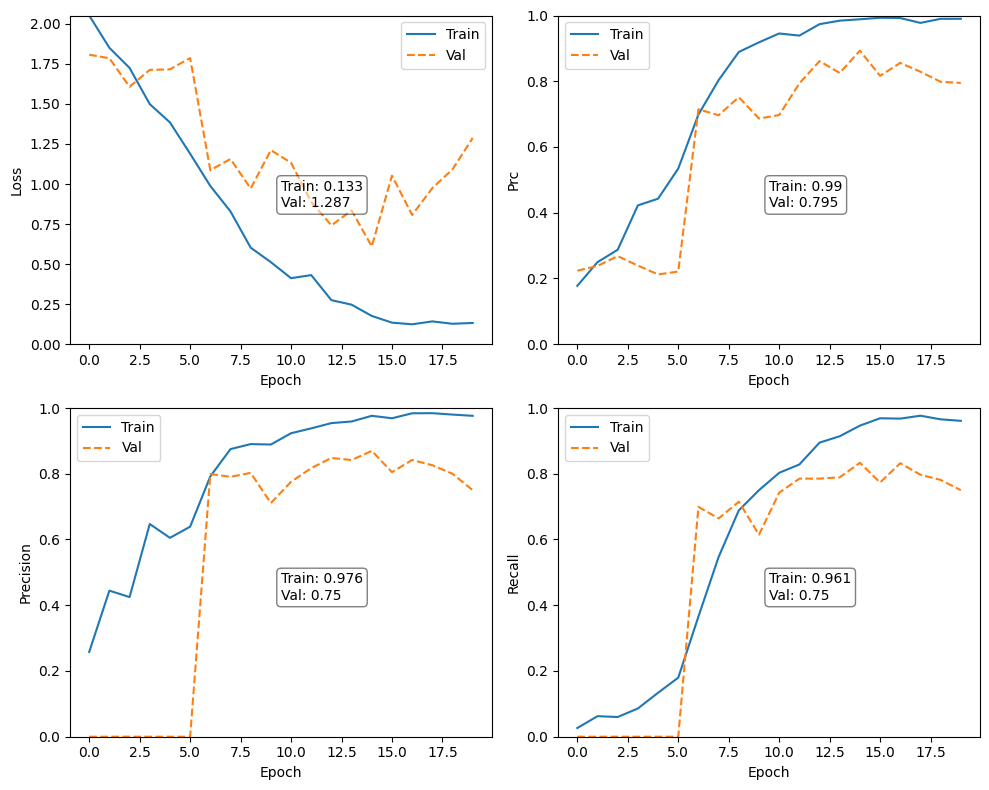

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 402ms/step


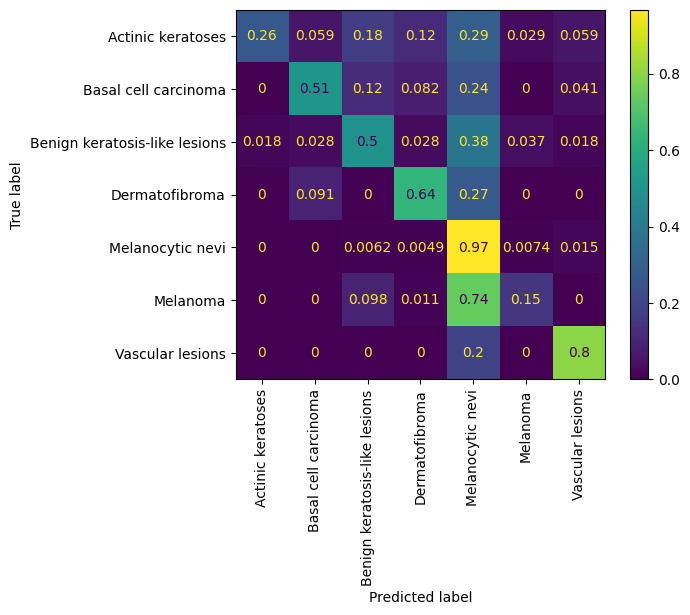

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.82      0.26      0.40        34
         Basal cell carcinoma       0.81      0.51      0.62        49
Benign keratosis-like lesions       0.68      0.50      0.57       109
               Dermatofibroma       0.30      0.64      0.41        11
             Melanocytic nevi       0.85      0.97      0.91       810
                     Melanoma       0.56      0.15      0.24        92
             Vascular lesions       0.40      0.80      0.53        15

                     accuracy                           0.81      1120
                    macro avg       0.63      0.55      0.53      1120
                 weighted avg       0.80      0.81      0.78      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.5304
F-beta Score (macro averaging): 0.5269
F-beta Score (weighted averaging): 0.7936


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


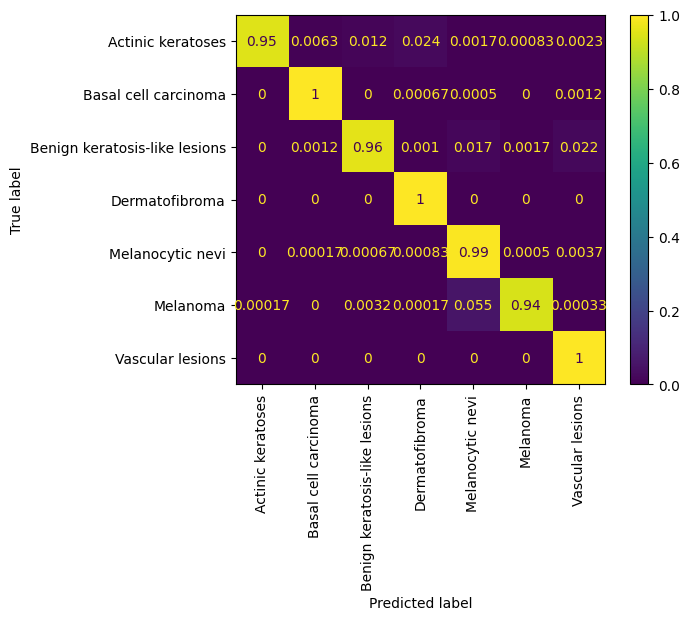

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       1.00      0.95      0.98      6000
         Basal cell carcinoma       0.99      1.00      1.00      6000
Benign keratosis-like lesions       0.98      0.96      0.97      6000
               Dermatofibroma       0.97      1.00      0.99      6000
             Melanocytic nevi       0.93      0.99      0.96      6000
                     Melanoma       1.00      0.94      0.97      6000
             Vascular lesions       0.97      1.00      0.99      6000

                     accuracy                           0.98     42000
                    macro avg       0.98      0.98      0.98     42000
                 weighted avg       0.98      0.98      0.98     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9741
F-beta Score (macro averaging): 0.9775
F-beta Score (weighted averaging): 0.9775


## Tryout_8

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = GlobalMaxPooling2D()(last_output)

In [ ]:
layer_sizes = [512, 128, 52, 16]
for size in layer_sizes:
    x = Dense(size)(x)
    x = Dropout(0.2)(x)
    x = ReLU()(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 80
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/80


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 147s 241ms/step - cat_accuracy: 0.4089 - fbeta_score: 0.4036 - loss: 1.5041 - prc: 0.4650 - precision: 0.6930 - recall: 0.2103 - val_cat_accuracy: 0.7969 - val_fbeta_score: 0.6330 - val_loss: 0.5976 - val_prc: 0.8854 - val_precision: 0.8369 - val_recall: 0.7617 - learning_rate: 1.0000e-04
Epoch 2/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - cat_accuracy: 0.8047 - fbeta_score: 0.7938 - loss: 0.4897 - prc: 0.9197 - precision: 0.9048 - recall: 0.7422 - val_cat_accuracy: 0.7461 - val_fbeta_score: 0.5969 - val_loss: 0.8291 - val_prc: 0.8280 - val_precision: 0.7913 - val_recall: 0.7109 - learning_rate: 1.0000e-04
Epoch 3/80


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - cat_accuracy: 0.8590 - fbeta_score: 0.8591 - loss: 0.4276 - prc: 0.9352 - precision: 0.9116 - recall: 0.8102 - val_cat_accuracy: 0.7578 - val_fbeta_score: 0.5223 - val_loss: 0.9069 - val_prc: 0.8589 - val_precision: 0.7884 - val_recall: 0.7422 - learning_rate: 1.0000e-04
Epoch 4/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - cat_accuracy: 0.9062 - fbeta_score: 0.9067 - loss: 0.2701 - prc: 0.9725 - precision: 0.9426 - recall: 0.8984 - val_cat_accuracy: 0.7578 - val_fbeta_score: 0.3679 - val_loss: 1.0783 - val_prc: 0.8024 - val_precision: 0.7860 - val_recall: 0.7461 - learning_rate: 1.0000e-04
Epoch 5/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - cat_accuracy: 0.9414 - fbeta_score: 0.9414 - loss: 0.1901 - prc: 0.9834 - precision: 0.9594 - recall: 0.9230 - val_cat_accuracy: 0.8438 - val_fbeta_score: 0.5501 - val_loss: 0.9552 - val_prc: 0.8896 - val_precision: 0.8421 - val_recall: 0.8333 - learning_rate: 1.0000e-04
Epoch 6/80
328/328 ━━━━━━

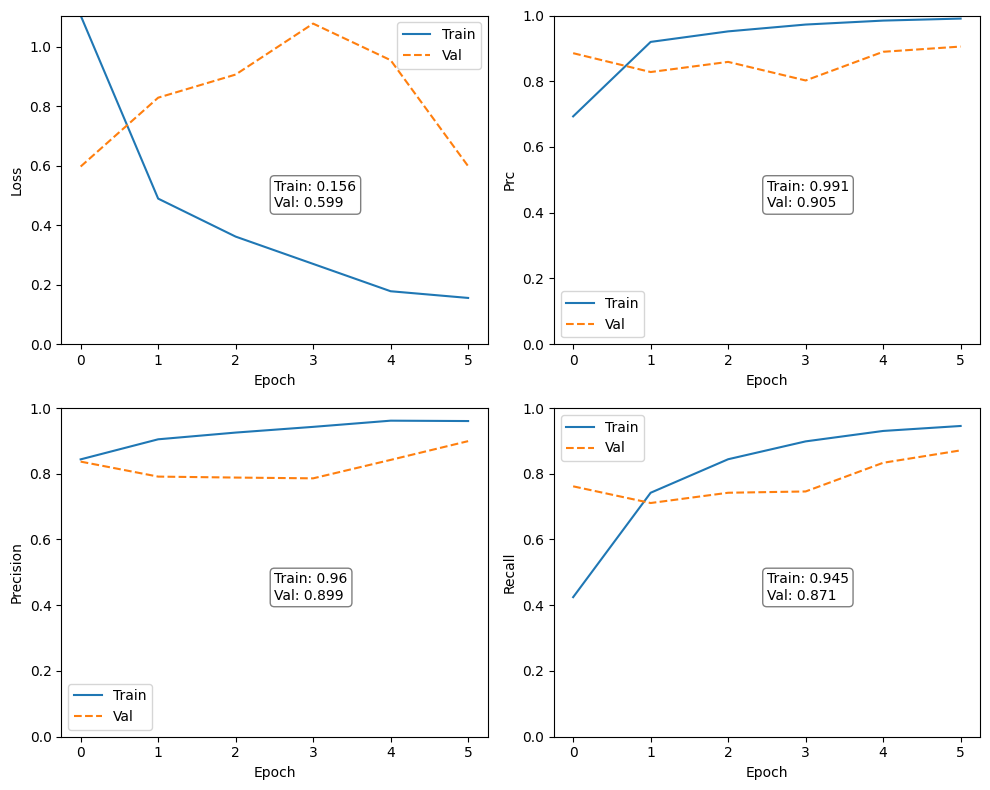

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step


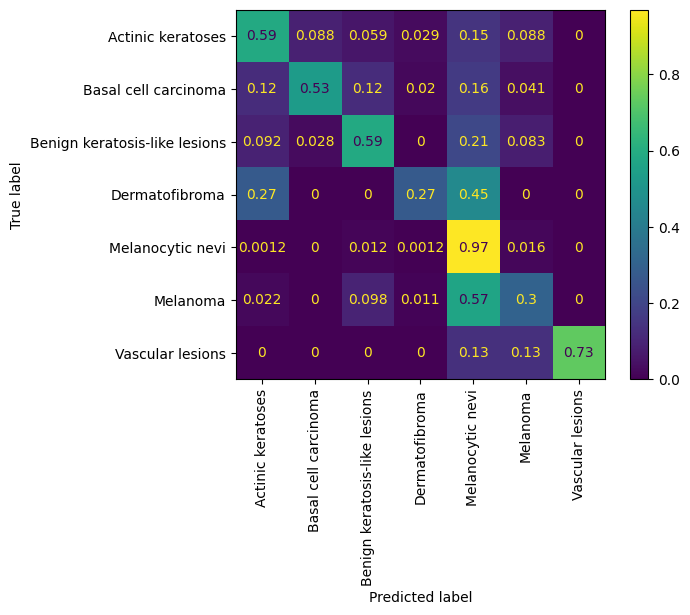

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.48      0.59      0.53        34
         Basal cell carcinoma       0.81      0.53      0.64        49
Benign keratosis-like lesions       0.70      0.59      0.64       109
               Dermatofibroma       0.43      0.27      0.33        11
             Melanocytic nevi       0.89      0.97      0.93       810
                     Melanoma       0.49      0.30      0.38        92
             Vascular lesions       1.00      0.73      0.85        15

                     accuracy                           0.84      1120
                    macro avg       0.69      0.57      0.61      1120
                 weighted avg       0.82      0.84      0.82      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.6156
F-beta Score (macro averaging): 0.5843
F-beta Score (weighted averaging): 0.8304


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


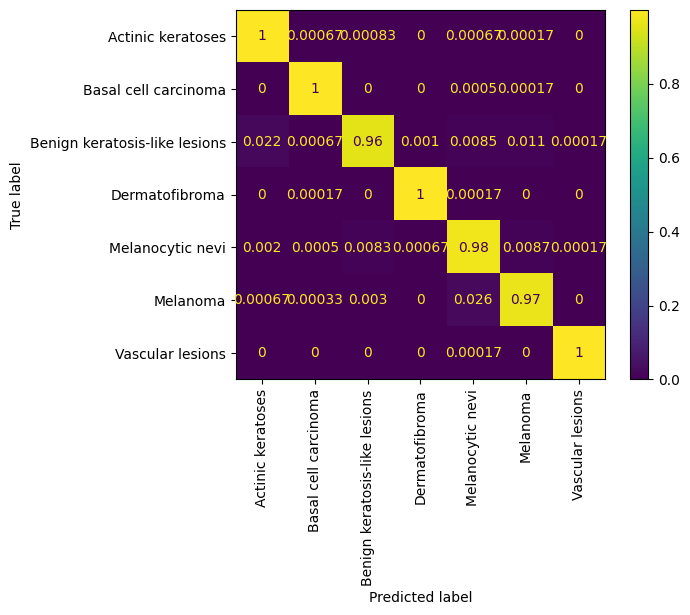

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.98      1.00      0.99      6000
         Basal cell carcinoma       1.00      1.00      1.00      6000
Benign keratosis-like lesions       0.99      0.96      0.97      6000
               Dermatofibroma       1.00      1.00      1.00      6000
             Melanocytic nevi       0.96      0.98      0.97      6000
                     Melanoma       0.98      0.97      0.98      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           0.99     42000
                    macro avg       0.99      0.99      0.99     42000
                 weighted avg       0.99      0.99      0.99     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9840
F-beta Score (macro averaging): 0.9862
F-beta Score (weighted averaging): 0.9862


## Tryout_9

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = Dropout(0.6)(last_output)
x = GlobalMaxPooling2D()(x)

In [ ]:
layer_sizes = [512, 8]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.3)(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 80
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                    epochs = epochs,
                    validation_data = val_datagen.flow(X_valid, y_valid),
                    verbose = 1,
                    steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                    validation_steps=(X_valid.shape[0] // batch_size),
                    callbacks=[early_stopping_monitor])

Epoch 1/80


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 108s 194ms/step - cat_accuracy: 0.2702 - fbeta_score: 0.2587 - loss: 1.7655 - prc: 0.3118 - precision: 0.6118 - recall: 0.0901 - val_cat_accuracy: 0.8086 - val_fbeta_score: 0.4884 - val_loss: 0.6990 - val_prc: 0.8836 - val_precision: 0.9349 - val_recall: 0.6172
Epoch 2/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 460us/step - cat_accuracy: 0.5469 - fbeta_score: 0.5442 - loss: 1.1236 - prc: 0.6600 - precision: 0.8030 - recall: 0.4141 - val_cat_accuracy: 0.7891 - val_fbeta_score: 0.3800 - val_loss: 0.6870 - val_prc: 0.8820 - val_precision: 0.9408 - val_recall: 0.6211
Epoch 3/80


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - cat_accuracy: 0.6516 - fbeta_score: 0.6427 - loss: 0.8557 - prc: 0.7832 - precision: 0.8424 - recall: 0.5377 - val_cat_accuracy: 0.8086 - val_fbeta_score: 0.5250 - val_loss: 0.5994 - val_prc: 0.8928 - val_precision: 0.8883 - val_recall: 0.6836
Epoch 4/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - cat_accuracy: 0.7344 - fbeta_score: 0.7381 - loss: 0.6914 - prc: 0.8549 - precision: 0.8476 - recall: 0.6953 - val_cat_accuracy: 0.7812 - val_fbeta_score: 0.4915 - val_loss: 0.7036 - val_prc: 0.8682 - val_precision: 0.8592 - val_recall: 0.6914
Epoch 5/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - cat_accuracy: 0.8015 - fbeta_score: 0.7999 - loss: 0.5153 - prc: 0.9088 - precision: 0.9012 - recall: 0.7512 - val_cat_accuracy: 0.8229 - val_fbeta_score: 0.5270 - val_loss: 0.5401 - val_prc: 0.9065 - val_precision: 0.9114 - val_recall: 0.7500
Epoch 6/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 442us/step - cat_accuracy: 0.8516 - fbeta_score: 0.8446 - loss: 0.

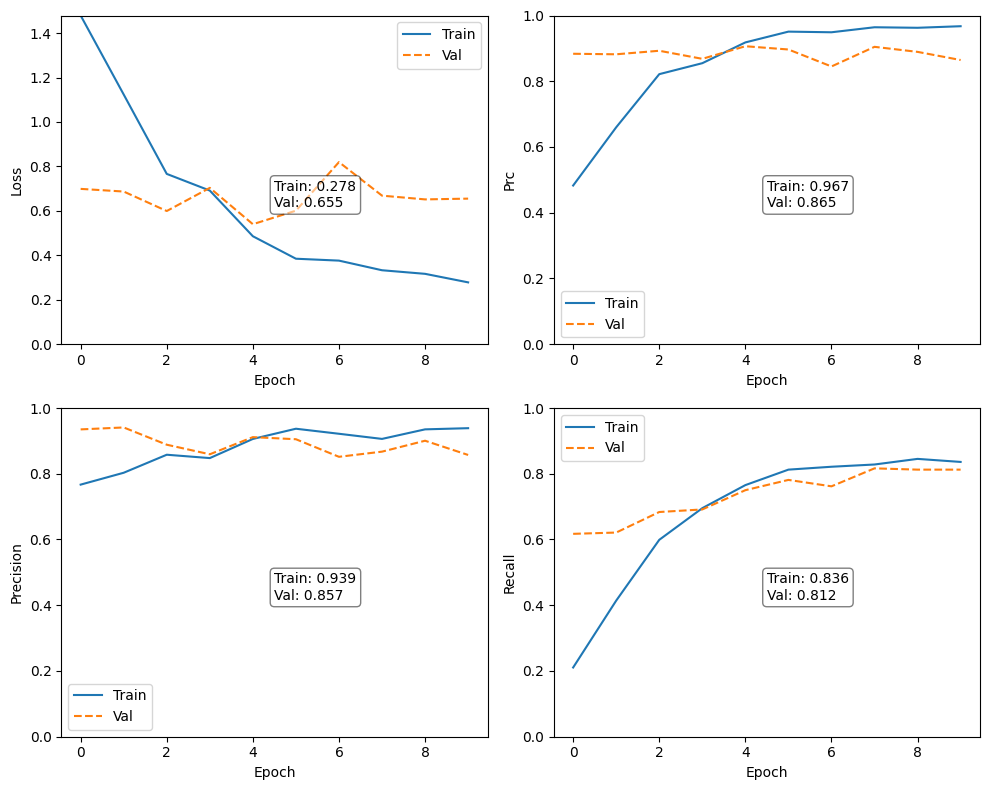

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 373ms/step


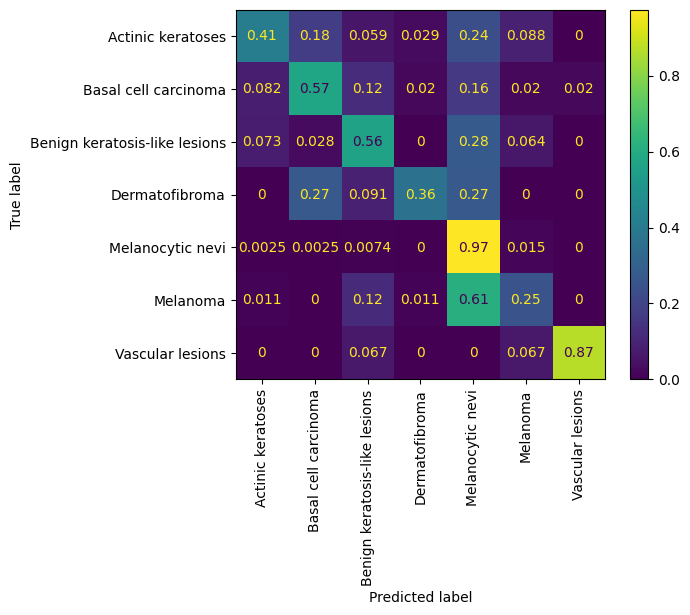

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.48      0.41      0.44        34
         Basal cell carcinoma       0.67      0.57      0.62        49
Benign keratosis-like lesions       0.69      0.56      0.62       109
               Dermatofibroma       0.57      0.36      0.44        11
             Melanocytic nevi       0.88      0.97      0.93       810
                     Melanoma       0.49      0.25      0.33        92
             Vascular lesions       0.93      0.87      0.90        15

                     accuracy                           0.83      1120
                    macro avg       0.67      0.57      0.61      1120
                 weighted avg       0.81      0.83      0.81      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.5984
F-beta Score (macro averaging): 0.5851
F-beta Score (weighted averaging): 0.8231


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


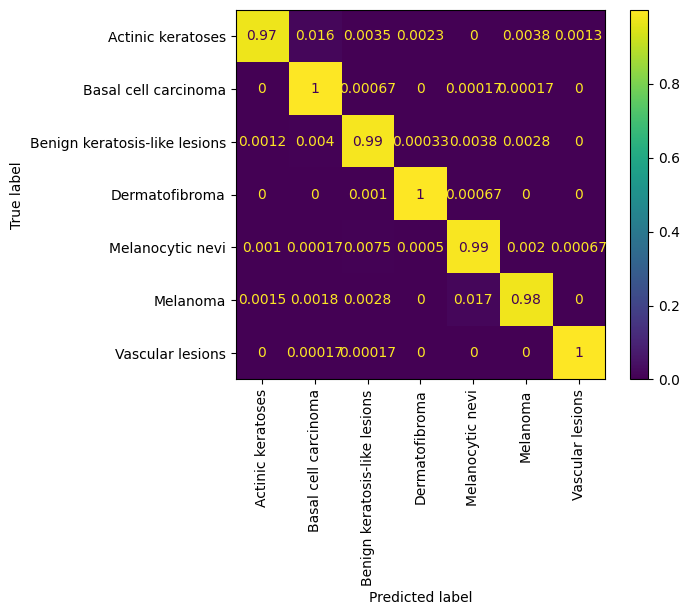

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       1.00      0.97      0.98      6000
         Basal cell carcinoma       0.98      1.00      0.99      6000
Benign keratosis-like lesions       0.98      0.99      0.99      6000
               Dermatofibroma       1.00      1.00      1.00      6000
             Melanocytic nevi       0.98      0.99      0.98      6000
                     Melanoma       0.99      0.98      0.98      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           0.99     42000
                    macro avg       0.99      0.99      0.99     42000
                 weighted avg       0.99      0.99      0.99     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9872
F-beta Score (macro averaging): 0.9890
F-beta Score (weighted averaging): 0.9890


## Tryout_10

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
last_output = last_layer.output

In [ ]:
x = GlobalMaxPooling2D()(last_output)

In [ ]:
layer_sizes = [1024, 128]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.8)(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 80
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                    epochs = epochs,
                    validation_data = val_datagen.flow(X_valid, y_valid),
                    verbose = 1,
                    steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                    validation_steps=(X_valid.shape[0] // batch_size),
                    callbacks=[early_stopping_monitor])

Epoch 1/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 104s 184ms/step - cat_accuracy: 0.1425 - fbeta_score: 0.1321 - loss: 2.0323 - prc: 0.1431 - precision: 0.1503 - recall: 0.0041 - val_cat_accuracy: 0.0039 - val_fbeta_score: 0.0027 - val_loss: 1.9468 - val_prc: 0.1429 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 442us/step - cat_accuracy: 0.1406 - fbeta_score: 0.1410 - loss: 1.9462 - prc: 0.1406 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_cat_accuracy: 0.0195 - val_fbeta_score: 0.0129 - val_loss: 1.9468 - val_prc: 0.1429 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - cat_accuracy: 0.1410 - fbeta_score: 0.1368 - loss: 1.9460 - prc: 0.1430 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_cat_accuracy: 0.0820 - val_fbeta_score: 0.0453 - val_loss: 1.9478 - val_prc: 0.1414 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - c

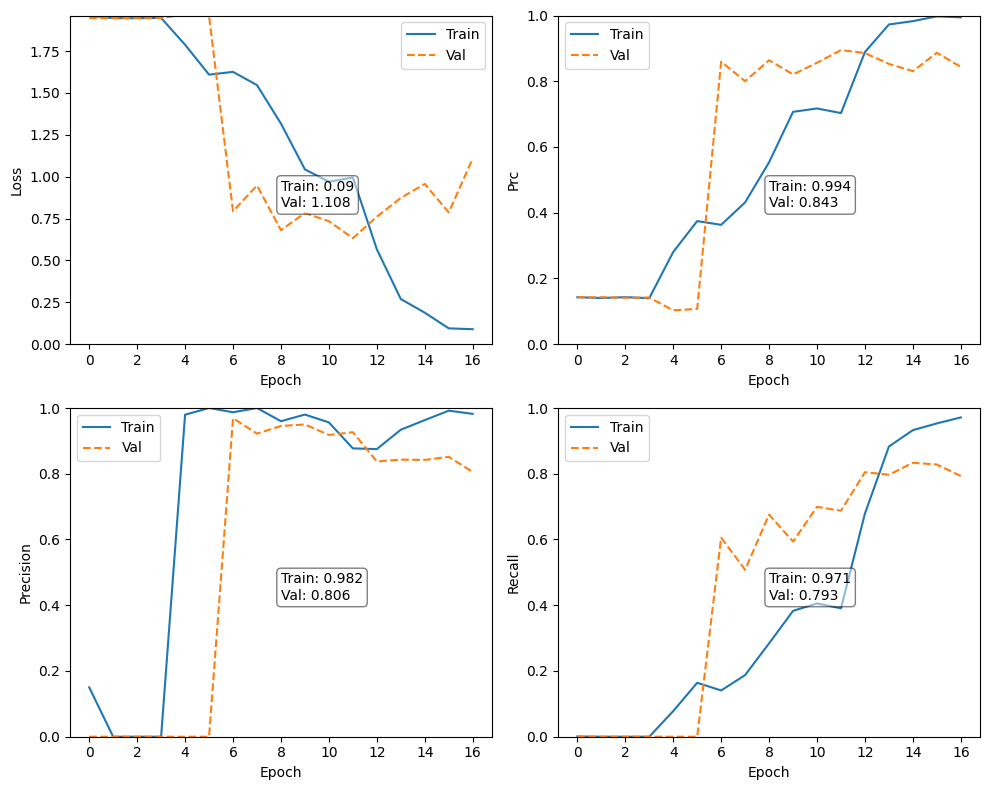

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 375ms/step


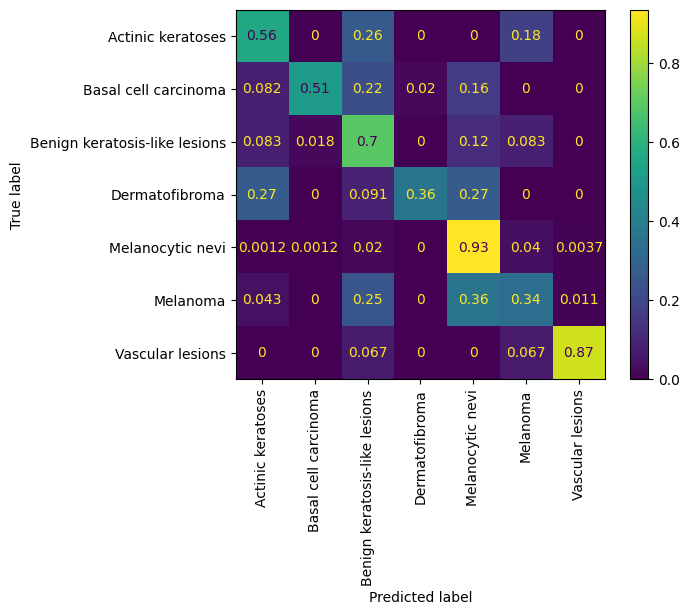

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.47      0.56      0.51        34
         Basal cell carcinoma       0.89      0.51      0.65        49
Benign keratosis-like lesions       0.55      0.70      0.62       109
               Dermatofibroma       0.80      0.36      0.50        11
             Melanocytic nevi       0.93      0.93      0.93       810
                     Melanoma       0.39      0.34      0.36        92
             Vascular lesions       0.76      0.87      0.81        15

                     accuracy                           0.83      1120
                    macro avg       0.69      0.61      0.63      1120
                 weighted avg       0.83      0.83      0.82      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.6175
F-beta Score (macro averaging): 0.6134
F-beta Score (weighted averaging): 0.8244


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


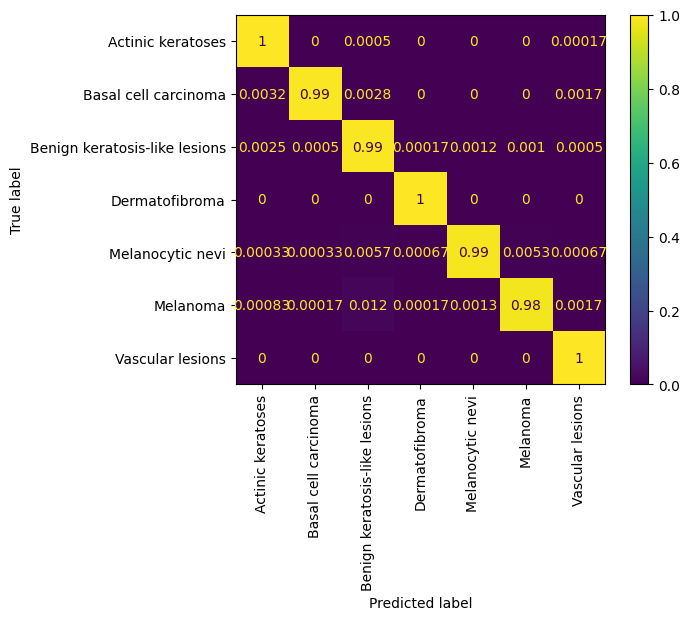

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.99      1.00      1.00      6000
         Basal cell carcinoma       1.00      0.99      1.00      6000
Benign keratosis-like lesions       0.98      0.99      0.99      6000
               Dermatofibroma       1.00      1.00      1.00      6000
             Melanocytic nevi       1.00      0.99      0.99      6000
                     Melanoma       0.99      0.98      0.99      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           0.99     42000
                    macro avg       0.99      0.99      0.99     42000
                 weighted avg       0.99      0.99      0.99     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9928
F-beta Score (macro averaging): 0.9938
F-beta Score (weighted averaging): 0.9938


## Tryout_11 (freeze -> warm)

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = GlobalAveragePooling2D()(last_output)

In [ ]:
layer_sizes = [128]
for size in layer_sizes:
    x = Dense(size, kernel_regularizer='l2',activation='relu')(x)
    x = Dropout(0.6)(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 80
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                    epochs = epochs,
                    validation_data = val_datagen.flow(X_valid, y_valid),
                    verbose = 1,
                    steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                    validation_steps=(X_valid.shape[0] // batch_size),
                    callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/80


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 28s 58ms/step - cat_accuracy: 0.2826 - fbeta_score: 0.2801 - loss: 3.9491 - prc: 0.2620 - precision: 0.4991 - recall: 0.0360 - val_cat_accuracy: 0.5938 - val_fbeta_score: 0.3122 - val_loss: 2.6980 - val_prc: 0.6571 - val_precision: 0.8788 - val_recall: 0.2266
Epoch 2/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - cat_accuracy: 0.4297 - fbeta_score: 0.4397 - loss: 2.9628 - prc: 0.4195 - precision: 0.5714 - recall: 0.1250 - val_cat_accuracy: 0.6328 - val_fbeta_score: 0.3438 - val_loss: 2.6614 - val_prc: 0.6936 - val_precision: 0.9375 - val_recall: 0.2344
Epoch 3/80


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.4757 - fbeta_score: 0.4702 - loss: 2.7124 - prc: 0.4848 - precision: 0.7176 - recall: 0.1685 - val_cat_accuracy: 0.6055 - val_fbeta_score: 0.2816 - val_loss: 2.0833 - val_prc: 0.6943 - val_precision: 0.8602 - val_recall: 0.3125
Epoch 4/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - cat_accuracy: 0.6094 - fbeta_score: 0.6033 - loss: 2.1905 - prc: 0.5812 - precision: 0.7000 - recall: 0.2188 - val_cat_accuracy: 0.5859 - val_fbeta_score: 0.2926 - val_loss: 2.1176 - val_prc: 0.6688 - val_precision: 0.8523 - val_recall: 0.2930
Epoch 5/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.5192 - fbeta_score: 0.5140 - loss: 2.1683 - prc: 0.5518 - precision: 0.7546 - recall: 0.2321 - val_cat_accuracy: 0.6771 - val_fbeta_score: 0.3440 - val_loss: 1.7140 - val_prc: 0.7540 - val_precision: 0.9375 - val_recall: 0.3125
Epoch 6/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step - cat_accuracy: 0.5938 - fbeta_score: 0.5696 - loss: 1.79

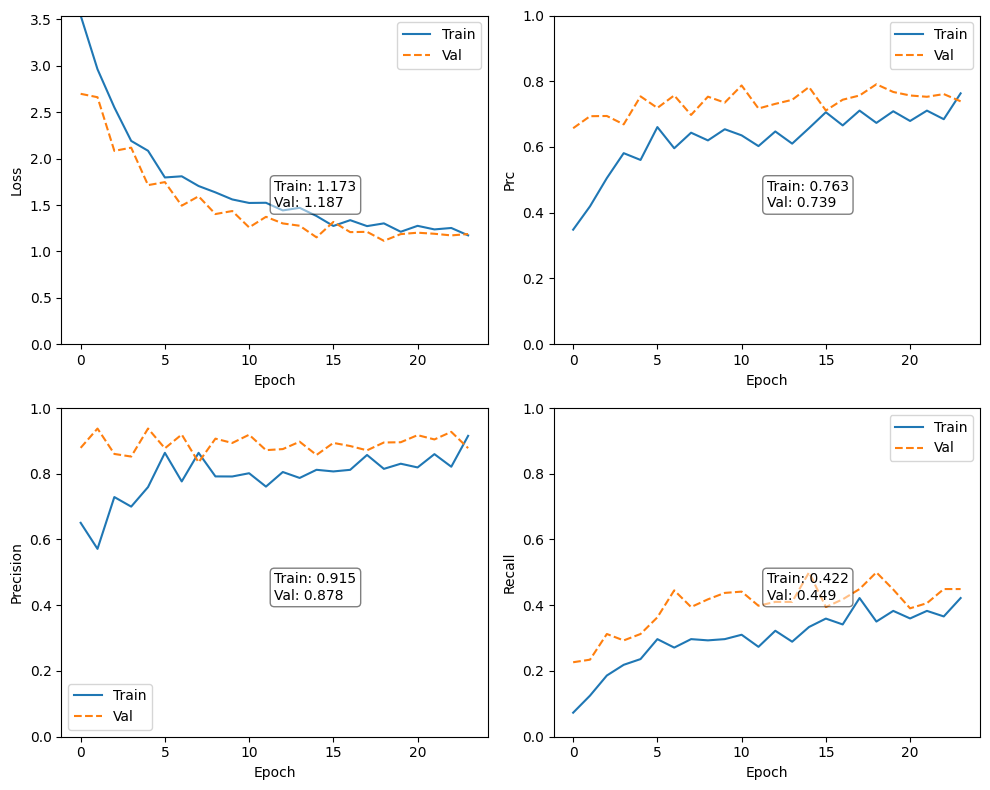

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 366ms/step


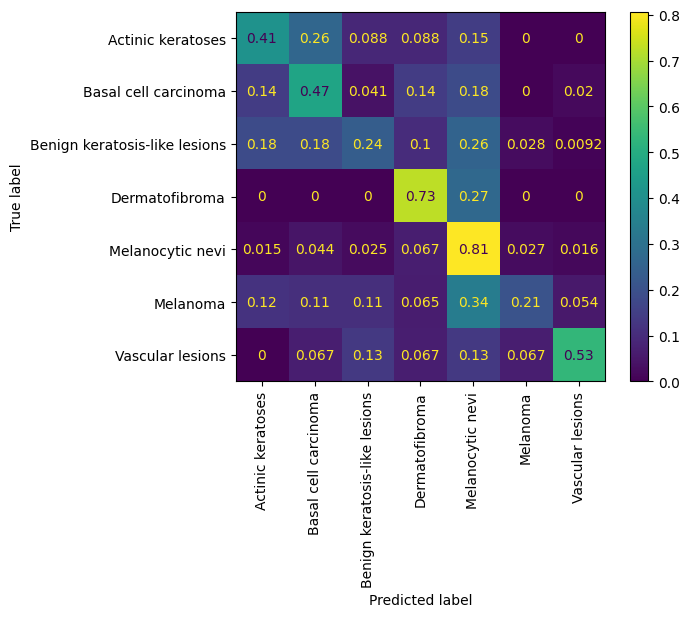

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.22      0.41      0.29        34
         Basal cell carcinoma       0.23      0.47      0.31        49
Benign keratosis-like lesions       0.41      0.24      0.30       109
               Dermatofibroma       0.09      0.73      0.16        11
             Melanocytic nevi       0.89      0.81      0.85       810
                     Melanoma       0.42      0.21      0.28        92
             Vascular lesions       0.29      0.53      0.37        15

                     accuracy                           0.67      1120
                    macro avg       0.36      0.48      0.36      1120
                 weighted avg       0.74      0.67      0.69      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.3644
F-beta Score (macro averaging): 0.4008
F-beta Score (weighted averaging): 0.6756


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


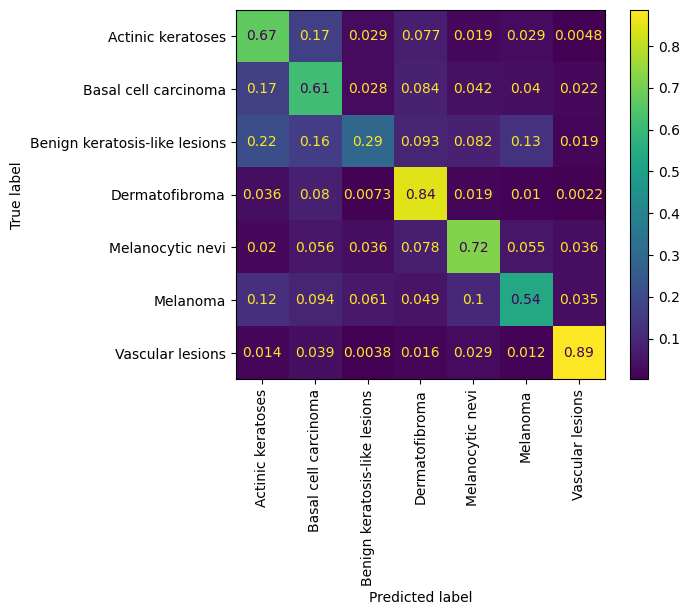

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.54      0.67      0.60      6000
         Basal cell carcinoma       0.51      0.61      0.55      6000
Benign keratosis-like lesions       0.64      0.29      0.40      6000
               Dermatofibroma       0.68      0.84      0.75      6000
             Melanocytic nevi       0.71      0.72      0.72      6000
                     Melanoma       0.66      0.54      0.59      6000
             Vascular lesions       0.88      0.89      0.88      6000

                     accuracy                           0.65     42000
                    macro avg       0.66      0.65      0.64     42000
                 weighted avg       0.66      0.65      0.64     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.7938
F-beta Score (macro averaging): 0.8220
F-beta Score (weighted averaging): 0.8220


Continue training but make warm start now

In [ ]:
for layer in model.layers:
    layer.trainable = True

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=15)

In [ ]:
batch_size = 128
epochs = 80
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                    epochs = epochs,
                    validation_data = val_datagen.flow(X_valid, y_valid),
                    verbose = 1,
                    steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                    validation_steps=(X_valid.shape[0] // batch_size),
                    callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/80
  3/328 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - cat_accuracy: 0.6042 - fbeta_score: 0.6046 - loss: 1.2290 - prc: 0.6811 - precision: 0.8247 - recall: 0.3932 

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - cat_accuracy: 0.6259 - fbeta_score: 0.6215 - loss: 1.1897 - prc: 0.7048 - precision: 0.8291 - recall: 0.3931 - val_cat_accuracy: 0.6836 - val_fbeta_score: 0.3590 - val_loss: 1.0930 - val_prc: 0.7763 - val_precision: 0.8881 - val_recall: 0.4648 - learning_rate: 1.0000e-04
Epoch 2/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - cat_accuracy: 0.6172 - fbeta_score: 0.6008 - loss: 1.1950 - prc: 0.6948 - precision: 0.8519 - recall: 0.3594 - val_cat_accuracy: 0.6797 - val_fbeta_score: 0.3637 - val_loss: 1.0901 - val_prc: 0.7731 - val_precision: 0.9154 - val_recall: 0.4648 - learning_rate: 1.0000e-04
Epoch 3/80


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.6241 - fbeta_score: 0.6209 - loss: 1.1784 - prc: 0.7076 - precision: 0.8315 - recall: 0.3941 - val_cat_accuracy: 0.6797 - val_fbeta_score: 0.3624 - val_loss: 1.0655 - val_prc: 0.7834 - val_precision: 0.8643 - val_recall: 0.4727 - learning_rate: 1.0000e-04
Epoch 4/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - cat_accuracy: 0.6406 - fbeta_score: 0.6451 - loss: 1.1966 - prc: 0.6996 - precision: 0.8036 - recall: 0.3516 - val_cat_accuracy: 0.6875 - val_fbeta_score: 0.4219 - val_loss: 1.0558 - val_prc: 0.7825 - val_precision: 0.8905 - val_recall: 0.4766 - learning_rate: 1.0000e-04
Epoch 5/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - cat_accuracy: 0.6307 - fbeta_score: 0.6273 - loss: 1.1655 - prc: 0.7129 - precision: 0.8365 - recall: 0.4010 - val_cat_accuracy: 0.7604 - val_fbeta_score: 0.4623 - val_loss: 1.0193 - val_prc: 0.8146 - val_precision: 0.9180 - val_recall: 0.5833 - learning_rate: 1.0000e-04
Epoch 6/80
328/328 ━━━━━━━━

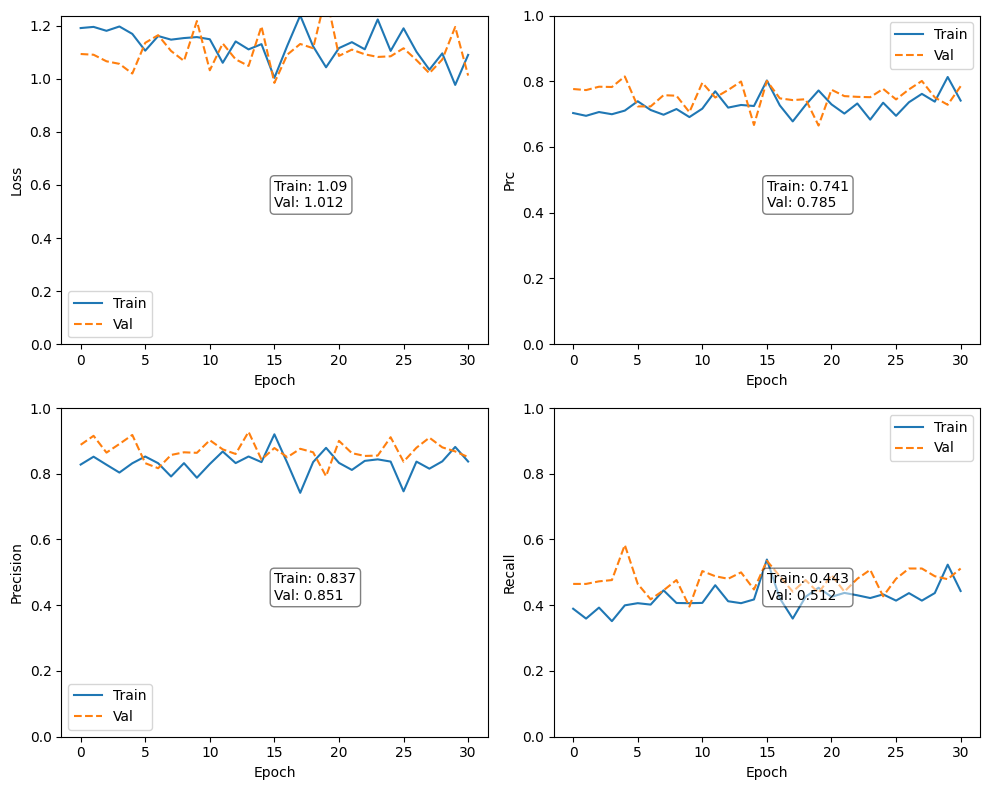

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


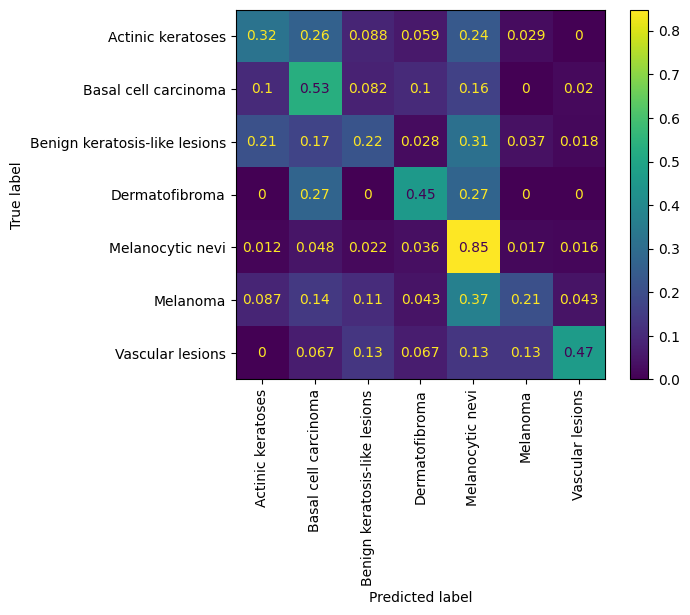

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.19      0.32      0.24        34
         Basal cell carcinoma       0.24      0.53      0.33        49
Benign keratosis-like lesions       0.39      0.22      0.28       109
               Dermatofibroma       0.10      0.45      0.17        11
             Melanocytic nevi       0.89      0.85      0.87       810
                     Melanoma       0.47      0.21      0.29        92
             Vascular lesions       0.26      0.47      0.33        15

                     accuracy                           0.70      1120
                    macro avg       0.36      0.44      0.36      1120
                 weighted avg       0.74      0.70      0.71      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.3751
F-beta Score (macro averaging): 0.3872
F-beta Score (weighted averaging): 0.6965


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step


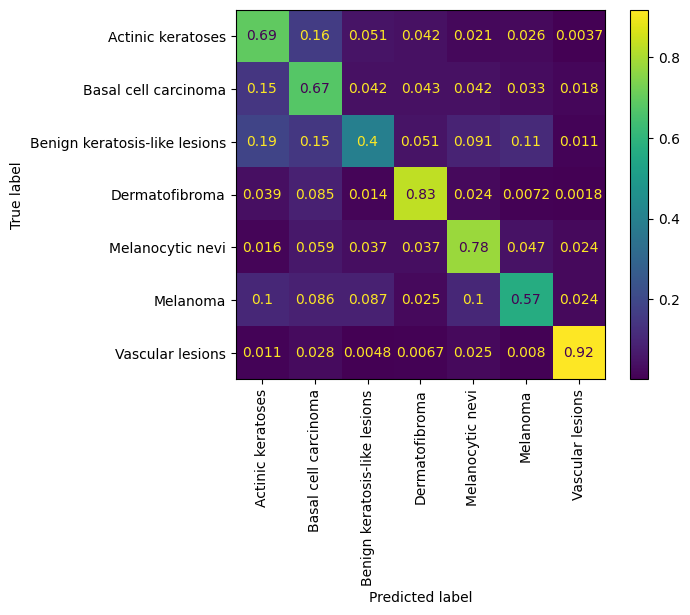

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.58      0.69      0.63      6000
         Basal cell carcinoma       0.54      0.67      0.60      6000
Benign keratosis-like lesions       0.63      0.40      0.49      6000
               Dermatofibroma       0.80      0.83      0.82      6000
             Melanocytic nevi       0.72      0.78      0.75      6000
                     Melanoma       0.71      0.57      0.63      6000
             Vascular lesions       0.92      0.92      0.92      6000

                     accuracy                           0.69     42000
                    macro avg       0.70      0.69      0.69     42000
                 weighted avg       0.70      0.69      0.69     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.6458
F-beta Score (macro averaging): 0.6913
F-beta Score (weighted averaging): 0.6913


## Tryout_12

https://www.kaggle.com/code/jnegrini/ham10000-analysis-and-model-comparison

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_output = xception_model.output
print('Last layer output shape:', last_output.shape)

Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = Flatten()(last_output)
x = BatchNormalization()(x)

In [ ]:
layer_sizes = [128]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.2)(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 80
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                    epochs = epochs,
                    validation_data = val_datagen.flow(X_valid, y_valid),
                    verbose = 1,
                    steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                    validation_steps=(X_valid.shape[0] // batch_size),
                    callbacks=[early_stopping_monitor])

Epoch 1/80


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 104s 186ms/step - cat_accuracy: 0.6068 - fbeta_score: 0.6043 - loss: 1.1082 - prc: 0.6901 - precision: 0.7268 - recall: 0.5049 - val_cat_accuracy: 0.7891 - val_fbeta_score: 0.5956 - val_loss: 0.5863 - val_prc: 0.8903 - val_precision: 0.8186 - val_recall: 0.7578
Epoch 2/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step - cat_accuracy: 0.8594 - fbeta_score: 0.8501 - loss: 0.3415 - prc: 0.9462 - precision: 0.8770 - recall: 0.8359 - val_cat_accuracy: 0.8164 - val_fbeta_score: 0.5621 - val_loss: 0.5735 - val_prc: 0.8975 - val_precision: 0.8571 - val_recall: 0.7969
Epoch 3/80


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - cat_accuracy: 0.9426 - fbeta_score: 0.9425 - loss: 0.1650 - prc: 0.9869 - precision: 0.9515 - recall: 0.9339 - val_cat_accuracy: 0.8242 - val_fbeta_score: 0.5747 - val_loss: 0.8257 - val_prc: 0.8806 - val_precision: 0.8340 - val_recall: 0.8242
Epoch 4/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - cat_accuracy: 0.9531 - fbeta_score: 0.9427 - loss: 0.1056 - prc: 0.9938 - precision: 0.9531 - recall: 0.9531 - val_cat_accuracy: 0.7891 - val_fbeta_score: 0.5115 - val_loss: 0.8818 - val_prc: 0.8366 - val_precision: 0.7920 - val_recall: 0.7734
Epoch 5/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - cat_accuracy: 0.9841 - fbeta_score: 0.9841 - loss: 0.0485 - prc: 0.9983 - precision: 0.9853 - recall: 0.9825 - val_cat_accuracy: 0.7917 - val_fbeta_score: 0.6384 - val_loss: 1.4850 - val_prc: 0.7947 - val_precision: 0.8000 - val_recall: 0.7917
Epoch 6/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 477us/step - cat_accuracy: 0.9844 - fbeta_score: 0.9815 - loss: 0.

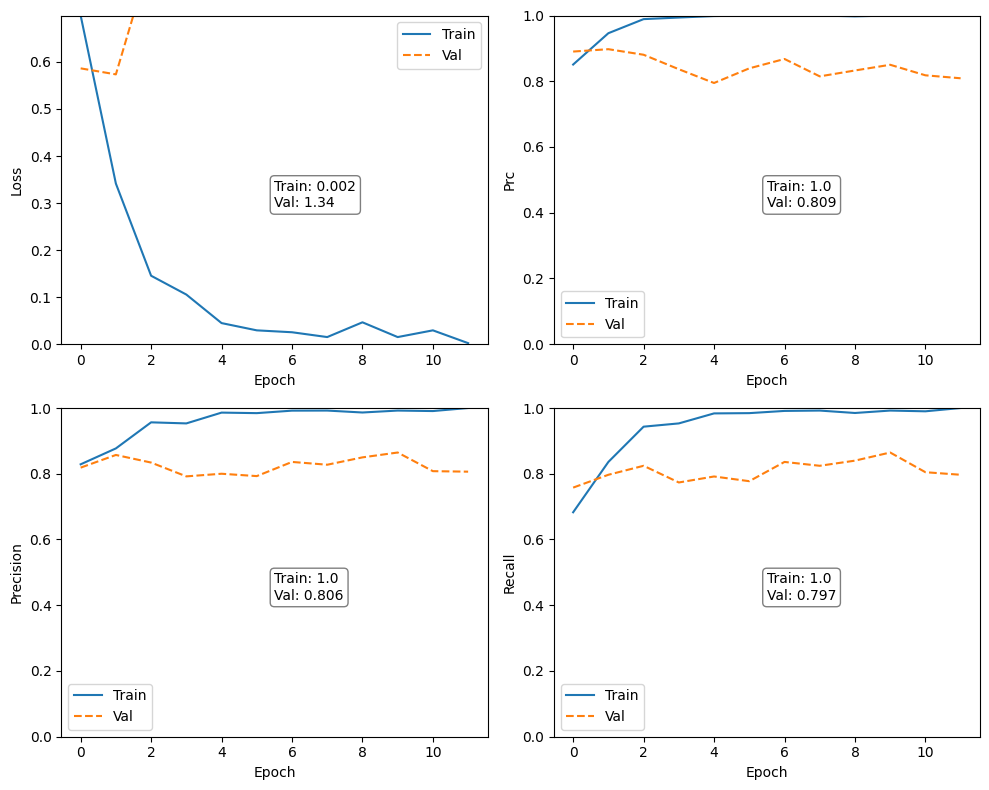

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 371ms/step


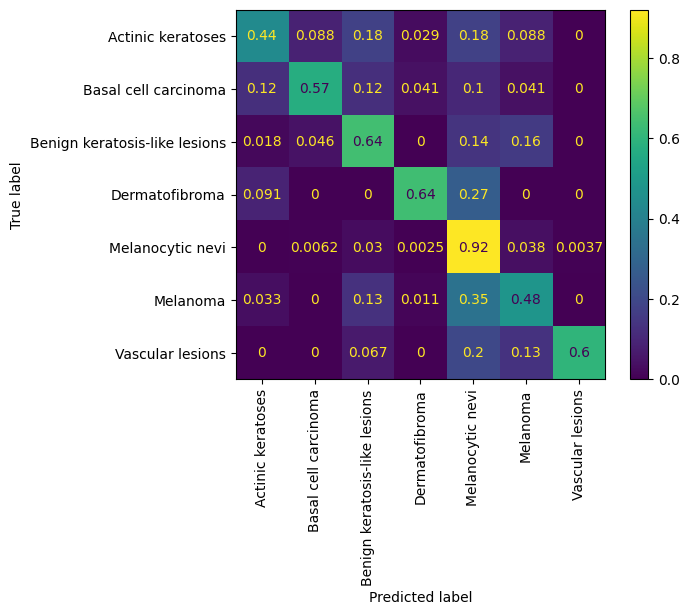

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.56      0.44      0.49        34
         Basal cell carcinoma       0.68      0.57      0.62        49
Benign keratosis-like lesions       0.59      0.64      0.61       109
               Dermatofibroma       0.54      0.64      0.58        11
             Melanocytic nevi       0.92      0.92      0.92       810
                     Melanoma       0.44      0.48      0.46        92
             Vascular lesions       0.75      0.60      0.67        15

                     accuracy                           0.82      1120
                    macro avg       0.64      0.61      0.62      1120
                 weighted avg       0.82      0.82      0.82      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.6058
F-beta Score (macro averaging): 0.6159
F-beta Score (weighted averaging): 0.8196


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


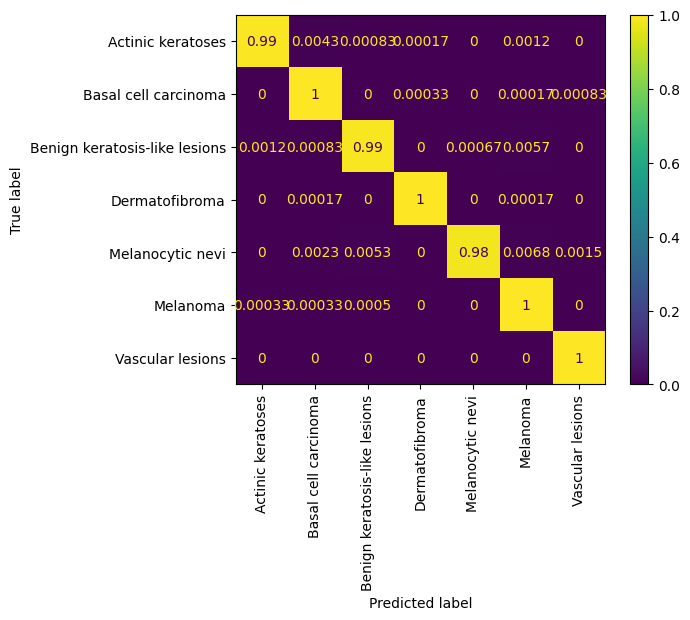

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       1.00      0.99      1.00      6000
         Basal cell carcinoma       0.99      1.00      1.00      6000
Benign keratosis-like lesions       0.99      0.99      0.99      6000
               Dermatofibroma       1.00      1.00      1.00      6000
             Melanocytic nevi       1.00      0.98      0.99      6000
                     Melanoma       0.99      1.00      0.99      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           1.00     42000
                    macro avg       1.00      1.00      1.00     42000
                 weighted avg       1.00      1.00      1.00     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9944
F-beta Score (macro averaging): 0.9952
F-beta Score (weighted averaging): 0.9952


## Tryout_13

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = Dropout(0.9)(last_output)
x = GlobalAveragePooling2D()(x)

In [ ]:
layer_sizes = [128]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.9)(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 80
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                    epochs = epochs,
                    validation_data = val_datagen.flow(X_valid, y_valid),
                    verbose = 1,
                    steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                    validation_steps=(X_valid.shape[0] // batch_size),
                    callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 102s 183ms/step - cat_accuracy: 0.1392 - fbeta_score: 0.1221 - loss: 1.9957 - prc: 0.1422 - precision: 0.1156 - recall: 0.0020 - val_cat_accuracy: 0.0312 - val_fbeta_score: 0.0198 - val_loss: 1.9466 - val_prc: 0.1429 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - cat_accuracy: 0.1875 - fbeta_score: 0.1549 - loss: 1.9461 - prc: 0.1429 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_cat_accuracy: 0.0234 - val_fbeta_score: 0.0153 - val_loss: 1.9467 - val_prc: 0.1429 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - cat_accuracy: 0.1431 - fbeta_score: 0.1141 - loss: 1.9460 - prc: 0.1431 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_cat_accuracy: 0.0781 - val_fbeta_score: 0.0425 - val_loss: 1.9469 - val_prc: 0.1429 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - c

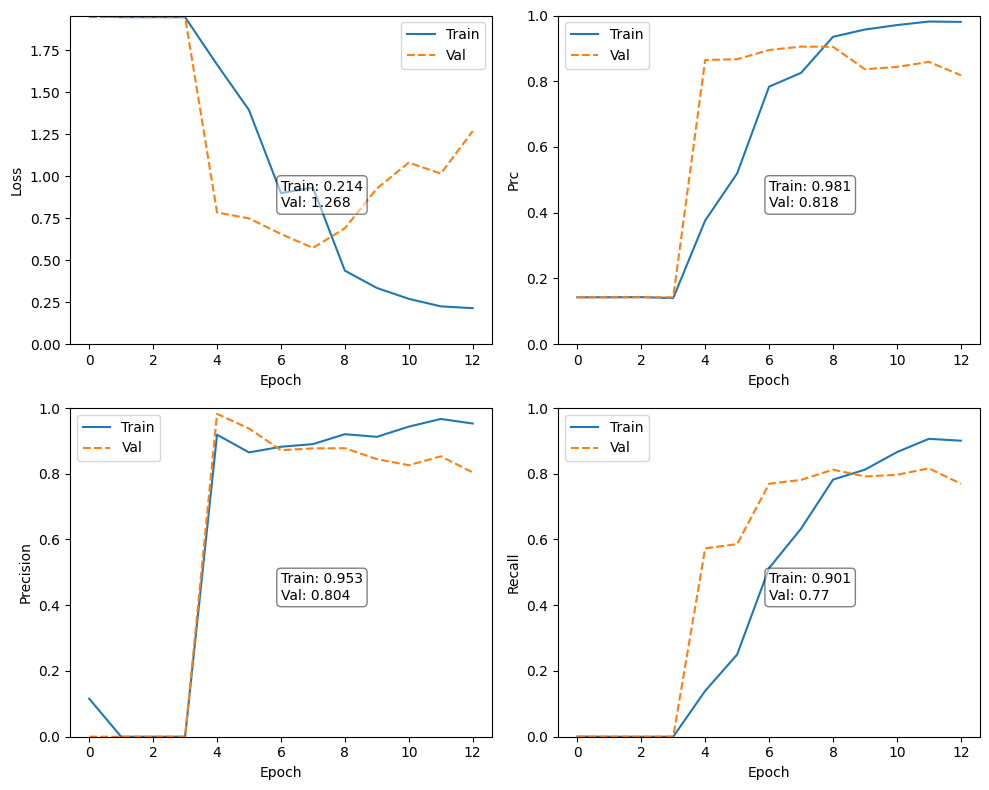

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 334ms/step


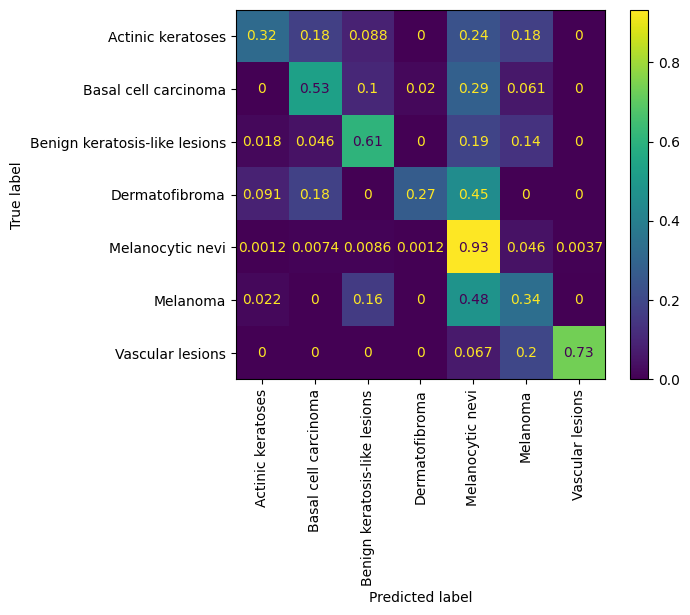

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.65      0.32      0.43        34
         Basal cell carcinoma       0.58      0.53      0.55        49
Benign keratosis-like lesions       0.69      0.61      0.64       109
               Dermatofibroma       0.60      0.27      0.37        11
             Melanocytic nevi       0.89      0.93      0.91       810
                     Melanoma       0.33      0.34      0.33        92
             Vascular lesions       0.79      0.73      0.76        15

                     accuracy                           0.81      1120
                    macro avg       0.64      0.53      0.57      1120
                 weighted avg       0.80      0.81      0.80      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.5561
F-beta Score (macro averaging): 0.5467
F-beta Score (weighted averaging): 0.8032


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step


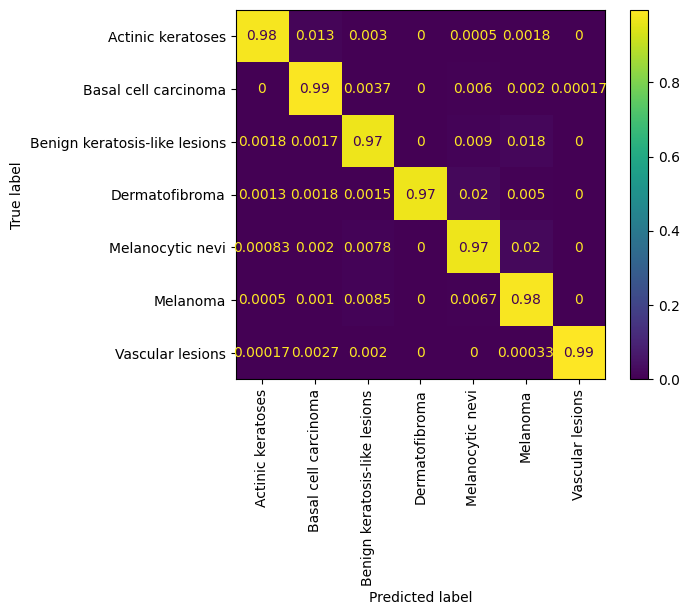

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       1.00      0.98      0.99      6000
         Basal cell carcinoma       0.98      0.99      0.98      6000
Benign keratosis-like lesions       0.97      0.97      0.97      6000
               Dermatofibroma       1.00      0.97      0.99      6000
             Melanocytic nevi       0.96      0.97      0.96      6000
                     Melanoma       0.96      0.98      0.97      6000
             Vascular lesions       1.00      0.99      1.00      6000

                     accuracy                           0.98     42000
                    macro avg       0.98      0.98      0.98     42000
                 weighted avg       0.98      0.98      0.98     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9765
F-beta Score (macro averaging): 0.9798
F-beta Score (weighted averaging): 0.9798


## Tryout_14

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
last_output = last_layer.output

In [ ]:
x = Dropout(0.5)(last_output)
x = GlobalMaxPooling2D()(x)

In [ ]:
layer_sizes = [256, 32, 64]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.6)(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 80
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                    epochs = epochs,
                    validation_data = val_datagen.flow(X_valid, y_valid),
                    verbose = 1,
                    steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                    validation_steps=(X_valid.shape[0] // batch_size),
                    callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/80


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 113s 199ms/step - cat_accuracy: 0.1423 - fbeta_score: 0.1112 - loss: 2.0218 - prc: 0.1427 - precision: 0.1749 - recall: 0.0039 - val_cat_accuracy: 0.0977 - val_fbeta_score: 0.0502 - val_loss: 1.9460 - val_prc: 0.1429 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 2/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 437us/step - cat_accuracy: 0.1406 - fbeta_score: 0.1094 - loss: 1.9459 - prc: 0.1429 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_cat_accuracy: 0.0859 - val_fbeta_score: 0.0457 - val_loss: 1.9461 - val_prc: 0.1429 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 3/80


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 36s 110ms/step - cat_accuracy: 0.1403 - fbeta_score: 0.1332 - loss: 1.9460 - prc: 0.1425 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_cat_accuracy: 0.0234 - val_fbeta_score: 0.0153 - val_loss: 1.9480 - val_prc: 0.1429 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 4/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - cat_accuracy: 0.1328 - fbeta_score: 0.1108 - loss: 1.9466 - prc: 0.1388 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_cat_accuracy: 0.0273 - val_fbeta_score: 0.0176 - val_loss: 1.9479 - val_prc: 0.1429 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 5/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 37s 112ms/step - cat_accuracy: 0.1444 - fbeta_score: 0.1350 - loss: 1.9459 - prc: 0.1431 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_cat_accuracy: 0.0729 - val_fbeta_score: 0.0403 - val_loss: 1.9460 - val_prc: 0.1429 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lea

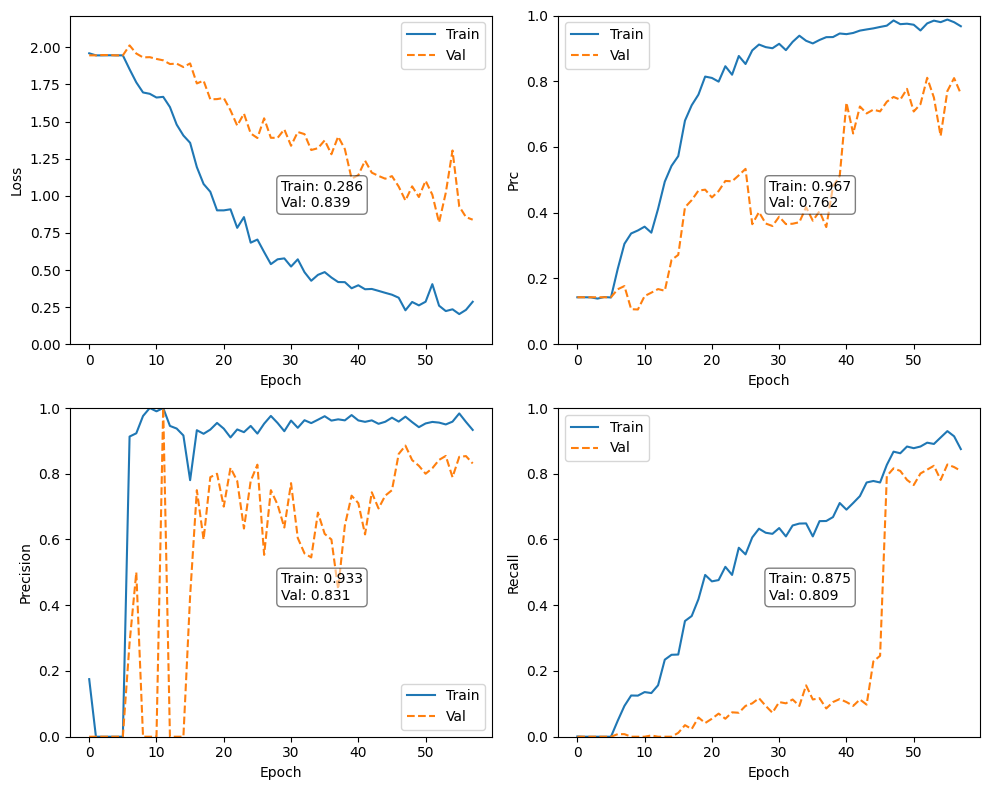

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 381ms/step


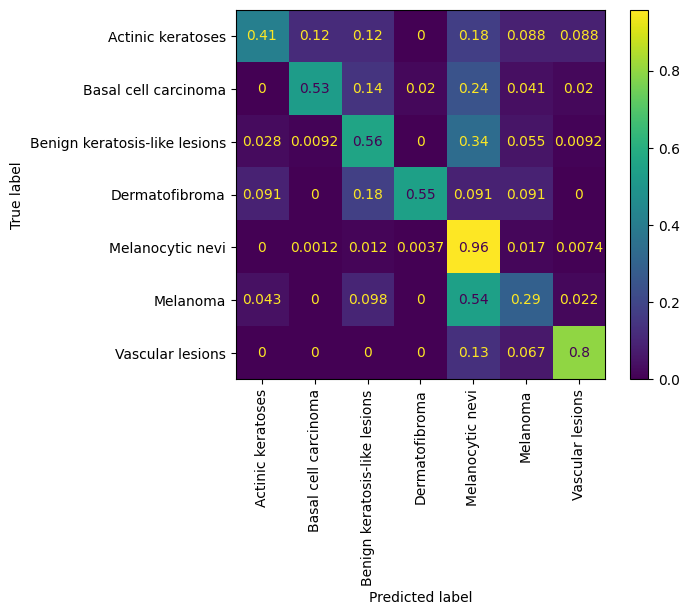

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.64      0.41      0.50        34
         Basal cell carcinoma       0.81      0.53      0.64        49
Benign keratosis-like lesions       0.66      0.56      0.60       109
               Dermatofibroma       0.60      0.55      0.57        11
             Melanocytic nevi       0.88      0.96      0.92       810
                     Melanoma       0.50      0.29      0.37        92
             Vascular lesions       0.48      0.80      0.60        15

                     accuracy                           0.82      1120
                    macro avg       0.65      0.59      0.60      1120
                 weighted avg       0.81      0.82      0.81      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.5818
F-beta Score (macro averaging): 0.5874
F-beta Score (weighted averaging): 0.8161


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


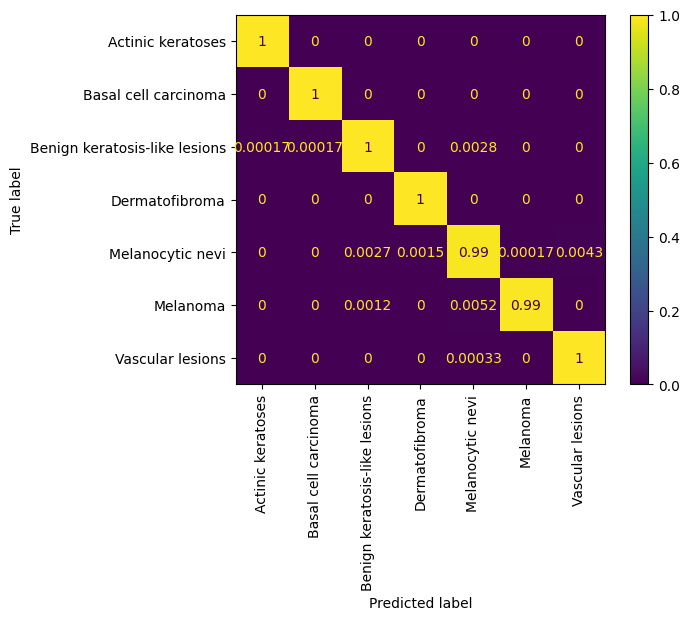

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       1.00      1.00      1.00      6000
         Basal cell carcinoma       1.00      1.00      1.00      6000
Benign keratosis-like lesions       1.00      1.00      1.00      6000
               Dermatofibroma       1.00      1.00      1.00      6000
             Melanocytic nevi       0.99      0.99      0.99      6000
                     Melanoma       1.00      0.99      1.00      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           1.00     42000
                    macro avg       1.00      1.00      1.00     42000
                 weighted avg       1.00      1.00      1.00     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9765
F-beta Score (macro averaging): 0.9798
F-beta Score (weighted averaging): 0.9798



## Tryout_15

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
last_output = last_layer.output

In [ ]:
x = Dropout(0.7)(last_output)
x = GlobalMaxPooling2D()(x)

In [ ]:
layer_sizes = [256, 32, 64]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.7)(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 40
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                    epochs = epochs,
                    validation_data = val_datagen.flow(X_valid, y_valid),
                    verbose = 1,
                    steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                    validation_steps=(X_valid.shape[0] // batch_size),
                    callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/40
328/328 ━━━━━━━━━━━━━━━━━━━━ 115s 196ms/step - cat_accuracy: 0.1419 - fbeta_score: 0.1127 - loss: 2.2437 - prc: 0.1428 - precision: 0.1462 - recall: 0.0092 - val_cat_accuracy: 0.0586 - val_fbeta_score: 0.0397 - val_loss: 1.9460 - val_prc: 0.1429 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 2/40
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 454us/step - cat_accuracy: 0.1797 - fbeta_score: 0.1287 - loss: 1.9455 - prc: 0.1502 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_cat_accuracy: 0.0234 - val_fbeta_score: 0.0153 - val_loss: 1.9460 - val_prc: 0.1429 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 3/40
328/328 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - cat_accuracy: 0.1441 - fbeta_score: 0.1235 - loss: 1.9458 - prc: 0.1435 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_cat_accuracy: 0.0430 - val_fbeta_score: 0.0260 - val_loss: 1.9454 - val_prc: 0.1429 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 -

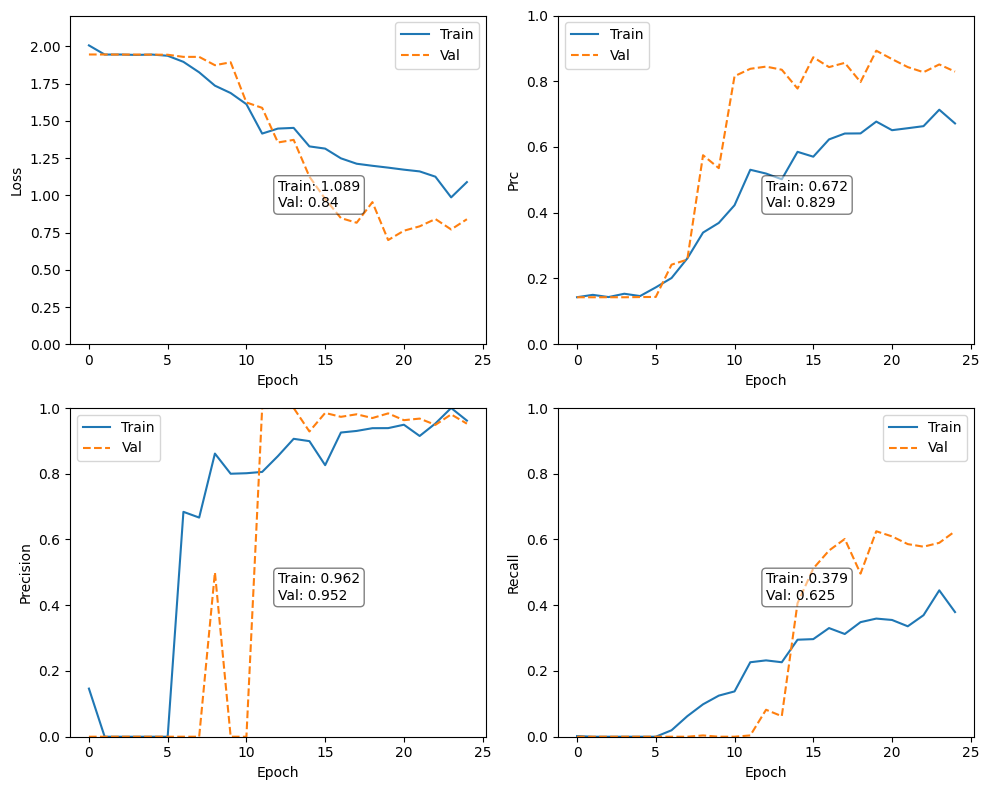

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 349ms/step


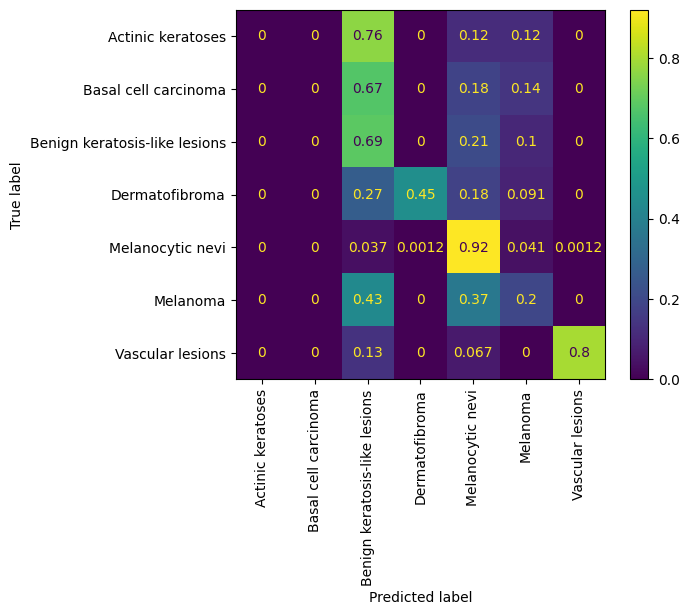

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.00      0.00      0.00        34
         Basal cell carcinoma       0.00      0.00      0.00        49
Benign keratosis-like lesions       0.36      0.69      0.47       109
               Dermatofibroma       0.83      0.45      0.59        11
             Melanocytic nevi       0.91      0.92      0.92       810
                     Melanoma       0.24      0.20      0.22        92
             Vascular lesions       0.92      0.80      0.86        15

                     accuracy                           0.76      1120
                    macro avg       0.47      0.44      0.44      1120
                 weighted avg       0.73      0.76      0.74      1120



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.4781
F-beta Score (macro averaging): 0.4321
F-beta Score (weighted averaging): 0.7531


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step


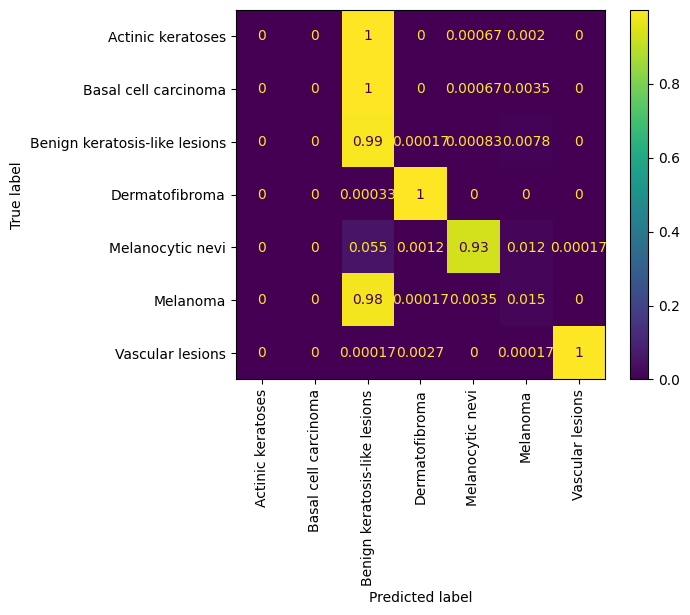

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.00      0.00      0.00      6000
         Basal cell carcinoma       0.00      0.00      0.00      6000
Benign keratosis-like lesions       0.25      0.99      0.39      6000
               Dermatofibroma       1.00      1.00      1.00      6000
             Melanocytic nevi       0.99      0.93      0.96      6000
                     Melanoma       0.37      0.02      0.03      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           0.56     42000
                    macro avg       0.52      0.56      0.48     42000
                 weighted avg       0.52      0.56      0.48     42000



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9765
F-beta Score (macro averaging): 0.9798
F-beta Score (weighted averaging): 0.9798


## Tryout_16

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = True

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
last_output = last_layer.output

In [ ]:
x = Dropout(0.5)(last_output)
x = GlobalMaxPooling2D()(x)

In [ ]:
layer_sizes = [256, 32, 64]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.6)(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
#model.summary()

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 80
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                    epochs = epochs,
                    validation_data = val_datagen.flow(X_valid, y_valid),
                    verbose = 1,
                    steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                    validation_steps=(X_valid.shape[0] // batch_size),
                    callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/80


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 113s 200ms/step - cat_accuracy: 0.1620 - fbeta_score: 0.1471 - loss: 2.0334 - prc: 0.1519 - precision: 0.2077 - recall: 0.0051 - val_cat_accuracy: 0.0391 - val_fbeta_score: 0.0485 - val_loss: 1.9430 - val_prc: 0.1326 - val_precision: 0.5000 - val_recall: 0.0039 - learning_rate: 1.0000e-04
Epoch 2/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 436us/step - cat_accuracy: 0.3750 - fbeta_score: 0.3578 - loss: 1.7828 - prc: 0.3163 - precision: 0.8000 - recall: 0.0938 - val_cat_accuracy: 0.0312 - val_fbeta_score: 0.0599 - val_loss: 1.9333 - val_prc: 0.1361 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 3/80


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 38s 117ms/step - cat_accuracy: 0.3177 - fbeta_score: 0.3045 - loss: 1.7190 - prc: 0.3489 - precision: 0.8472 - recall: 0.0979 - val_cat_accuracy: 0.0742 - val_fbeta_score: 0.2082 - val_loss: 1.8631 - val_prc: 0.3751 - val_precision: 0.5000 - val_recall: 0.0039 - learning_rate: 1.0000e-04
Epoch 4/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - cat_accuracy: 0.4375 - fbeta_score: 0.4127 - loss: 1.4667 - prc: 0.5110 - precision: 0.8846 - recall: 0.1797 - val_cat_accuracy: 0.0469 - val_fbeta_score: 0.1598 - val_loss: 1.8667 - val_prc: 0.3694 - val_precision: 1.0000 - val_recall: 0.0078 - learning_rate: 1.0000e-04
Epoch 5/80
328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 118ms/step - cat_accuracy: 0.3900 - fbeta_score: 0.3823 - loss: 1.5321 - prc: 0.4713 - precision: 0.7835 - recall: 0.1663 - val_cat_accuracy: 0.5625 - val_fbeta_score: 0.1093 - val_loss: 1.8448 - val_prc: 0.3509 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 6/80
328/32

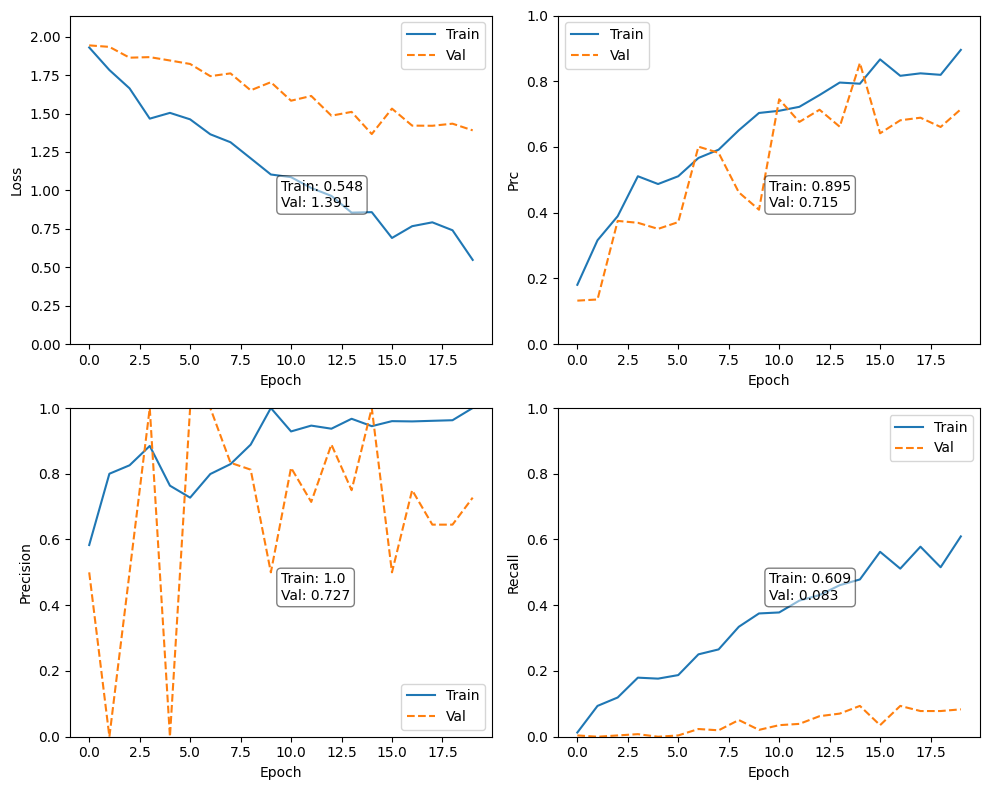

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 346ms/step


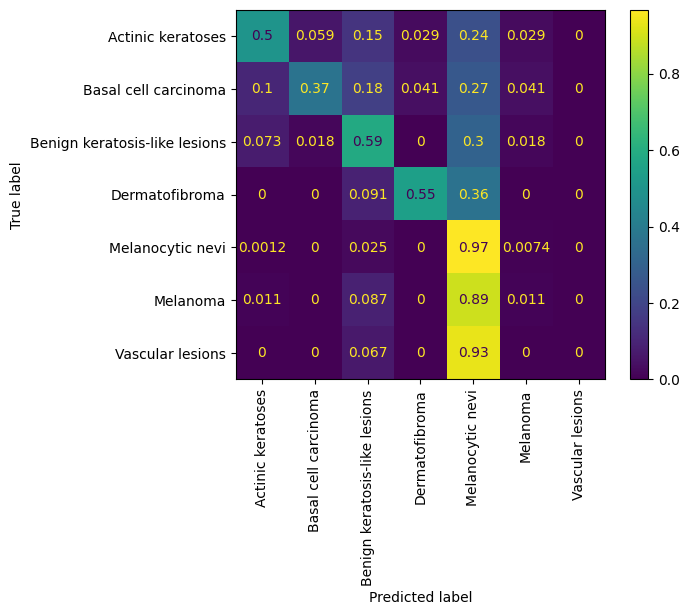

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.53      0.50      0.52        34
         Basal cell carcinoma       0.82      0.37      0.51        49
Benign keratosis-like lesions       0.59      0.59      0.59       109
               Dermatofibroma       0.67      0.55      0.60        11
             Melanocytic nevi       0.84      0.97      0.90       810
                     Melanoma       0.08      0.01      0.02        92
             Vascular lesions       0.00      0.00      0.00        15

                     accuracy                           0.79      1120
                    macro avg       0.50      0.43      0.45      1120
                 weighted avg       0.73      0.79      0.75      1120



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.4854
F-beta Score (macro averaging): 0.4319
F-beta Score (weighted averaging): 0.7752


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


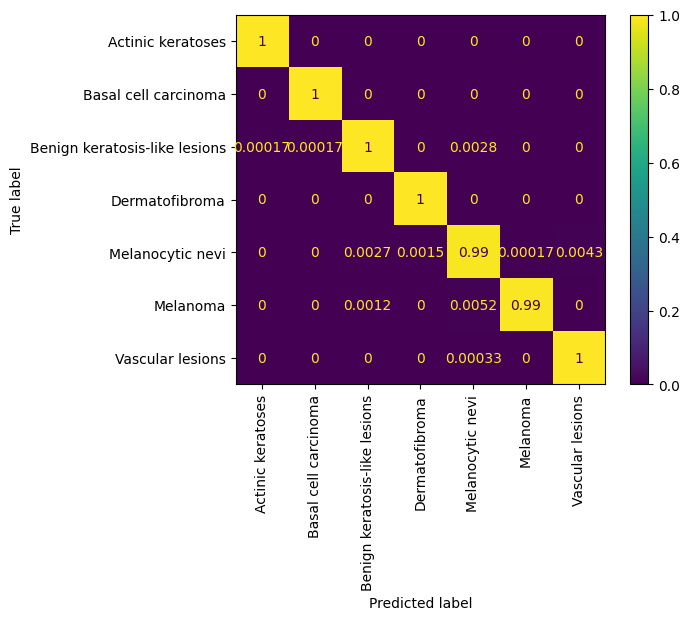

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       1.00      1.00      1.00      6000
         Basal cell carcinoma       1.00      1.00      1.00      6000
Benign keratosis-like lesions       1.00      1.00      1.00      6000
               Dermatofibroma       1.00      1.00      1.00      6000
             Melanocytic nevi       0.99      0.99      0.99      6000
                     Melanoma       1.00      0.99      1.00      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           1.00     42000
                    macro avg       1.00      1.00      1.00     42000
                 weighted avg       1.00      1.00      1.00     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9765
F-beta Score (macro averaging): 0.9798
F-beta Score (weighted averaging): 0.9798


## Hyperband search for transfer learning (tried 18 configurations)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR')
]

In [ ]:
def build_transfer_model(hp):
    base_model = Xception(include_top=False, weights='imagenet', input_shape=(75, 100, 3))

    for layer in base_model.layers:
        layer.trainable = True

    model = Sequential()
    model.add(base_model)

    if hp.Boolean('global_average_pooling'):
        model.add(GlobalAveragePooling2D())
    else:
        model.add(GlobalMaxPooling2D())

    for i in range(hp.Int('n_dense_layers', 1, 3, default=2)):
        model.add(Dense(
            units=hp.Int(f'units_{i}', min_value=32, max_value=512, step=32),
            activation='relu',
            kernel_regularizer=regularizers.l2(hp.Float(f'l2_dense_{i}', min_value=0.0, max_value=0.1, step=0.01))
        ))
        model.add(Dropout(hp.Float(f'dropout_rate_dense_{i}', min_value=0.0, max_value=0.5, step=0.1)))

    model.add(Dense(y_balanced_6000_train.shape[1], activation='softmax'))

    learning_rate = hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='LOG')
    model.compile(
        optimizer=Adam(learning_rate),
        loss='categorical_crossentropy',
        metrics=metrics
    )

    return model

In [ ]:
tuner_tr = keras_tuner.Hyperband(
    build_transfer_model,
    objective='val_recall',
    max_epochs=20,
    factor=3,
    directory='/content/drive/My Drive/HPOs/TL_6000/',
    project_name='transfer_learning_with_xception'
)

Reloading Tuner from /content/drive/My Drive/HPOs/TL_6000/transfer_learning_with_xception/tuner0.json


In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)

In [ ]:
batch_size = 256
epochs = 25

tuner_tr.search(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                epochs=epochs,
                steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                validation_data=val_datagen.flow(X_valid, y_valid),
                validation_steps=(X_valid.shape[0] // batch_size),
                callbacks = [early_stopping_monitor])

Trial 18 Complete [00h 00m 59s]

Best val_recall So Far: 0.90625
Total elapsed time: 00h 45m 28s

Search: Running Trial #19

Value             |Best Value So Far |Hyperparameter
False             |False             |global_average_pooling
2                 |2                 |n_dense_layers
512               |256               |units_0
0                 |0.02              |l2_dense_0
0.4               |0.4               |dropout_rate_dense_0
480               |64                |units_1
0.05              |0.02              |l2_dense_1
0.4               |0.1               |dropout_rate_dense_1
0.00044273        |0.00029765        |learning_rate
352               |192               |units_2
0.03              |0.08              |l2_dense_2
0.3               |0                 |dropout_rate_dense_2
7                 |7                 |tuner/epochs
0                 |3                 |tuner/initial_epoch
1                 |2                 |tuner/bracket
0                 |1             

In [ ]:
best_hps_tr = tuner_tr.get_best_hyperparameters(num_trials=1)[0]

In [ ]:
best_hps_tr = tuner_tr.get_best_hyperparameters()[0]
print(best_hps_tr.values)

{'global_average_pooling': False, 'n_dense_layers': 2, 'units_0': 256, 'l2_dense_0': 0.02, 'dropout_rate_dense_0': 0.4, 'units_1': 64, 'l2_dense_1': 0.02, 'dropout_rate_dense_1': 0.1, 'learning_rate': 0.00029765041890868964, 'units_2': 192, 'l2_dense_2': 0.08, 'dropout_rate_dense_2': 0.0, 'tuner/epochs': 7, 'tuner/initial_epoch': 3, 'tuner/bracket': 2, 'tuner/round': 1, 'tuner/trial_id': '0005'}


In [ ]:
# we saved our model to have it available to load
best_model_tr = tuner_tr.get_best_models()[0]
#best_model_tr.save('best_model_trl_hpo.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:415: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 322 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
best_model_tr = keras.models.load_model('best_model_trl_hpo.keras')

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:396: UserWarning: Skipping variable loading for optimizer 'adam', because it has 18 variables whereas the saved optimizer has 2 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


In [ ]:
best_model_tr.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ xception (Functional)                │ (None, 3, 3, 2048)          │      20,861,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d                 │ (None, 2048)                │               0 │
│ (GlobalMaxPooling2D)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │          16,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 7)                   │             455 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,402,927 (81.65 MB)

 Trainable params: 21,348,399 (81.44 MB)

 Non-trainable params: 54,528 (213.00 KB)

In [ ]:
batch_size = 128
epochs = 50

In [ ]:
model_tr_best_build = tuner_tr.hypermodel.build(best_hps_tr)
history_tr = model_tr_best_build.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                    epochs=epochs,
                    steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                    validation_data=val_datagen.flow(X_valid, y_valid),
                    validation_steps=(X_valid.shape[0] // batch_size),
                    callbacks = [early_stopping_monitor])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 136s 222ms/step - cat_accuracy: 0.6483 - fbeta_score: 0.6438 - loss: 7.0636 - prc: 0.7326 - precision: 0.8051 - recall: 0.5176 - val_cat_accuracy: 0.7773 - val_fbeta_score: 0.6567 - val_loss: 1.4111 - val_prc: 0.8341 - val_precision: 0.7840 - val_recall: 0.7656
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step - cat_accuracy: 0.9141 - fbeta_score: 0.9190 - loss: 0.8892 - prc: 0.9770 - precision: 0.9360 - recall: 0.9141 - val_cat_accuracy: 0.7773 - val_fbeta_score: 0.6987 - val_loss: 1.4074 - val_prc: 0.8555 - val_precision: 0.7769 - val_recall: 0.7617
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 117ms/step - cat_accuracy: 0.9680 - fbeta_score: 0.9678 - loss: 0.5498 - prc: 0.9932 - precision: 0.9725 - recall: 0.9632 - val_cat_accuracy: 0.8008 - val_fbeta_score: 0.4576 - val_loss: 1.1228 - val_prc: 0.8355 - val_precision: 0.8135 - val_recall: 0.8008
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - cat_accuracy: 0.9531 - fbeta_score: 0.9567 - loss: 0.2667 - prc: 0.9920 - precision: 0.9603 - recall: 0.9453 - val_cat_accuracy: 0.8398 - val_fbeta_score: 0.6127 - val_loss: 0.8890 - val_prc: 0.8844 - val_precision: 0.8458 - val_recall: 0.8359
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - cat_accuracy: 0.9836 - fbeta_score: 0.9837 - loss: 0.1803 - prc: 0.9970 - precision: 0.9858 - recall: 0.9812 - val_cat_accuracy: 0.8542 - val_fbeta_score: 0.3583 - val_loss: 0.7606 - val_prc: 0.8898 - val_precision: 0.8710 - val_recall: 0.8438
Epoch 6/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 447us/step - cat_accuracy: 0.9766 - fbeta_score: 0.9784 - loss: 0.

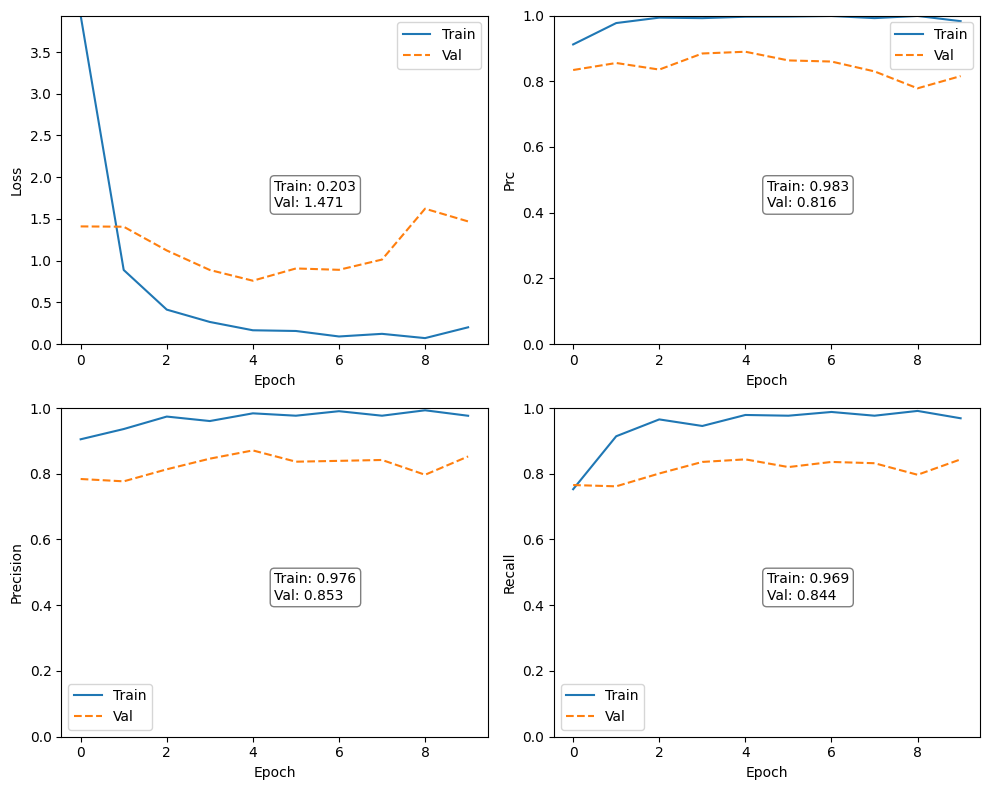

In [ ]:
plot_metrics(history_tr)

In [ ]:
#model_best_build.save('tr_model_best_build.keras')

In [ ]:
#model_best_build.save("tr_model_best_build.h5")

In [ ]:
model_best_build_preds = model_tr_best_build.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step


In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

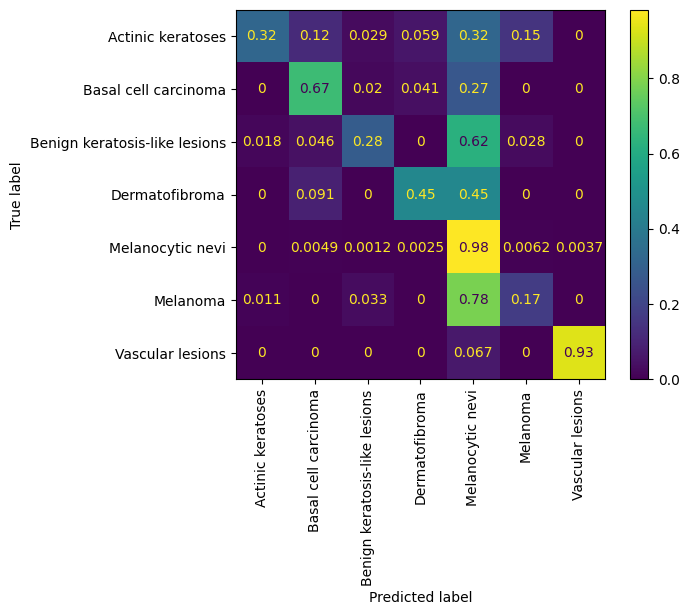

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_best_build_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_best_build_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.79      0.32      0.46        34
         Basal cell carcinoma       0.70      0.67      0.69        49
Benign keratosis-like lesions       0.84      0.28      0.42       109
               Dermatofibroma       0.45      0.45      0.45        11
             Melanocytic nevi       0.82      0.98      0.90       810
                     Melanoma       0.55      0.17      0.26        92
             Vascular lesions       0.82      0.93      0.87        15

                     accuracy                           0.81      1120
                    macro avg       0.71      0.55      0.58      1120
                 weighted avg       0.79      0.81      0.77      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_best_build_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.5197
F-beta Score (macro averaging): 0.5548
F-beta Score (weighted averaging): 0.7896


In [ ]:
model_train_preds_bal = model_tr_best_build.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step


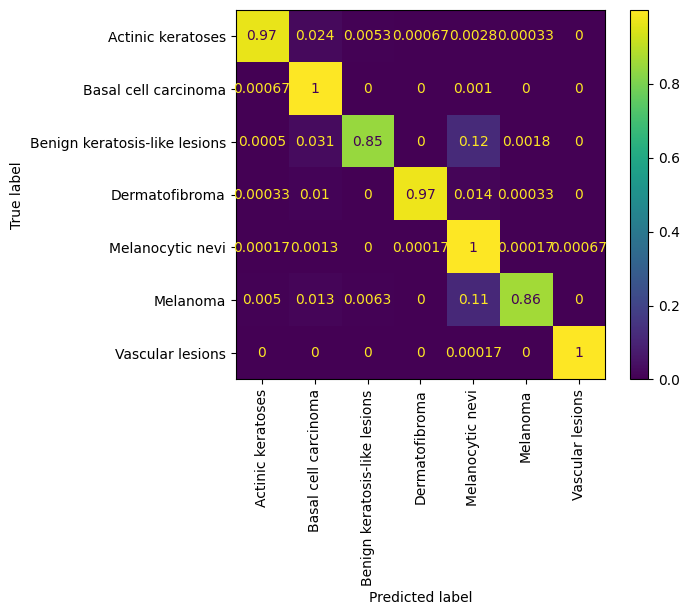

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds_bal.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds_bal.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.99      0.97      0.98      6000
         Basal cell carcinoma       0.93      1.00      0.96      6000
Benign keratosis-like lesions       0.99      0.85      0.91      6000
               Dermatofibroma       1.00      0.97      0.99      6000
             Melanocytic nevi       0.80      1.00      0.89      6000
                     Melanoma       1.00      0.86      0.92      6000
             Vascular lesions       1.00      1.00      1.00      6000

                     accuracy                           0.95     42000
                    macro avg       0.96      0.95      0.95     42000
                 weighted avg       0.96      0.95      0.95     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds_bal.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.9421
F-beta Score (macro averaging): 0.9488
F-beta Score (weighted averaging): 0.9488


# Freeze tryouts


## Tryout_1

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = Dropout(0.7)(last_output)
x = GlobalAveragePooling2D()(x)

In [ ]:
layer_sizes = [256, 64, 32]
for size in layer_sizes:
    x = Dense(size)(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - cat_accuracy: 0.2086 - fbeta_score: 0.1966 - loss: 2.0581 - prc: 0.1929 - precision: 0.2907 - recall: 0.0240 - val_cat_accuracy: 0.4102 - val_fbeta_score: 0.1777 - val_loss: 1.5095 - val_prc: 0.4941 - val_precision: 0.9545 - val_recall: 0.0820 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - cat_accuracy: 0.3359 - fbeta_score: 0.3245 - loss: 1.7163 - prc: 0.2946 - precision: 0.4444 - recall: 0.0312 - val_cat_accuracy: 0.4492 - val_fbeta_score: 0.2405 - val_loss: 1.5279 - val_prc: 0.4795 - val_precision: 0.8500 - val_recall: 0.0664 - learning_rate: 1.0000e-04
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - cat_accuracy: 0.3915 - fbeta_score: 0.3878 - loss: 1.6176 - prc: 0.4080 - precision: 0.7336 - recall: 0.1064 - val_cat_accuracy: 0.4922 - val_fbeta_score: 0.2637 - val_loss: 1.3814 - val_prc: 0.5467 - val_precision: 0.8431 - val_recall: 0.1680 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - cat_accuracy: 0.4062 - fbeta_score: 0.3861 - loss: 1.5516 - prc: 0.4343 - precision: 0.6800 - recall: 0.1328 - val_cat_accuracy: 0.5703 - val_fbeta_score: 0.3254 - val_loss: 1.2844 - val_prc: 0.6349 - val_precision: 0.8831 - val_recall: 0.2656 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - cat_accuracy: 0.4664 - fbeta_score: 0.4637 - loss: 1.4555 - prc: 0.5045 - precision: 0.7801 - recall: 0.1802 - val_cat_accuracy: 0.6146 - val_fbeta_score: 0.2978 - val_loss: 1.0905 - val_prc: 0.7261 - val_precision: 0.8182 - val_recall: 0.3750 - learning_rate: 1.0000e-04
Epoch 6/50
328/328 ━━━━━━━━

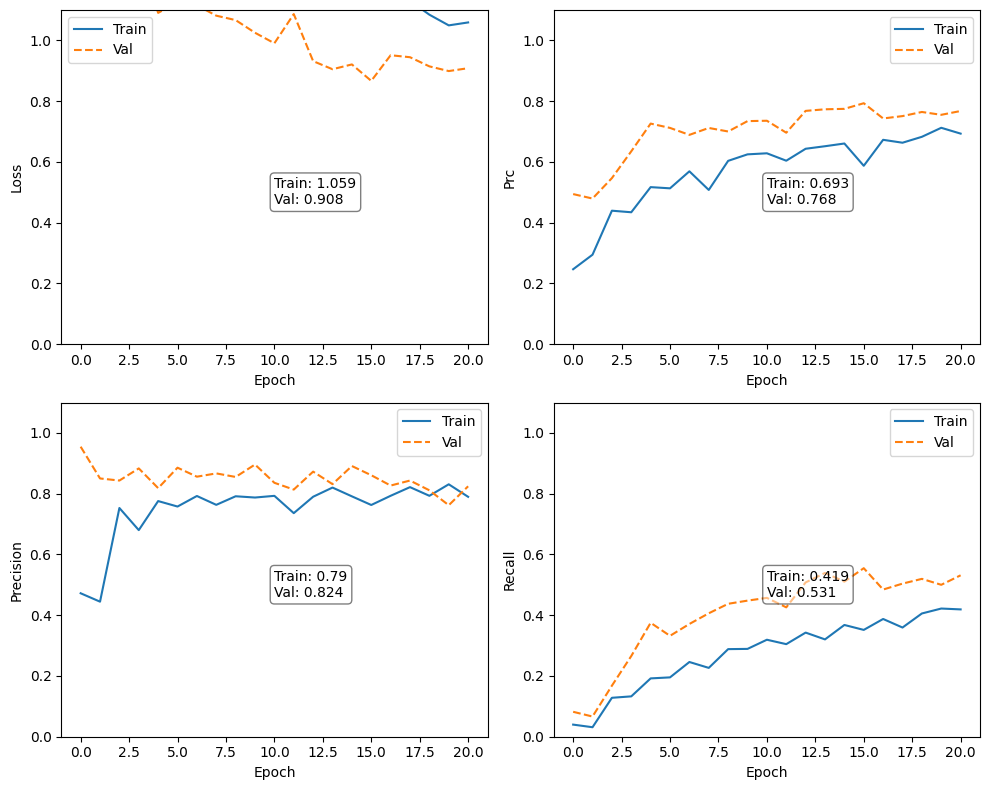

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


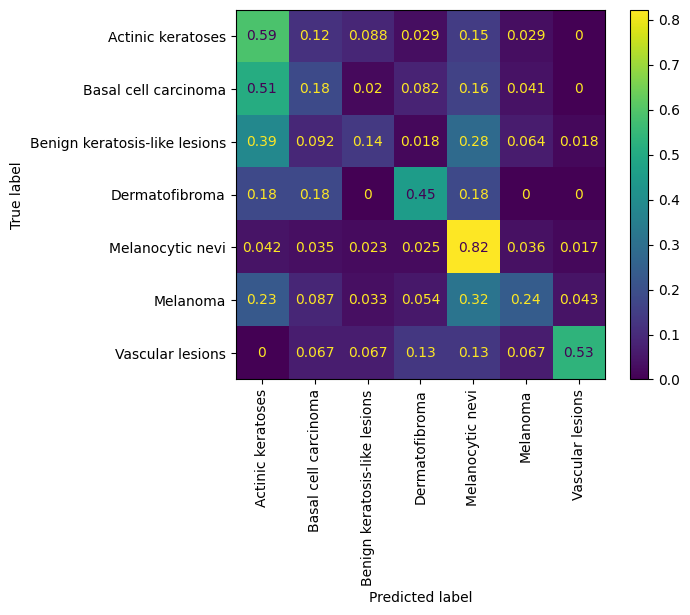

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.14      0.59      0.22        34
         Basal cell carcinoma       0.15      0.18      0.16        49
Benign keratosis-like lesions       0.36      0.14      0.20       109
               Dermatofibroma       0.13      0.45      0.20        11
             Melanocytic nevi       0.90      0.82      0.86       810
                     Melanoma       0.35      0.24      0.29        92
             Vascular lesions       0.29      0.53      0.37        15

                     accuracy                           0.67      1120
                    macro avg       0.33      0.42      0.33      1120
                 weighted avg       0.73      0.67      0.68      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.3443
F-beta Score (macro averaging): 0.3623
F-beta Score (weighted averaging): 0.6684


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step


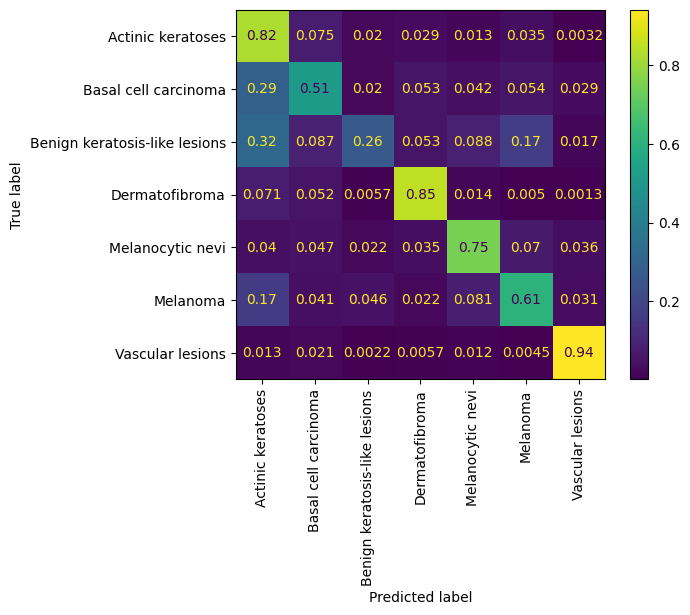

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.48      0.82      0.60      6000
         Basal cell carcinoma       0.61      0.51      0.56      6000
Benign keratosis-like lesions       0.69      0.26      0.38      6000
               Dermatofibroma       0.81      0.85      0.83      6000
             Melanocytic nevi       0.75      0.75      0.75      6000
                     Melanoma       0.64      0.61      0.62      6000
             Vascular lesions       0.89      0.94      0.91      6000

                     accuracy                           0.68     42000
                    macro avg       0.70      0.68      0.67     42000
                 weighted avg       0.70      0.68      0.67     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.6323
F-beta Score (macro averaging): 0.6696
F-beta Score (weighted averaging): 0.6696



## Tryout_2

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
print(last_layer)
last_output = last_layer.output
print('Last layer output shape:', last_output.shape)

<Activation name=block14_sepconv2_act, built=True>
Last layer output shape: (None, 3, 3, 2048)


In [ ]:
x = GlobalAveragePooling2D()(last_output)

In [ ]:
layer_sizes = [256, 64, 32]
for size in layer_sizes:
    x = Dense(size)(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=5)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - cat_accuracy: 0.2335 - fbeta_score: 0.2270 - loss: 1.9412 - prc: 0.2178 - precision: 0.3519 - recall: 0.0348 - val_cat_accuracy: 0.4922 - val_fbeta_score: 0.2450 - val_loss: 1.3698 - val_prc: 0.5952 - val_precision: 0.9273 - val_recall: 0.1992 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - cat_accuracy: 0.5000 - fbeta_score: 0.4981 - loss: 1.5085 - prc: 0.4871 - precision: 0.7778 - recall: 0.1094 - val_cat_accuracy: 0.4922 - val_fbeta_score: 0.1744 - val_loss: 1.3769 - val_prc: 0.5879 - val_precision: 0.8431 - val_recall: 0.1680 - learning_rate: 1.0000e-04
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.4278 - fbeta_score: 0.4267 - loss: 1.5241 - prc: 0.4434 - precision: 0.7242 - recall: 0.1305 - val_cat_accuracy: 0.6094 - val_fbeta_score: 0.3379 - val_loss: 1.1436 - val_prc: 0.6993 - val_precision: 0.8958 - val_recall: 0.3359 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - cat_accuracy: 0.4766 - fbeta_score: 0.4477 - loss: 1.4430 - prc: 0.5041 - precision: 0.7273 - recall: 0.1875 - val_cat_accuracy: 0.5977 - val_fbeta_score: 0.3806 - val_loss: 1.1801 - val_prc: 0.6796 - val_precision: 0.8791 - val_recall: 0.3125 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - cat_accuracy: 0.5020 - fbeta_score: 0.4992 - loss: 1.3654 - prc: 0.5482 - precision: 0.7877 - recall: 0.2220 - val_cat_accuracy: 0.6979 - val_fbeta_score: 0.2340 - val_loss: 0.8645 - val_prc: 0.8376 - val_precision: 0.9592 - val_recall: 0.4896 - learning_rate: 1.0000e-04
Epoch 6/50
328/328 ━━━━━━━━

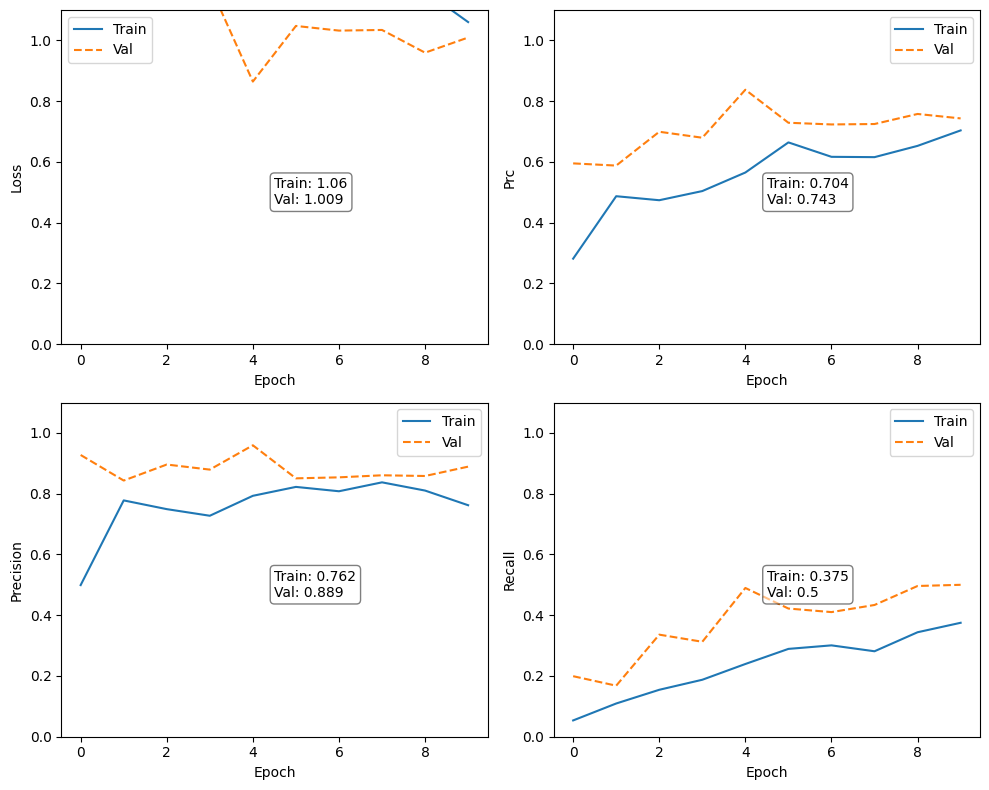

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 381ms/step


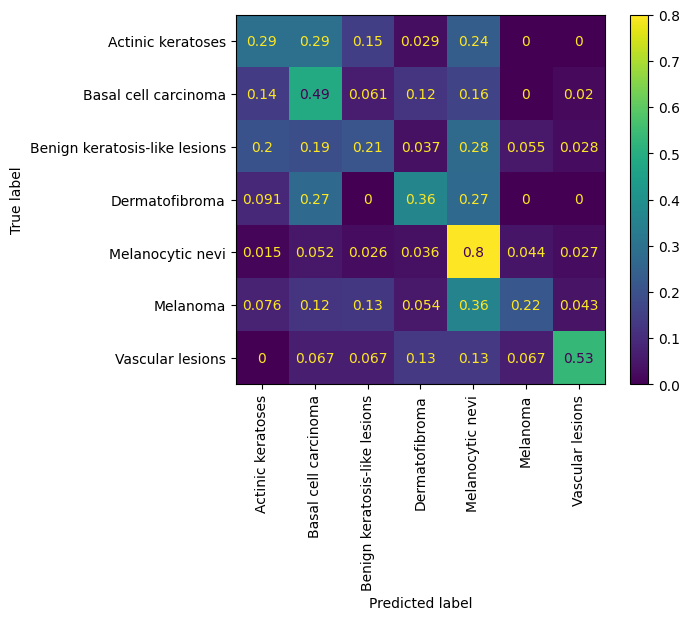

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.17      0.29      0.22        34
         Basal cell carcinoma       0.21      0.49      0.30        49
Benign keratosis-like lesions       0.35      0.21      0.26       109
               Dermatofibroma       0.08      0.36      0.13        11
             Melanocytic nevi       0.89      0.80      0.84       810
                     Melanoma       0.32      0.22      0.26        92
             Vascular lesions       0.21      0.53      0.30        15

                     accuracy                           0.66      1120
                    macro avg       0.32      0.42      0.33      1120
                 weighted avg       0.72      0.66      0.68      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.3352
F-beta Score (macro averaging): 0.3631
F-beta Score (weighted averaging): 0.6637


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step


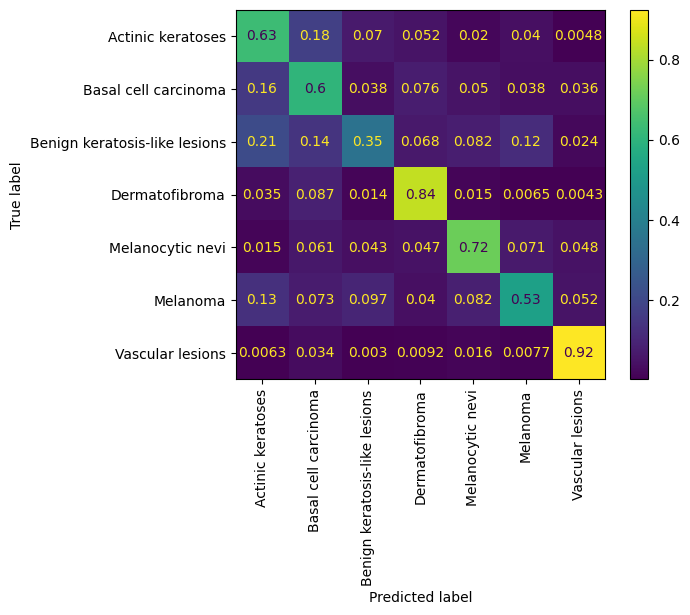

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.53      0.63      0.58      6000
         Basal cell carcinoma       0.51      0.60      0.55      6000
Benign keratosis-like lesions       0.57      0.35      0.43      6000
               Dermatofibroma       0.74      0.84      0.79      6000
             Melanocytic nevi       0.73      0.72      0.72      6000
                     Melanoma       0.65      0.53      0.58      6000
             Vascular lesions       0.84      0.92      0.88      6000

                     accuracy                           0.66     42000
                    macro avg       0.65      0.66      0.65     42000
                 weighted avg       0.65      0.66      0.65     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.6006
F-beta Score (macro averaging): 0.6516
F-beta Score (weighted averaging): 0.6516


## Tryout_3

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
last_output = last_layer.output

In [ ]:
x = GlobalMaxPooling2D()(last_output)

In [ ]:
layer_sizes = [256, 32, 64]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization()(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - cat_accuracy: 0.2434 - fbeta_score: 0.2411 - loss: 2.1301 - prc: 0.2179 - precision: 0.3073 - recall: 0.0778 - val_cat_accuracy: 0.5469 - val_fbeta_score: 0.2151 - val_loss: 1.2789 - val_prc: 0.6553 - val_precision: 0.8831 - val_recall: 0.2656 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - cat_accuracy: 0.4531 - fbeta_score: 0.4376 - loss: 1.5833 - prc: 0.4567 - precision: 0.5366 - recall: 0.1719 - val_cat_accuracy: 0.5703 - val_fbeta_score: 0.2630 - val_loss: 1.2632 - val_prc: 0.6538 - val_precision: 0.8974 - val_recall: 0.2734 - learning_rate: 1.0000e-04
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.4072 - fbeta_score: 0.3991 - loss: 1.6438 - prc: 0.4078 - precision: 0.5977 - recall: 0.1968 - val_cat_accuracy: 0.6367 - val_fbeta_score: 0.3531 - val_loss: 1.0657 - val_prc: 0.7264 - val_precision: 0.8880 - val_recall: 0.4336 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step - cat_accuracy: 0.3906 - fbeta_score: 0.3925 - loss: 1.5428 - prc: 0.4414 - precision: 0.5870 - recall: 0.2109 - val_cat_accuracy: 0.6094 - val_fbeta_score: 0.2237 - val_loss: 1.0948 - val_prc: 0.7102 - val_precision: 0.8788 - val_recall: 0.4531 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.4666 - fbeta_score: 0.4592 - loss: 1.4560 - prc: 0.5039 - precision: 0.6748 - recall: 0.2657 - val_cat_accuracy: 0.6875 - val_fbeta_score: 0.3336 - val_loss: 0.9713 - val_prc: 0.7532 - val_precision: 0.8448 - val_recall: 0.5104 - learning_rate: 1.0000e-04
Epoch 6/50
328/328 ━━━━━━━━

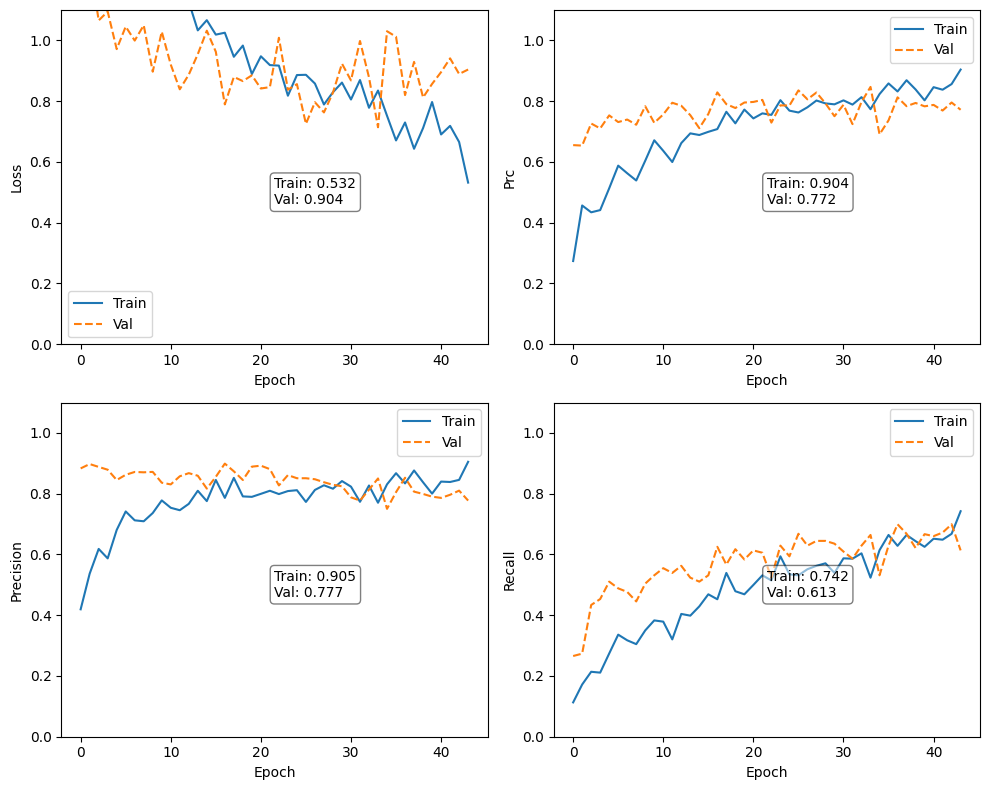

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 404ms/step


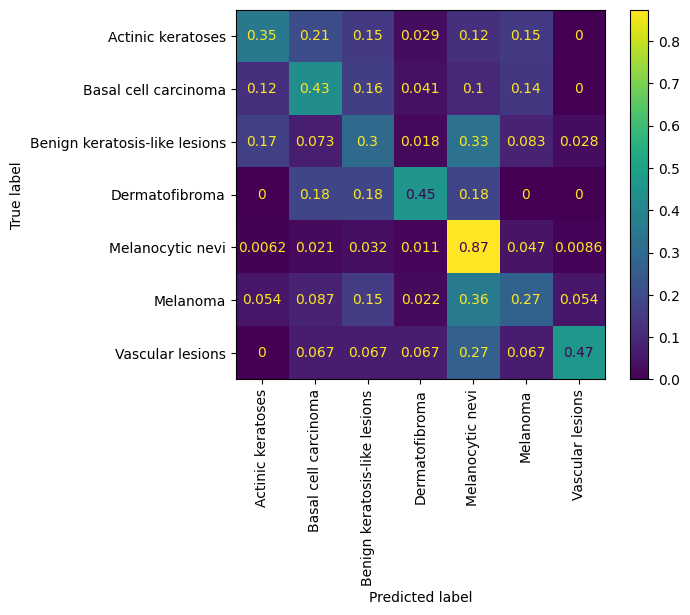

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.26      0.35      0.30        34
         Basal cell carcinoma       0.33      0.43      0.37        49
Benign keratosis-like lesions       0.37      0.30      0.33       109
               Dermatofibroma       0.23      0.45      0.30        11
             Melanocytic nevi       0.89      0.87      0.88       810
                     Melanoma       0.29      0.27      0.28        92
             Vascular lesions       0.32      0.47      0.38        15

                     accuracy                           0.72      1120
                    macro avg       0.38      0.45      0.41      1120
                 weighted avg       0.74      0.72      0.73      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.4141
F-beta Score (macro averaging): 0.4296
F-beta Score (weighted averaging): 0.7253


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step


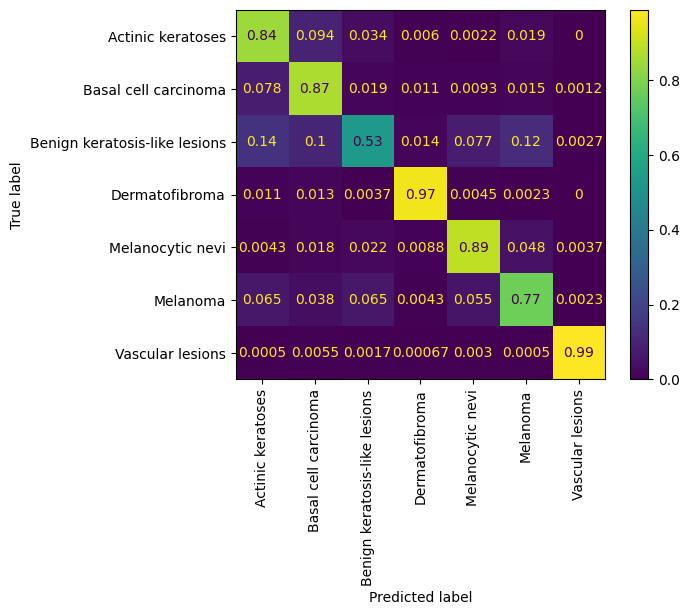

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.74      0.84      0.79      6000
         Basal cell carcinoma       0.76      0.87      0.81      6000
Benign keratosis-like lesions       0.79      0.53      0.64      6000
               Dermatofibroma       0.96      0.97      0.96      6000
             Melanocytic nevi       0.86      0.89      0.87      6000
                     Melanoma       0.79      0.77      0.78      6000
             Vascular lesions       0.99      0.99      0.99      6000

                     accuracy                           0.84     42000
                    macro avg       0.84      0.84      0.83     42000
                 weighted avg       0.84      0.84      0.83     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.8121
F-beta Score (macro averaging): 0.8352
F-beta Score (weighted averaging): 0.8352


## Tryout_4

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
last_output = last_layer.output

In [ ]:
x = GlobalMaxPooling2D()(last_output)

In [ ]:
layer_sizes = [128, 32, 64, 128]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.25)(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - cat_accuracy: 0.2051 - fbeta_score: 0.1991 - loss: 1.9117 - prc: 0.1959 - precision: 0.4123 - recall: 0.0073 - val_cat_accuracy: 0.6562 - val_fbeta_score: 0.2398 - val_loss: 1.2372 - val_prc: 0.7066 - val_precision: 0.9375 - val_recall: 0.2930 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - cat_accuracy: 0.3750 - fbeta_score: 0.3551 - loss: 1.6765 - prc: 0.3391 - precision: 0.4545 - recall: 0.0781 - val_cat_accuracy: 0.5977 - val_fbeta_score: 0.1853 - val_loss: 1.2957 - val_prc: 0.6676 - val_precision: 0.8889 - val_recall: 0.2500 - learning_rate: 1.0000e-04
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.4047 - fbeta_score: 0.3968 - loss: 1.5850 - prc: 0.4119 - precision: 0.6845 - recall: 0.1185 - val_cat_accuracy: 0.6523 - val_fbeta_score: 0.4000 - val_loss: 1.0927 - val_prc: 0.7343 - val_precision: 0.8829 - val_recall: 0.3828 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 370us/step - cat_accuracy: 0.5234 - fbeta_score: 0.4969 - loss: 1.3271 - prc: 0.5591 - precision: 0.7941 - recall: 0.2109 - val_cat_accuracy: 0.6250 - val_fbeta_score: 0.2650 - val_loss: 1.1172 - val_prc: 0.7185 - val_precision: 0.9052 - val_recall: 0.4102 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.4810 - fbeta_score: 0.4752 - loss: 1.3841 - prc: 0.5283 - precision: 0.7441 - recall: 0.2275 - val_cat_accuracy: 0.6354 - val_fbeta_score: 0.2104 - val_loss: 0.9344 - val_prc: 0.7845 - val_precision: 0.8846 - val_recall: 0.4792 - learning_rate: 1.0000e-04
Epoch 6/50
328/328 ━━━━━━━━

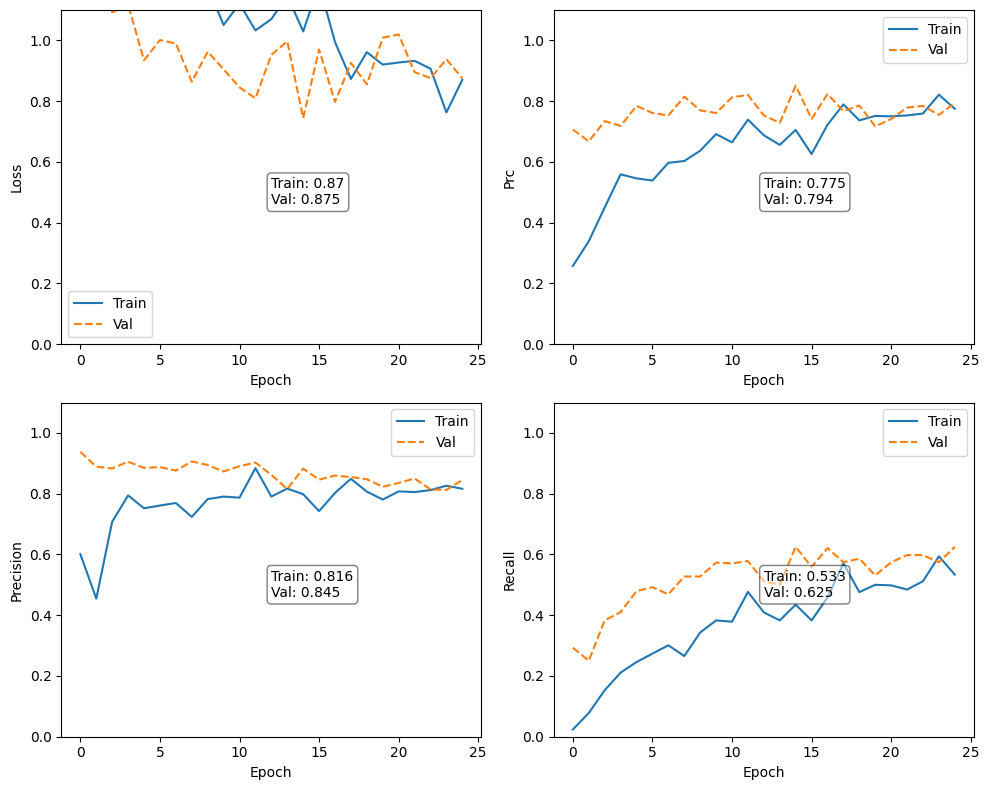

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 392ms/step


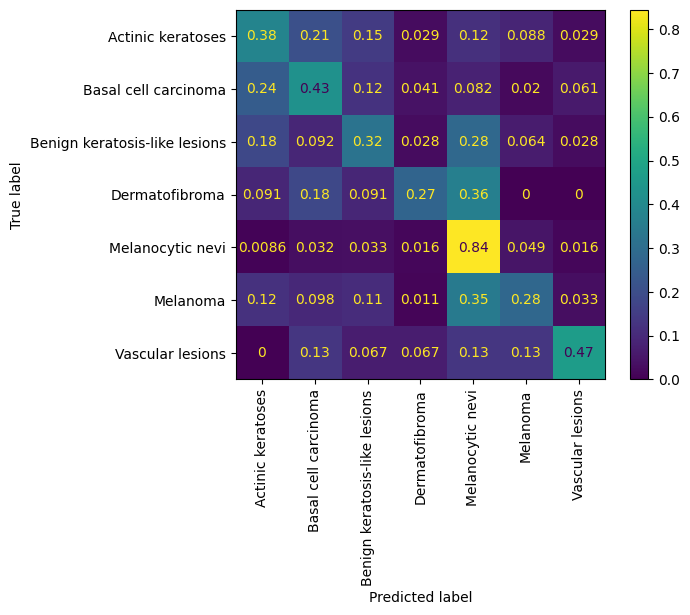

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.20      0.38      0.27        34
         Basal cell carcinoma       0.27      0.43      0.33        49
Benign keratosis-like lesions       0.41      0.32      0.36       109
               Dermatofibroma       0.12      0.27      0.17        11
             Melanocytic nevi       0.90      0.84      0.87       810
                     Melanoma       0.33      0.28      0.30        92
             Vascular lesions       0.23      0.47      0.31        15

                     accuracy                           0.70      1120
                    macro avg       0.35      0.43      0.37      1120
                 weighted avg       0.74      0.70      0.72      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.3995
F-beta Score (macro averaging): 0.4001
F-beta Score (weighted averaging): 0.7088


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step


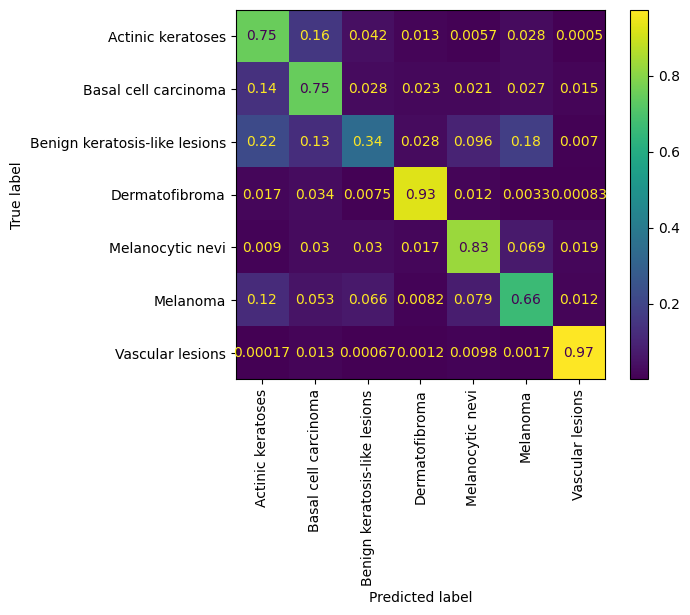

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.60      0.75      0.67      6000
         Basal cell carcinoma       0.64      0.75      0.69      6000
Benign keratosis-like lesions       0.66      0.34      0.45      6000
               Dermatofibroma       0.91      0.93      0.92      6000
             Melanocytic nevi       0.79      0.83      0.81      6000
                     Melanoma       0.68      0.66      0.67      6000
             Vascular lesions       0.95      0.97      0.96      6000

                     accuracy                           0.75     42000
                    macro avg       0.75      0.75      0.74     42000
                 weighted avg       0.75      0.75      0.74     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.7077
F-beta Score (macro averaging): 0.7418
F-beta Score (weighted averaging): 0.7418


## Tryout_5

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
last_output = last_layer.output

In [ ]:
x = GlobalMaxPooling2D()(last_output)

In [ ]:
layer_sizes = [128, 32, 64]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.5)(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - cat_accuracy: 0.1518 - fbeta_score: 0.1421 - loss: 2.0207 - prc: 0.1506 - precision: 0.1399 - recall: 0.0031 - val_cat_accuracy: 0.4414 - val_fbeta_score: 0.1240 - val_loss: 1.8021 - val_prc: 0.4215 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - cat_accuracy: 0.2578 - fbeta_score: 0.2385 - loss: 1.8797 - prc: 0.2176 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_cat_accuracy: 0.4375 - val_fbeta_score: 0.1545 - val_loss: 1.7985 - val_prc: 0.4311 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.2218 - fbeta_score: 0.2147 - loss: 1.8781 - prc: 0.2191 - precision: 0.6383 - recall: 0.0119 - val_cat_accuracy: 0.4727 - val_fbeta_score: 0.1903 - val_loss: 1.6248 - val_prc: 0.5041 - val_precision: 1.0000 - val_recall: 0.0195 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - cat_accuracy: 0.2266 - fbeta_score: 0.2232 - loss: 1.8606 - prc: 0.2372 - precision: 0.7143 - recall: 0.0391 - val_cat_accuracy: 0.4805 - val_fbeta_score: 0.2040 - val_loss: 1.6172 - val_prc: 0.5065 - val_precision: 1.0000 - val_recall: 0.0156 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.2881 - fbeta_score: 0.2809 - loss: 1.7888 - prc: 0.2908 - precision: 0.6488 - recall: 0.0422 - val_cat_accuracy: 0.5729 - val_fbeta_score: 0.2444 - val_loss: 1.4362 - val_prc: 0.5895 - val_precision: 0.9167 - val_recall: 0.1146 - learning_rate: 1.0000e-04
Epoch 6/50
328/328 ━━━━━━━━

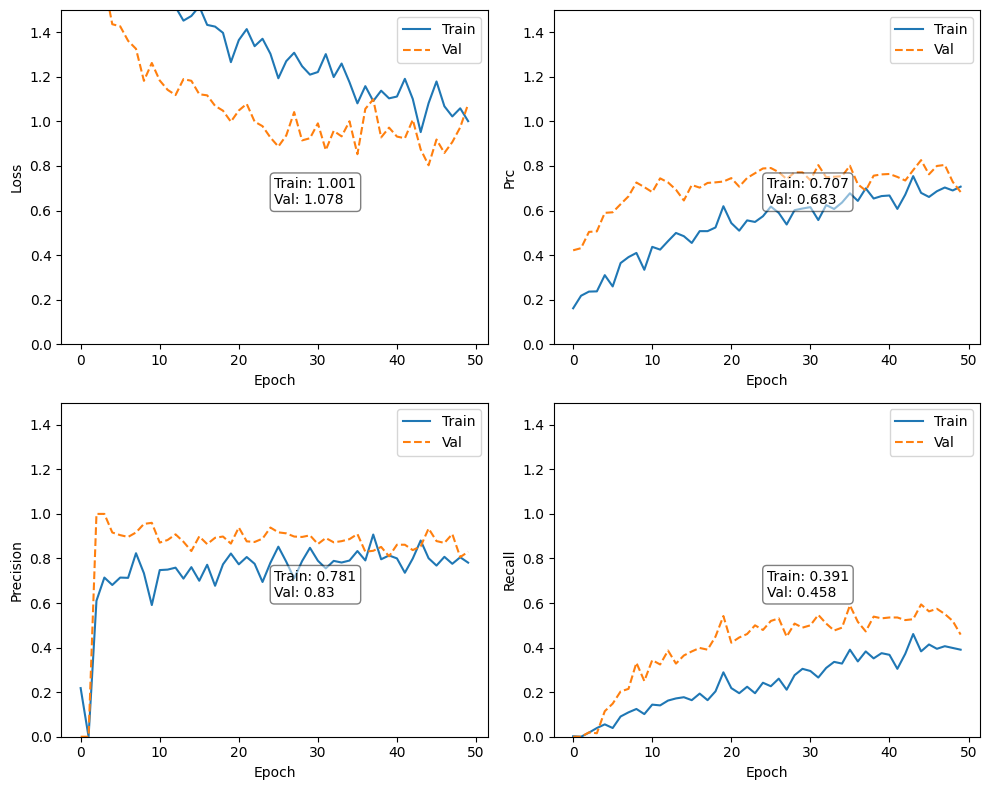

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 384ms/step


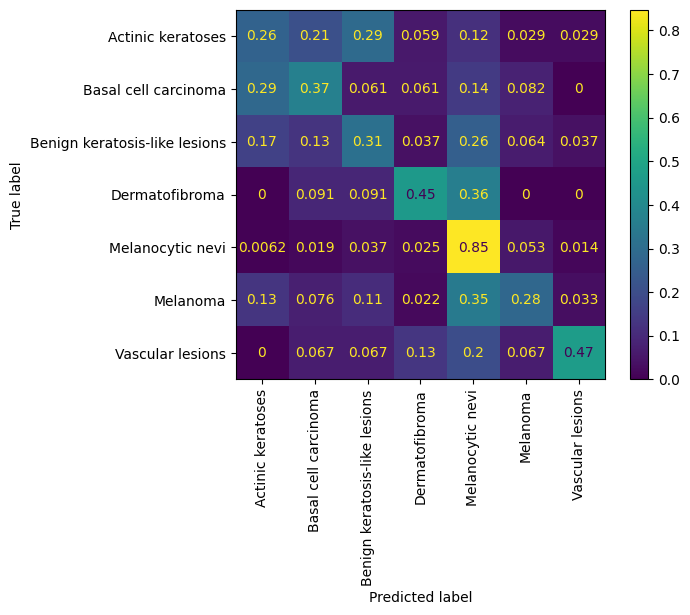

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.16      0.26      0.20        34
         Basal cell carcinoma       0.29      0.37      0.32        49
Benign keratosis-like lesions       0.38      0.31      0.34       109
               Dermatofibroma       0.13      0.45      0.20        11
             Melanocytic nevi       0.90      0.85      0.87       810
                     Melanoma       0.32      0.28      0.30        92
             Vascular lesions       0.27      0.47      0.34        15

                     accuracy                           0.70      1120
                    macro avg       0.35      0.43      0.37      1120
                 weighted avg       0.73      0.70      0.71      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.3894
F-beta Score (macro averaging): 0.3944
F-beta Score (weighted averaging): 0.7055


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step


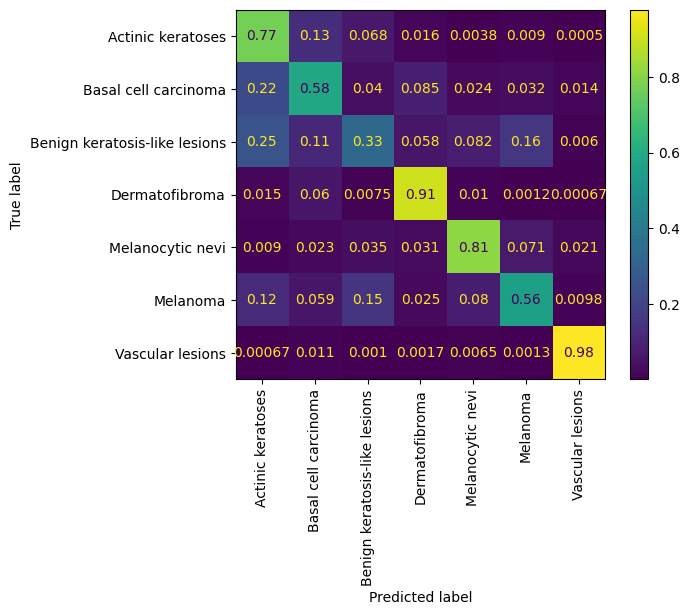

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.56      0.77      0.65      6000
         Basal cell carcinoma       0.60      0.58      0.59      6000
Benign keratosis-like lesions       0.52      0.33      0.40      6000
               Dermatofibroma       0.81      0.91      0.85      6000
             Melanocytic nevi       0.80      0.81      0.80      6000
                     Melanoma       0.67      0.56      0.61      6000
             Vascular lesions       0.95      0.98      0.96      6000

                     accuracy                           0.71     42000
                    macro avg       0.70      0.71      0.70     42000
                 weighted avg       0.70      0.71      0.70     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.7077
F-beta Score (macro averaging): 0.7418
F-beta Score (weighted averaging): 0.7418


## Tryout_6

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
last_output = last_layer.output

In [ ]:
x = GlobalMaxPooling2D()(last_output)

In [ ]:
layer_sizes = [256, 8, 32]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.3)(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

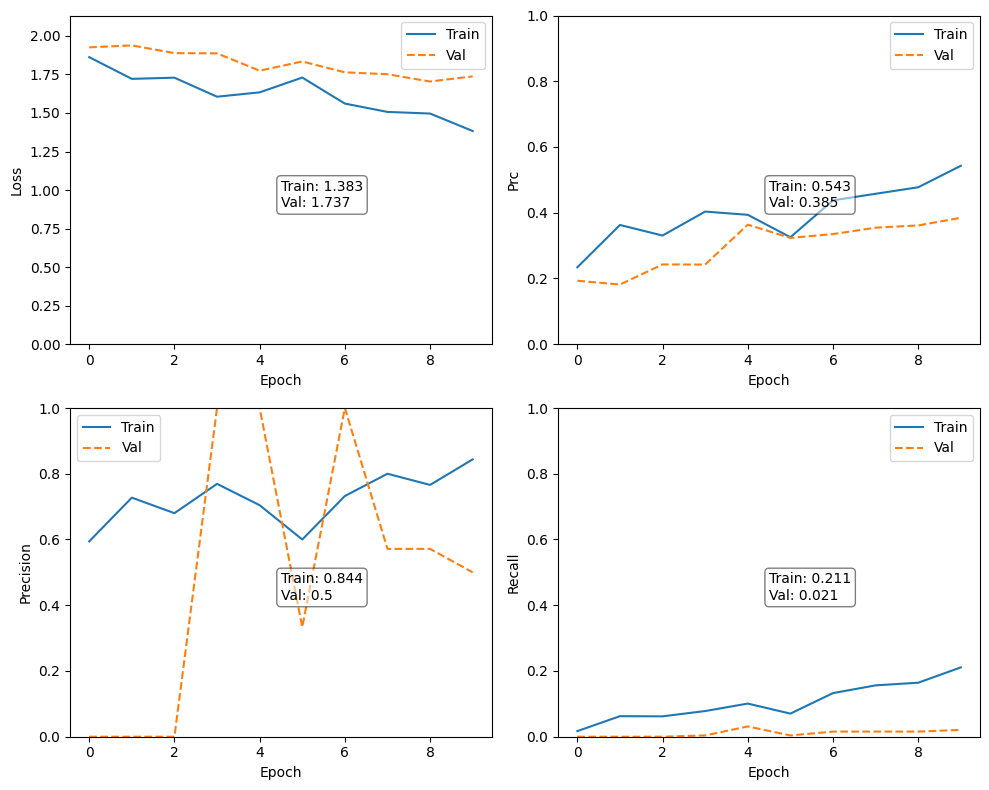

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 387ms/step


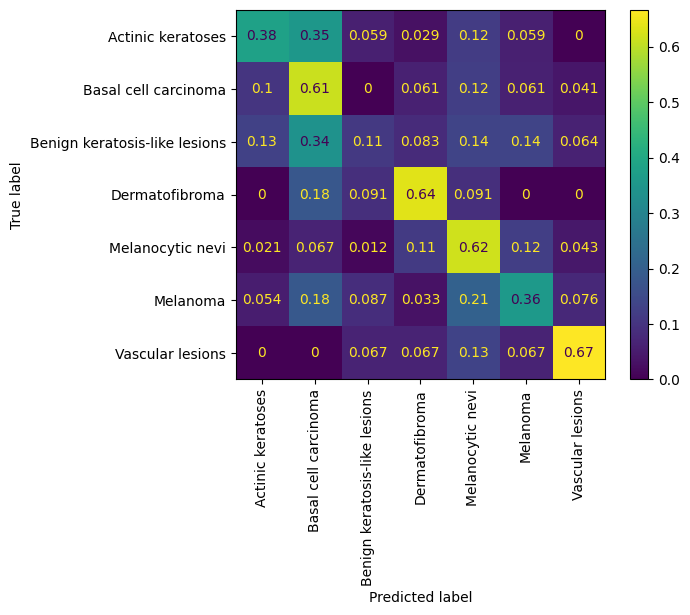

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        cmap='viridis',
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.24      0.38      0.30        34
         Basal cell carcinoma       0.20      0.61      0.30        49
Benign keratosis-like lesions       0.35      0.11      0.17       109
               Dermatofibroma       0.06      0.64      0.11        11
             Melanocytic nevi       0.91      0.62      0.74       810
                     Melanoma       0.21      0.36      0.27        92
             Vascular lesions       0.16      0.67      0.26        15

                     accuracy                           0.54      1120
                    macro avg       0.31      0.48      0.31      1120
                 weighted avg       0.73      0.54      0.60      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.2881
F-beta Score (macro averaging): 0.3585
F-beta Score (weighted averaging): 0.5535


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step


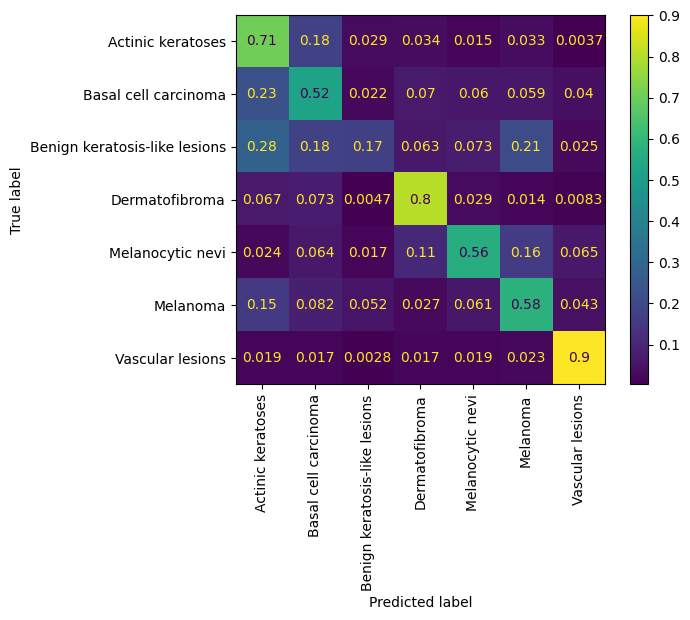

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.60      0.75      0.67      6000
         Basal cell carcinoma       0.64      0.75      0.69      6000
Benign keratosis-like lesions       0.66      0.34      0.45      6000
               Dermatofibroma       0.91      0.93      0.92      6000
             Melanocytic nevi       0.79      0.83      0.81      6000
                     Melanoma       0.68      0.66      0.67      6000
             Vascular lesions       0.95      0.97      0.96      6000

                     accuracy                           0.75     42000
                    macro avg       0.75      0.75      0.74     42000
                 weighted avg       0.75      0.75      0.74     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.7077
F-beta Score (macro averaging): 0.7418
F-beta Score (weighted averaging): 0.7418


## Tryout_7

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
last_output = last_layer.output

In [ ]:
x = Dropout(0.2)(last_output)
x = GlobalMaxPooling2D()(x)

In [ ]:
layer_sizes = [256, 32, 65]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.3)(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - cat_accuracy: 0.2220 - fbeta_score: 0.2205 - loss: 1.9019 - prc: 0.2112 - precision: 0.4195 - recall: 0.0139 - val_cat_accuracy: 0.5742 - val_fbeta_score: 0.2690 - val_loss: 1.4885 - val_prc: 0.6102 - val_precision: 0.9524 - val_recall: 0.0781 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - cat_accuracy: 0.3125 - fbeta_score: 0.3130 - loss: 1.7043 - prc: 0.3471 - precision: 0.6667 - recall: 0.0938 - val_cat_accuracy: 0.6055 - val_fbeta_score: 0.2050 - val_loss: 1.4279 - val_prc: 0.6619 - val_precision: 0.9333 - val_recall: 0.1094 - learning_rate: 1.0000e-04
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.4042 - fbeta_score: 0.3959 - loss: 1.5935 - prc: 0.4174 - precision: 0.7002 - recall: 0.1288 - val_cat_accuracy: 0.6562 - val_fbeta_score: 0.3141 - val_loss: 1.1192 - val_prc: 0.7622 - val_precision: 0.9205 - val_recall: 0.3164 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - cat_accuracy: 0.4219 - fbeta_score: 0.4180 - loss: 1.4362 - prc: 0.5170 - precision: 0.7931 - recall: 0.1797 - val_cat_accuracy: 0.6484 - val_fbeta_score: 0.3550 - val_loss: 1.1644 - val_prc: 0.7264 - val_precision: 0.8969 - val_recall: 0.3398 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.4732 - fbeta_score: 0.4653 - loss: 1.4265 - prc: 0.5142 - precision: 0.7395 - recall: 0.2173 - val_cat_accuracy: 0.6979 - val_fbeta_score: 0.3204 - val_loss: 1.0430 - val_prc: 0.7661 - val_precision: 0.8511 - val_recall: 0.4167 - learning_rate: 1.0000e-04
Epoch 6/50
328/328 ━━━━━━━━

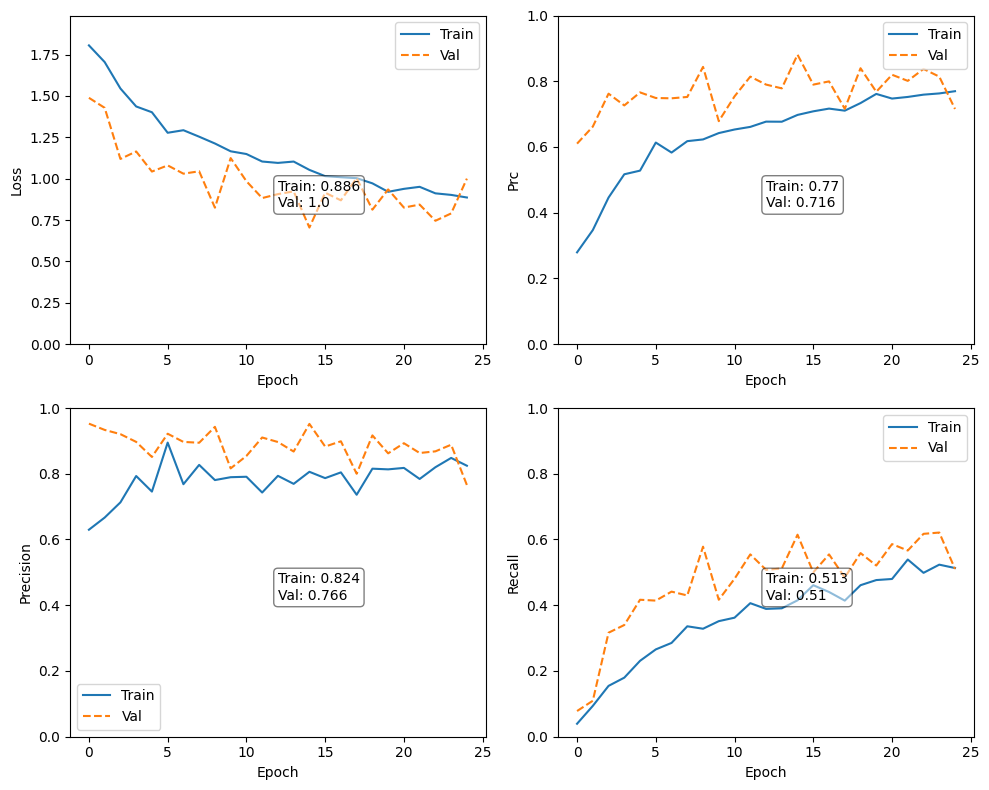

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 395ms/step


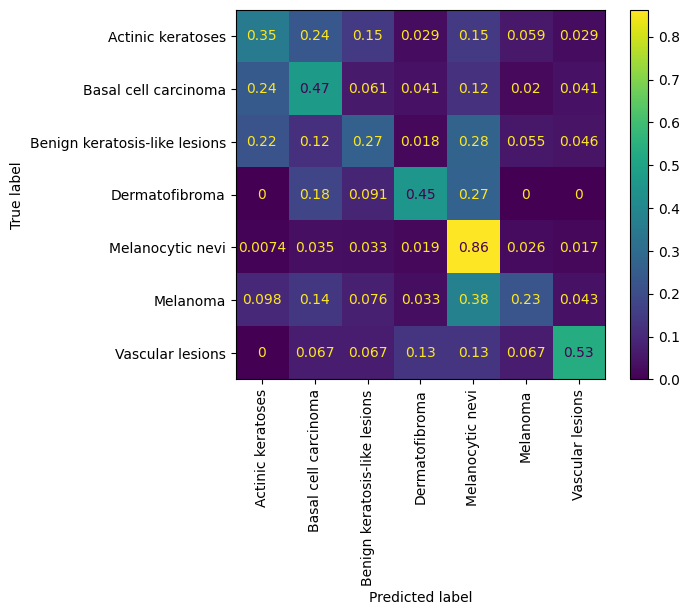

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.19      0.35      0.25        34
         Basal cell carcinoma       0.26      0.47      0.34        49
Benign keratosis-like lesions       0.40      0.27      0.32       109
               Dermatofibroma       0.17      0.45      0.24        11
             Melanocytic nevi       0.90      0.86      0.88       810
                     Melanoma       0.40      0.23      0.29        92
             Vascular lesions       0.24      0.53      0.33        15

                     accuracy                           0.71      1120
                    macro avg       0.36      0.45      0.38      1120
                 weighted avg       0.74      0.71      0.72      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.4023
F-beta Score (macro averaging): 0.4106
F-beta Score (weighted averaging): 0.7129


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step


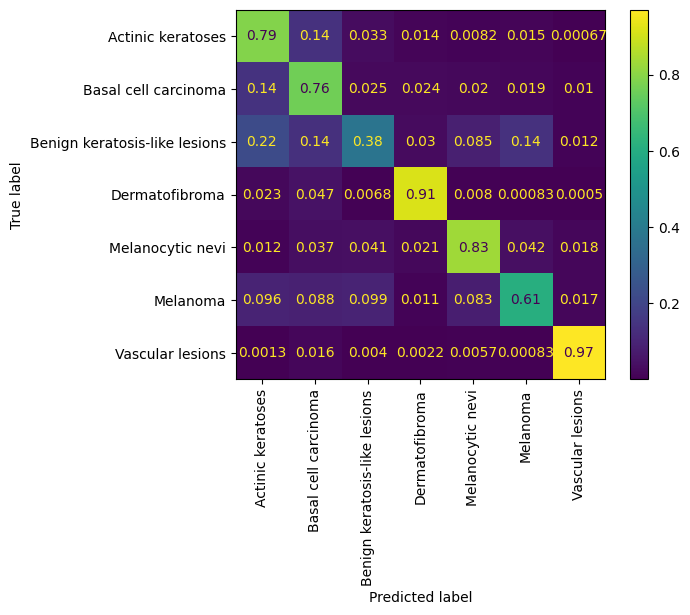

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.61      0.79      0.69      6000
         Basal cell carcinoma       0.62      0.76      0.68      6000
Benign keratosis-like lesions       0.64      0.38      0.47      6000
               Dermatofibroma       0.90      0.91      0.91      6000
             Melanocytic nevi       0.80      0.83      0.81      6000
                     Melanoma       0.74      0.61      0.67      6000
             Vascular lesions       0.94      0.97      0.96      6000

                     accuracy                           0.75     42000
                    macro avg       0.75      0.75      0.74     42000
                 weighted avg       0.75      0.75      0.74     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.7107
F-beta Score (macro averaging): 0.7448
F-beta Score (weighted averaging): 0.7448


## Tryout_8

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
last_output = last_layer.output

In [ ]:
x = GlobalMaxPooling2D()(last_output)

In [ ]:
layer_sizes = [256, 32, 64]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization()(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - cat_accuracy: 0.3701 - fbeta_score: 0.3664 - loss: 1.7450 - prc: 0.3791 - precision: 0.5445 - recall: 0.1866 - val_cat_accuracy: 0.6484 - val_fbeta_score: 0.3710 - val_loss: 0.9811 - val_prc: 0.7577 - val_precision: 0.8714 - val_recall: 0.4766 - learning_rate: 0.0010
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 418us/step - cat_accuracy: 0.5312 - fbeta_score: 0.5367 - loss: 1.2411 - prc: 0.5892 - precision: 0.7258 - recall: 0.3516 - val_cat_accuracy: 0.6133 - val_fbeta_score: 0.3131 - val_loss: 1.1100 - val_prc: 0.6807 - val_precision: 0.8560 - val_recall: 0.4180 - learning_rate: 0.0010
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - cat_accuracy: 0.5560 - fbeta_score: 0.5529 - loss: 1.1800 - prc: 0.6310 - precision: 0.7557 - recall: 0.3570 - val_cat_accuracy: 0.7070 - val_fbeta_score: 0.2997 - val_loss: 0.8596 - val_prc: 0.7943 - val_precision: 0.8706 - val_recall: 0.5781 - learning_rate: 0.0010
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - cat_accuracy: 0.5391 - fbeta_score: 0.5321 - loss: 1.1141 - prc: 0.6599 - precision: 0.7812 - recall: 0.3906 - val_cat_accuracy: 0.6836 - val_fbeta_score: 0.3461 - val_loss: 0.8821 - val_prc: 0.7877 - val_precision: 0.8529 - val_recall: 0.5664 - learning_rate: 0.0010
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - cat_accuracy: 0.6007 - fbeta_score: 0.5976 - loss: 1.0520 - prc: 0.6891 - precision: 0.7737 - recall: 0.4250 - val_cat_accuracy: 0.6354 - val_fbeta_score: 0.2962 - val_loss: 1.0360 - val_prc: 0.7088 - val_precision: 0.7925 - val_recall: 0.4375 - learning_rate: 0.0010
Epoch 6/50
328/328 ━━━━━━━━━━━━━━━━━━━━

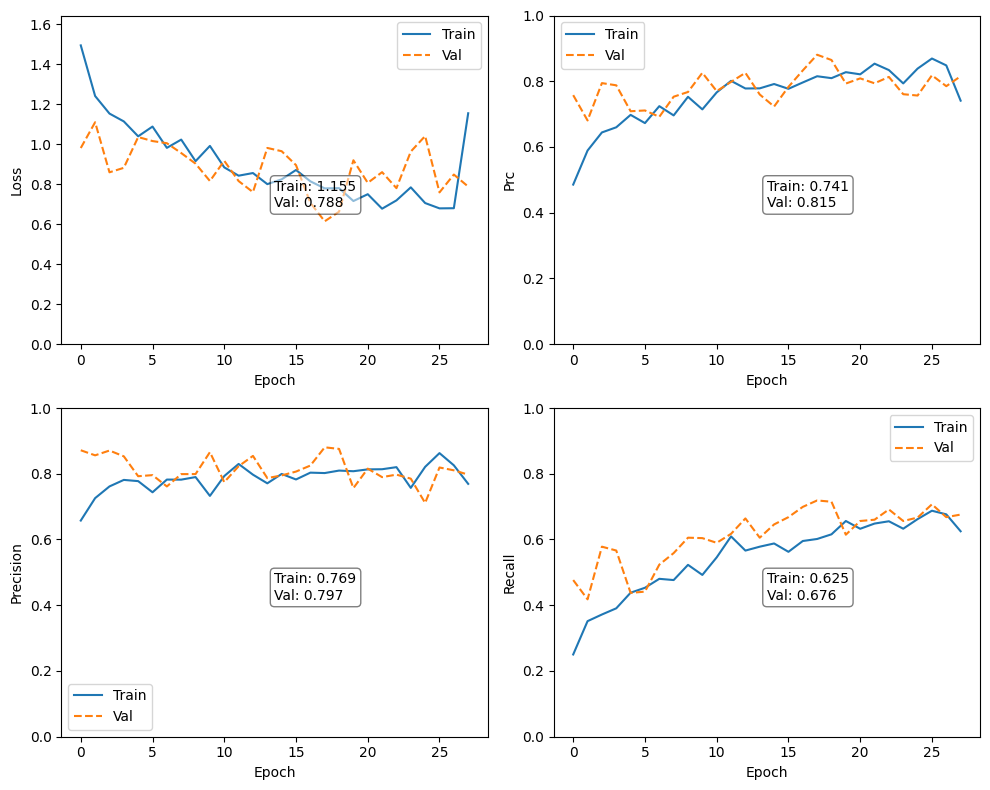

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 10s 904ms/step


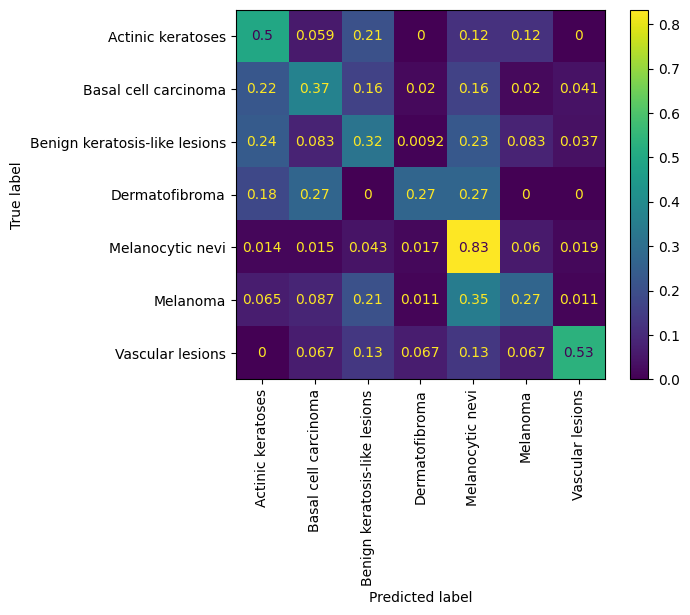

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.23      0.50      0.32        34
         Basal cell carcinoma       0.34      0.37      0.35        49
Benign keratosis-like lesions       0.33      0.32      0.33       109
               Dermatofibroma       0.14      0.27      0.19        11
             Melanocytic nevi       0.90      0.83      0.87       810
                     Melanoma       0.28      0.27      0.28        92
             Vascular lesions       0.27      0.53      0.36        15

                     accuracy                           0.70      1120
                    macro avg       0.36      0.44      0.38      1120
                 weighted avg       0.73      0.70      0.71      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.3917
F-beta Score (macro averaging): 0.4121
F-beta Score (weighted averaging): 0.7014


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step


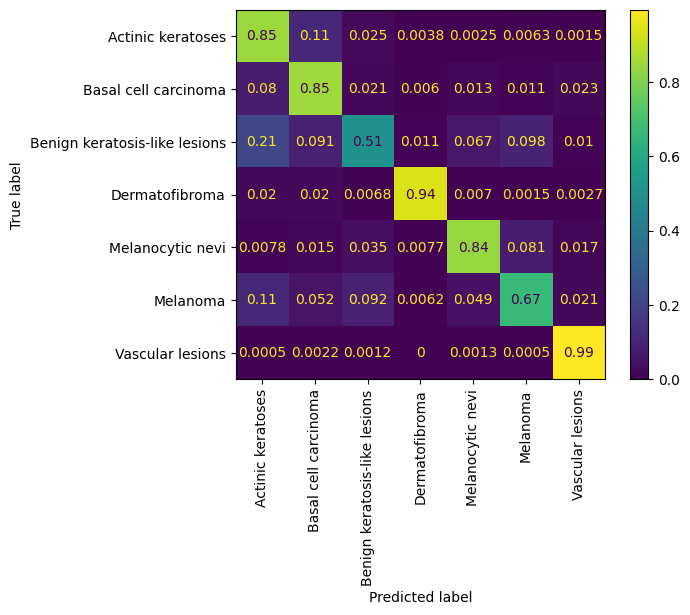

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.66      0.85      0.74      6000
         Basal cell carcinoma       0.74      0.85      0.79      6000
Benign keratosis-like lesions       0.74      0.51      0.60      6000
               Dermatofibroma       0.96      0.94      0.95      6000
             Melanocytic nevi       0.86      0.84      0.85      6000
                     Melanoma       0.77      0.67      0.72      6000
             Vascular lesions       0.93      0.99      0.96      6000

                     accuracy                           0.81     42000
                    macro avg       0.81      0.81      0.80     42000
                 weighted avg       0.81      0.81      0.80     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.7764
F-beta Score (macro averaging): 0.8036
F-beta Score (weighted averaging): 0.8036


## Tryout_9 (freeze as in tryout_3 + warm start)

In [ ]:
xception_model = Xception(include_top=False,
                          weights="imagenet",
                          input_shape=(75, 100, 3))

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

In [ ]:
last_layer = xception_model.get_layer('block14_sepconv2_act')
last_output = last_layer.output

In [ ]:
x = GlobalMaxPooling2D()(last_output)

In [ ]:
layer_sizes = [256, 32, 64]
for size in layer_sizes:
    x = Dense(size, activation='relu')(x)
    x = Dropout(0.25)(x)
    x = BatchNormalization()(x)

predictions = Dense(7, activation='softmax')(x)

In [ ]:
metrics = [
      keras.metrics.FBetaScore(beta=2.0, name='fbeta_score'),
      keras.metrics.CategoricalAccuracy(name='cat_accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='prc', curve='PR'),
]

In [ ]:
model = Model(xception_model.input, predictions)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=metrics)

In [ ]:
early_stopping_monitor = EarlyStopping(monitor='val_loss', patience=10)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=0.001)

In [ ]:
batch_size = 128
epochs = 50
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - cat_accuracy: 0.2518 - fbeta_score: 0.2478 - loss: 2.1011 - prc: 0.2349 - precision: 0.3431 - recall: 0.0948 - val_cat_accuracy: 0.5312 - val_fbeta_score: 0.2942 - val_loss: 1.3189 - val_prc: 0.6092 - val_precision: 0.8571 - val_recall: 0.2578 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - cat_accuracy: 0.3594 - fbeta_score: 0.3689 - loss: 1.6588 - prc: 0.3756 - precision: 0.4681 - recall: 0.1719 - val_cat_accuracy: 0.5195 - val_fbeta_score: 0.1690 - val_loss: 1.2966 - val_prc: 0.6357 - val_precision: 0.9014 - val_recall: 0.2500 - learning_rate: 1.0000e-04
Epoch 3/50


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - cat_accuracy: 0.3998 - fbeta_score: 0.3926 - loss: 1.6177 - prc: 0.4212 - precision: 0.5967 - recall: 0.2089 - val_cat_accuracy: 0.6445 - val_fbeta_score: 0.2602 - val_loss: 1.0802 - val_prc: 0.7252 - val_precision: 0.8881 - val_recall: 0.4648 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - cat_accuracy: 0.3438 - fbeta_score: 0.3495 - loss: 1.7159 - prc: 0.3754 - precision: 0.4390 - recall: 0.1406 - val_cat_accuracy: 0.5859 - val_fbeta_score: 0.3109 - val_loss: 1.1321 - val_prc: 0.6901 - val_precision: 0.8793 - val_recall: 0.3984 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - cat_accuracy: 0.4613 - fbeta_score: 0.4530 - loss: 1.4425 - prc: 0.5082 - precision: 0.6746 - recall: 0.2714 - val_cat_accuracy: 0.6250 - val_fbeta_score: 0.3188 - val_loss: 1.1101 - val_prc: 0.7003 - val_precision: 0.8750 - val_recall: 0.4375 - learning_rate: 1.0000e-04
Epoch 6/50
328/328 ━━━━━━━━

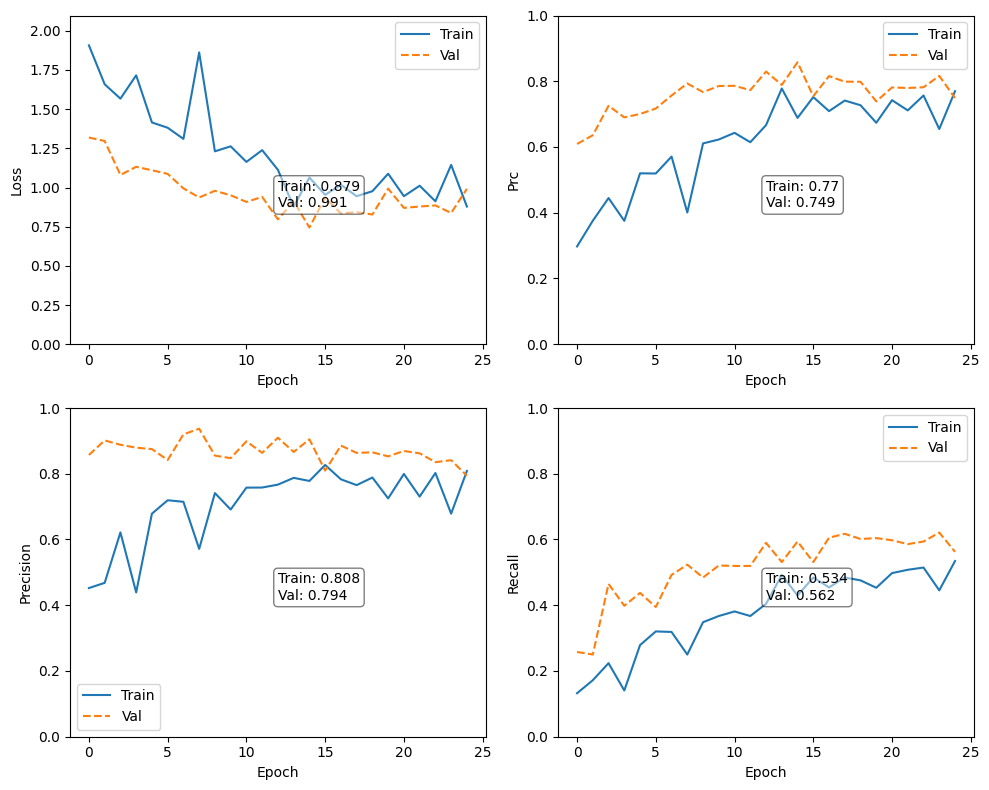

In [ ]:
plot_metrics(history)

In [ ]:
for layer in model.layers:
    layer.trainable = True

In [ ]:
batch_size = 128
epochs = 10
history = model.fit(train_datagen_6000.flow(X_balanced_6000_train, y_balanced_6000_train, batch_size=batch_size),
                              epochs = epochs,
                              validation_data = val_datagen.flow(X_valid, y_valid),
                              verbose = 1,
                              steps_per_epoch=(X_balanced_6000_train.shape[0] // batch_size),
                              validation_steps=(X_valid.shape[0] // batch_size),
                              callbacks=[early_stopping_monitor, reduce_lr])

Epoch 1/10
  3/328 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - cat_accuracy: 0.6866 - fbeta_score: 0.6942 - loss: 0.8110 - prc: 0.7971 - precision: 0.8470 - recall: 0.5716 

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - cat_accuracy: 0.6849 - fbeta_score: 0.6834 - loss: 0.8478 - prc: 0.7836 - precision: 0.8139 - recall: 0.5507 - val_cat_accuracy: 0.6992 - val_fbeta_score: 0.3124 - val_loss: 0.8680 - val_prc: 0.7857 - val_precision: 0.8466 - val_recall: 0.5820 - learning_rate: 1.0000e-04
Epoch 2/10
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - cat_accuracy: 0.7344 - fbeta_score: 0.7174 - loss: 0.7641 - prc: 0.8111 - precision: 0.7931 - recall: 0.5391 - val_cat_accuracy: 0.7500 - val_fbeta_score: 0.4432 - val_loss: 0.7869 - val_prc: 0.8257 - val_precision: 0.8488 - val_recall: 0.6797 - learning_rate: 1.0000e-04
Epoch 3/10


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - cat_accuracy: 0.6928 - fbeta_score: 0.6917 - loss: 0.8243 - prc: 0.7934 - precision: 0.8190 - recall: 0.5654 - val_cat_accuracy: 0.7500 - val_fbeta_score: 0.4210 - val_loss: 0.7086 - val_prc: 0.8491 - val_precision: 0.8865 - val_recall: 0.6406 - learning_rate: 1.0000e-04
Epoch 4/10
328/328 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - cat_accuracy: 0.6562 - fbeta_score: 0.6680 - loss: 0.8876 - prc: 0.7515 - precision: 0.7619 - recall: 0.5000 - val_cat_accuracy: 0.7188 - val_fbeta_score: 0.4382 - val_loss: 0.8819 - val_prc: 0.7794 - val_precision: 0.8298 - val_recall: 0.6094 - learning_rate: 1.0000e-04
Epoch 5/10
328/328 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - cat_accuracy: 0.7054 - fbeta_score: 0.7034 - loss: 0.7931 - prc: 0.8048 - precision: 0.8243 - recall: 0.5827 - val_cat_accuracy: 0.7500 - val_fbeta_score: 0.3793 - val_loss: 0.5900 - val_prc: 0.8863 - val_precision: 0.8947 - val_recall: 0.7083 - learning_rate: 1.0000e-04
Epoch 6/10
328/328 ━━━━━━━━

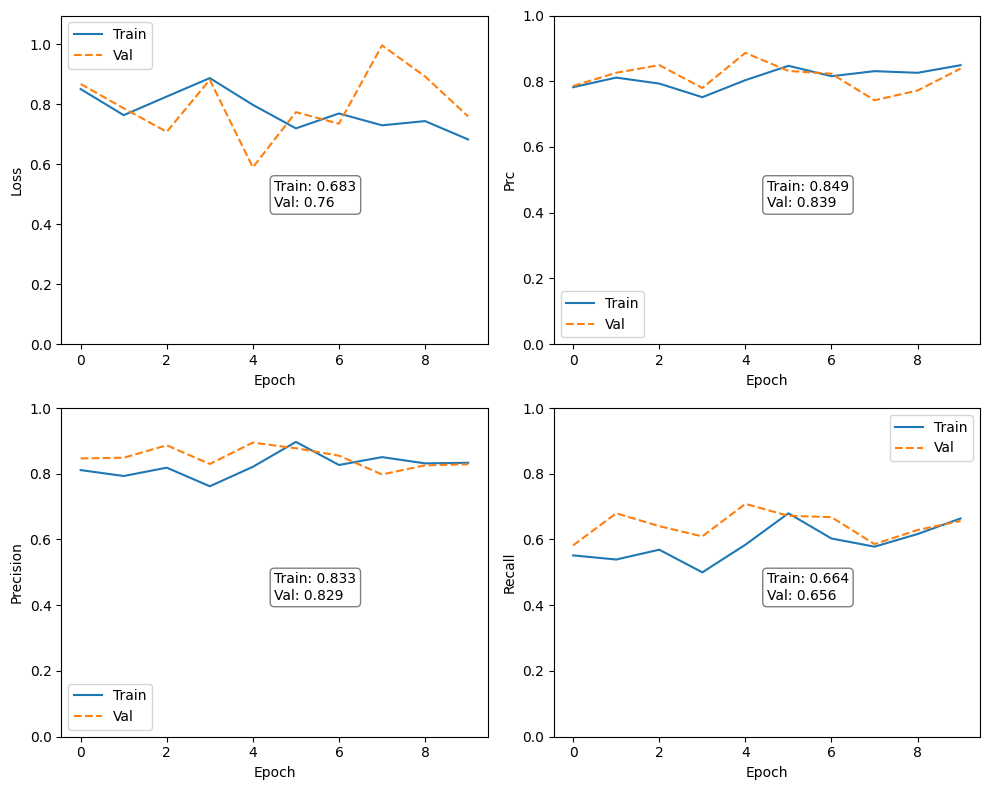

In [ ]:
plot_metrics(history)

In [ ]:
class_names = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma',
    4: 'Melanocytic nevi',
    5: 'Melanoma',
    6: 'Vascular lesions'
}

display_labels = [class_names[i] for i in range(len(class_names))]

In [ ]:
model_valid_preds = model.predict(X_valid, batch_size = 128)

9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 362ms/step


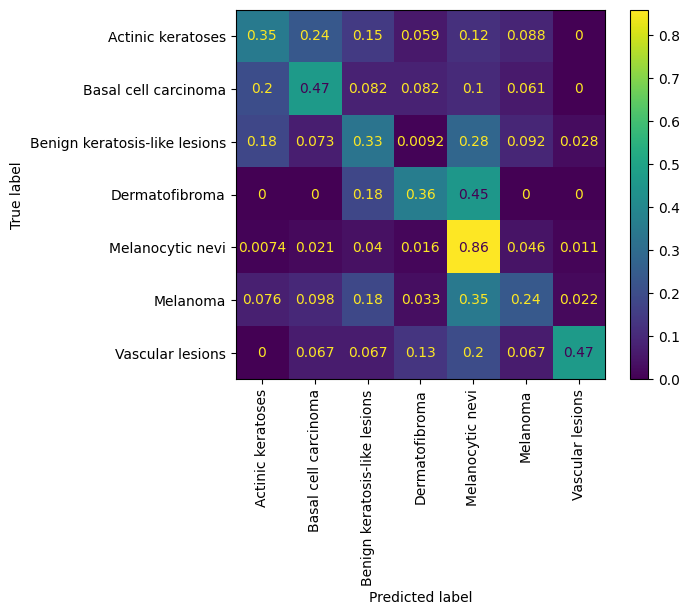

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_valid.argmax(axis=1),
                                        model_valid_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_valid.argmax(axis=1),
                            model_valid_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.22      0.35      0.27        34
         Basal cell carcinoma       0.35      0.47      0.40        49
Benign keratosis-like lesions       0.37      0.33      0.35       109
               Dermatofibroma       0.14      0.36      0.20        11
             Melanocytic nevi       0.90      0.86      0.88       810
                     Melanoma       0.29      0.24      0.26        92
             Vascular lesions       0.33      0.47      0.39        15

                     accuracy                           0.71      1120
                    macro avg       0.37      0.44      0.39      1120
                 weighted avg       0.74      0.71      0.72      1120



In [ ]:
calculate_and_print_scores(y_valid.argmax(axis=1), model_valid_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.4065
F-beta Score (macro averaging): 0.4159
F-beta Score (weighted averaging): 0.7171


In [ ]:
model_train_preds = model.predict(X_balanced_6000_train, batch_size = 128)

329/329 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step


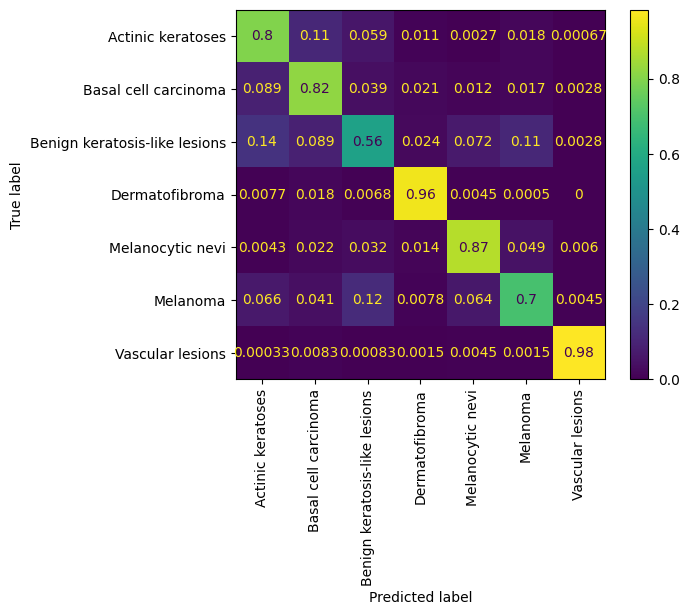

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_balanced_6000_train.argmax(axis=1),
                                        model_train_preds.argmax(axis=1),
                                        display_labels=display_labels,
                                        xticks_rotation = "vertical",
                                        normalize='true')

In [ ]:
print(classification_report(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1),
                            target_names=display_labels))

                               precision    recall  f1-score   support

            Actinic keratoses       0.74      0.84      0.79      6000
         Basal cell carcinoma       0.76      0.87      0.81      6000
Benign keratosis-like lesions       0.79      0.53      0.64      6000
               Dermatofibroma       0.96      0.97      0.96      6000
             Melanocytic nevi       0.86      0.89      0.87      6000
                     Melanoma       0.79      0.77      0.78      6000
             Vascular lesions       0.99      0.99      0.99      6000

                     accuracy                           0.84     42000
                    macro avg       0.84      0.84      0.83     42000
                 weighted avg       0.84      0.84      0.83     42000



In [ ]:
calculate_and_print_scores(y_balanced_6000_train.argmax(axis=1),
                            model_train_preds.argmax(axis=1))

Matthews Correlation Coefficient (MCC): 0.8121
F-beta Score (macro averaging): 0.8352
F-beta Score (weighted averaging): 0.8352
